# Exploring Climate Change

In [ ]:
!pip install miceforest

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 57 kB 1.1 MB/s 
     |████████████████████████████████| 2.6 MB 7.7 MB/s 
     |████████████████████████████████| 2.0 MB 44.6 MB/s 
  Attempting uninstall: lightgbm
    Found existing installation: lightgbm 2.2.3
    Uninstalling lightgbm-2.2.3:
      Successfully uninstalled lightgbm-2.2.3


In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import miceforest as mf
import re
from sklearn.preprocessing import StandardScaler, MinMaxScaler
from sklearn.model_selection import train_test_split, GridSearchCV, RandomizedSearchCV
from sklearn.metrics import f1_score, make_scorer, classification_report
from sklearn.svm import LinearSVC
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier, AdaBoostClassifier
from sklearn.neighbors import KNeighborsClassifier

sns.set_theme(style='white')




## Loading the Data

In [ ]:
path = 'data/API.csv'
df_raw = pd.read_csv(path,
    skiprows = 4)

In [ ]:
income = pd.read_csv('data/Metadata_Country.csv')

In [ ]:
df_raw.head()

,Country Name,Country Code,Indicator Name,Indicator Code,1960,1961,1962,1963,1964,1965,...,2013,2014,2015,2016,2017,2018,2019,2020,2021,Unnamed: 66
0,Aruba,ABW,Urban population (% of total population),SP.URB.TOTL.IN.ZS,50.776,50.761000,50.746000,50.730000,50.715000,50.700000,...,42.990000,43.041000,43.108000,43.192000,43.293000,43.411000,43.546000,43.697000,43.866000,NaN
1,Aruba,ABW,Urban population,SP.URB.TOTL,27525.000,28139.000000,28537.000000,28763.000000,28922.000000,29080.000000,...,44351.000000,44666.000000,44978.000000,45293.000000,45614.000000,45949.000000,46294.000000,46654.000000,47022.000000,NaN
2,Aruba,ABW,Urban population growth (annual %),SP.URB.GROW,NaN,2.206183,1.404498,0.788835,0.551271,0.544810,...,0.660561,0.707733,0.696090,0.697901,0.706219,0.731740,0.748028,0.774631,0.785691,NaN
3,Aruba,ABW,"Population, total",SP.POP.TOTL,54208.000,55434.000000,56234.000000,56699.000000,57029.000000,57357.000000,...,103165.000000,103776.000000,104339.000000,104865.000000,105361.000000,105846.000000,106310.000000,106766.000000,107195.000000,NaN
4,Aruba,ABW,Population growth (annual %),SP.POP.GROW,NaN,2.236462,1.432843,0.823502,0.580334,0.573498,...,0.583290,0.590508,0.541048,0.502860,0.471874,0.459266,0.437415,0.428017,0.401008,NaN


In [ ]:
#grab country and associated income group
income_class = income[['Country Code', 'IncomeGroup']]

#drop missing values from income group which corresponded to regions instead of actual countries
income_class.dropna(inplace=True)
income_class

#noticed that there are 216 countries instead of 217. This is because Venezuela has no classified income group

/var/folders/m9/7g3cvw9n5sg_zp_crb6jb_jw0000gn/T/ipykernel_38971/1921444776.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  income_class.dropna(inplace=True)


,Country Code,IncomeGroup
0,ABW,High income
2,AFG,Low income
4,AGO,Lower middle income
5,ALB,Upper middle income
6,AND,High income
...,...,...
260,XKX,Upper middle income
261,YEM,Low income
262,ZAF,Upper middle income
263,ZMB,Low income


In [ ]:
#gather unique income group / class
income_class['IncomeGroup'].unique()

array(['High income', 'Low income', 'Lower middle income',
       'Upper middle income'], dtype=object)

In [ ]:
df_raw['Country Name']

0           Aruba
1           Aruba
2           Aruba
3           Aruba
4           Aruba
           ...   
20211    Zimbabwe
20212    Zimbabwe
20213    Zimbabwe
20214    Zimbabwe
20215    Zimbabwe
Name: Country Name, Length: 20216, dtype: object

In [ ]:
#placing variable years with 1 year spacing
years = [str(i) for i in range(1960, 2022, 1)]

In [ ]:
#transposing rows to columns, dropping unnecessary columns, 
#melting & pivoting data where index = country code and year and column = indicator name (features)
df_pivoted = df_raw.\
    drop(columns = ['Country Name', 'Indicator Code', 'Unnamed: 66']).\
    melt(id_vars = ['Country Code', 'Indicator Name'], 
         value_vars = years,
         var_name = 'Year').\
    pivot(index = ['Country Code', 'Year'], columns = 'Indicator Name')['value']

In [ ]:
df_pivoted

Indicator Name     Access to electricity (% of population)  \
Country Code Year                                            
ABW          1960                                      NaN   
             1961                                      NaN   
             1962                                      NaN   
             1963                                      NaN   
             1964                                      NaN   
...                                                    ...   
ZWE          2017                                44.178635   
             2018                                45.572647   
             2019                                46.781475   
             2020                                52.747669   
             2021                                      NaN   

Indicator Name     Agricultural irrigated land (% of total agricultural land)  \
Country Code Year                                                               
ABW          1960                                                NaN            
             1961                                                NaN            
             1962                                                NaN            
             1963                                                NaN            
             1964                                                NaN            
...                                                              ...            
ZWE          2017                                                NaN            
             2018                                                NaN            
             2019                                                NaN            
             2020                                                NaN            
             2021                                                NaN            

Indicator Name     Agricultural land (% of land area)  \
Country Code Year                                       
ABW          1960                                 NaN   
             1961                           11.111111   
             1962                           11.111111   
             1963                           11.111111   
             1964                           11.111111   
...                                               ...   
ZWE          2017                           41.876696   
             2018                           41.876696   
             2019                           41.876696   
             2020                           41.876696   
             2021                                 NaN   

Indicator Name     Agricultural land (sq. km)  \
Country Code Year                               
ABW          1960                         NaN   
             1961                        20.0   
             1962                        20.0   
             1963                        20.0   
             1964                        20.0   
...                                       ...   
ZWE          2017                    162000.0   
             2018                    162000.0   
             2019                    162000.0   
             2020                    162000.0   
             2021                         NaN   

Indicator Name     Agriculture, forestry, and fishing, value added (% of GDP)  \
Country Code Year                                                               
ABW          1960                                                NaN            
             1961                                                NaN            
             1962                                                NaN            
             1963                                                NaN            
             1964                                                NaN            
...                                                              ...            
ZWE          2017                                           8.340969            
             2018             

Dealing with Missing Values

In [ ]:
df_pivoted.isna().sum().sort_values()

Indicator Name
Population, total                                                                105
Urban population (% of total population)                                         196
Urban population                                                                 229
Population growth (annual %)                                                     372
Urban population growth (annual %)                                               493
                                                                               ...  
SF6 gas emissions (thousand metric tons of CO2 equivalent)                     15815
Community health workers (per 1,000 people)                                    16279
Ease of doing business rank (1=most business-friendly regulations)             16303
Droughts, floods, extreme temperatures (% of population, average 1990-2009)    16324
Disaster risk reduction progress score (1-5 scale; 5=best)                     16409
Length: 76, dtype: int64

In [ ]:
# If the majority of countries can't measure a feature for many years, it doesn't help us with anything. 
# Remove variables that have more than 80 % missing data
variables = df_pivoted.isna().sum().sort_values()\
    [df_pivoted.isna().sum().sort_values() < 13193].\
    index.to_list()

In [ ]:
variables

['Population, total',
 'Urban population (% of total population)',
 'Urban population',
 'Population growth (annual %)',
 'Urban population growth (annual %)',
 'Agricultural land (% of land area)',
 'Agricultural land (sq. km)',
 'Arable land (% of land area)',
 'CO2 emissions from liquid fuel consumption (kt)',
 'CO2 emissions from gaseous fuel consumption (kt)',
 'Cereal yield (kg per hectare)',
 'CO2 emissions from solid fuel consumption (kt)',
 'Mortality rate, under-5 (per 1,000 live births)',
 'CO2 emissions from gaseous fuel consumption (% of total)',
 'CO2 emissions from liquid fuel consumption (% of total)',
 'CO2 emissions from solid fuel consumption (% of total)',
 'Other greenhouse gas emissions, HFC, PFC and SF6 (thousand metric tons of CO2 equivalent)',
 'Foreign direct investment, net inflows (% of GDP)',
 'Agriculture, forestry, and fishing, value added (% of GDP)',
 'Population in urban agglomerations of more than 1 million (% of total population)',
 'Electricity prod

In [ ]:
len(variables)

50

In [ ]:
df_all = df_pivoted[variables]

In [ ]:
df_all

Indicator Name     Population, total  \
Country Code Year                      
ABW          1960            54208.0   
             1961            55434.0   
             1962            56234.0   
             1963            56699.0   
             1964            57029.0   
...                              ...   
ZWE          2017         14236599.0   
             2018         14438812.0   
             2019         14645473.0   
             2020         14862927.0   
             2021         15092171.0   

Indicator Name     Urban population (% of total population)  Urban population  \
Country Code Year                                                               
ABW          1960                                    50.776           27525.0   
             1961                                    50.761           28139.0   
             1962                                    50.746           28537.0   
             1963                                    50.730           28763.0   
             1964                                    50.715           28922.0   
...                                                     ...               ...   
ZWE          2017                                    32.237         4589452.0   
             2018                                    32.209         4650597.0   
             2019                                    32.210         4717307.0   
             2020                                    32.242         4792105.0   
             2021                                    32.303         4875224.0   

Indicator Name     Population growth (annual %)  \
Country Code Year                                 
ABW          1960                           NaN   
             1961                      2.236462   
             1962                      1.432843   
             1963                      0.823502   
             1964                      0.580334   
...                                         ...   
ZWE          2017                      1.459406   
             2018                      1.410382   
             2019                      1.421142   
             2020                      1.473871   
             2021                      1.530614   

Indicator Name     Urban population growth (annual %)  \
Country Code Year                                       
ABW          1960                                 NaN   
             1961                            2.206183   
             1962                            1.404498   
             1963                            0.788835   
             1964                            0.551271   
...                                               ...   
ZWE          2017                            1.276544   
             2018                            1.323497   
             2019                            1.424249   
             2020                            1.573169   
             2021                            1.719628   

Indicator Name     Agricultural land (% of land area)  \
Country Code Year                                       
ABW          1960                                 NaN   
             1961                           11.111111   
             1962                           11.111111   
             1963                           11.111111   
             1964                           11.111111   
...                                               ...   
ZWE          2017                           41.876696   
             2018                           41.876696   
             2019                           41.876696   
             2020                           41.876696   
             2021                                 NaN   

Indicator Name     Agricultural land (sq. km)  Arable land (% of land area)  \
Country Code Year                                                             
ABW          1960                         NaN                           NaN   
             1961                       

In [ ]:
df_merged = df_all.reset_index().merge(income_class).set_index('Country Code')

In [ ]:
df = df_merged
df

,Year,"Population, total",Urban population (% of total population),Urban population,Population growth (annual %),Urban population growth (annual %),Agricultural land (% of land area),Agricultural land (sq. km),Arable land (% of land area),CO2 emissions from liquid fuel consumption (kt),...,Renewable electricity output (% of total electricity output),CO2 emissions (kg per 2015 US$ of GDP),CO2 emissions (kg per PPP $ of GDP),CO2 emissions (kg per 2017 PPP $ of GDP),Nitrous oxide emissions (% change from 1990),Methane emissions (% change from 1990),Other greenhouse gas emissions (% change from 1990),Total greenhouse gas emissions (% change from 1990),"Energy use (kg of oil equivalent) per $1,000 GDP (constant 2017 PPP)",IncomeGroup
Country Code,,,,,,,,,,,,,,,,,,,,,
ABW,1960,54208.0,50.776,27525.0,NaN,NaN,NaN,NaN,NaN,11092.675,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,High income
ABW,1961,55434.0,50.761,28139.0,2.236462,2.206183,11.111111,20.0,11.111111,11576.719,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,High income
ABW,1962,56234.0,50.746,28537.0,1.432843,1.404498,11.111111,20.0,11.111111,12713.489,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,High income
ABW,1963,56699.0,50.730,28763.0,0.823502,0.788835,11.111111,20.0,11.111111,12178.107,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,High income
ABW,1964,57029.0,50.715,28922.0,0.580334,0.551271,11.111111,20.0,11.111111,11840.743,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,High income
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
ZWE,2017,14236599.0,32.237,4589452.0,1.459406,1.276544,41.876696,162000.0,10.339925,NaN,...,NaN,0.490948,0.300613,0.300613,NaN,NaN,NaN,NaN,NaN,Lower middle income
ZWE,2018,14438812.0,32.209,4650597.0,1.410382,1.323497,41.876696,162000.0,10.339925,NaN,...,NaN,0.560756,0.335346,0.343358,NaN,NaN,NaN,NaN,NaN,Lower middle income
ZWE,2019,14645473.0,32.210,4717307.0,1.421142,1.424249,41.876696,162000.0,10.339925,NaN,...,NaN,0.567545,0.333441,0.347514,NaN,NaN,NaN,NaN,NaN,Lower middle income


In [ ]:
df.columns

Index(['Year', 'Population, total', 'Urban population (% of total population)',
       'Urban population', 'Population growth (annual %)',
       'Urban population growth (annual %)',
       'Agricultural land (% of land area)', 'Agricultural land (sq. km)',
       'Arable land (% of land area)',
       'CO2 emissions from liquid fuel consumption (kt)',
       'CO2 emissions from gaseous fuel consumption (kt)',
       'Cereal yield (kg per hectare)',
       'CO2 emissions from solid fuel consumption (kt)',
       'Mortality rate, under-5 (per 1,000 live births)',
       'CO2 emissions from gaseous fuel consumption (% of total)',
       'CO2 emissions from liquid fuel consumption (% of total)',
       'CO2 emissions from solid fuel consumption (% of total)',
       'Other greenhouse gas emissions, HFC, PFC and SF6 (thousand metric tons of CO2 equivalent)',
       'Foreign direct investment, net inflows (% of GDP)',
       'Agriculture, forestry, and fishing, value added (% of GDP)',
   

In [ ]:
#Through more analysis at looking closely at the data it was found that these features contained inconsistent data and some variables overlapped deeming these variables unnecessary
vars_to_remove = ['Community health workers (per 1,000 people)', 
                  'CPIA public sector management and institutions cluster average (1=low to 6=high)', 
                  'Ease of doing business rank (1=most business-friendly regulations)', 
                  'Population living in areas where elevation is below 5 meters (% of total population)', 
                  'Urban population living in areas where elevation is below 5 meters (% of total population)', 
                  'Rural population living in areas where elevation is below 5 meters (% of total population)', 
                  'Droughts, floods, extreme temperatures (% of population, average 1990-2009)',
                  'GHG net emissions/removals by LUCF (Mt of CO2 equivalent)',
                  'Disaster risk reduction progress score (1-5 scale; 5=best)', 
                  'SF6 gas emissions (thousand metric tons of CO2 equivalent)', 
                  'PFC gas emissions (thousand metric tons of CO2 equivalent)', 
                  'HFC gas emissions (thousand metric tons of CO2 equivalent)', 
                  'CO2 emissions (kg per PPP $ of GDP)', 
                  'CO2 emissions (metric tons per capita)', 
                  'Agricultural irrigated land (% of total agricultural land)', 
                  'Forest area (% of land area)', 
                  'Land area where elevation is below 5 meters (% of total land area)', 
                  'Urban land area where elevation is below 5 meters (% of total land area)', 
                  'Urban land area where elevation is below 5 meters (sq. km)', 
                  'Rural land area where elevation is below 5 meters (% of total land area)', 
                  'Rural land area where elevation is below 5 meters (sq. km)', 
                  'Urban population', 
                  'Forest area (sq. km)', 
                  'Urban land area where elevation is below 5 meters (sq. km)', 
                  'Rural land area where elevation is below 5 meters (sq. km)', 
                  'Agricultural land (sq. km)', 
                  'Electricity production from renewable sources, excluding hydroelectric (kWh)', 
                  'CO2 emissions from gaseous fuel consumption (kt)', 
                  'CO2 emissions from liquid fuel consumption (kt)', 
                  'CO2 emissions from liquid fuel consumption (kt)']

In [ ]:
len(vars_to_remove)

30

In [ ]:
df = df.drop(columns = vars_to_remove, errors='ignore')
df['Year'] = pd.to_numeric(df['Year'])
df

,Year,"Population, total",Urban population (% of total population),Population growth (annual %),Urban population growth (annual %),Agricultural land (% of land area),Arable land (% of land area),Cereal yield (kg per hectare),CO2 emissions from solid fuel consumption (kt),"Mortality rate, under-5 (per 1,000 live births)",...,Access to electricity (% of population),Renewable electricity output (% of total electricity output),CO2 emissions (kg per 2015 US$ of GDP),CO2 emissions (kg per 2017 PPP $ of GDP),Nitrous oxide emissions (% change from 1990),Methane emissions (% change from 1990),Other greenhouse gas emissions (% change from 1990),Total greenhouse gas emissions (% change from 1990),"Energy use (kg of oil equivalent) per $1,000 GDP (constant 2017 PPP)",IncomeGroup
Country Code,,,,,,,,,,,,,,,,,,,,,
ABW,1960,54208.0,50.776,NaN,NaN,NaN,NaN,NaN,0.0,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,High income
ABW,1961,55434.0,50.761,2.236462,2.206183,11.111111,11.111111,NaN,0.0,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,High income
ABW,1962,56234.0,50.746,1.432843,1.404498,11.111111,11.111111,NaN,0.0,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,High income
ABW,1963,56699.0,50.730,0.823502,0.788835,11.111111,11.111111,NaN,0.0,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,High income
ABW,1964,57029.0,50.715,0.580334,0.551271,11.111111,11.111111,NaN,0.0,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,High income
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
ZWE,2017,14236599.0,32.237,1.459406,1.276544,41.876696,10.339925,1202.7,NaN,57.0,...,44.178635,NaN,0.490948,0.300613,NaN,NaN,NaN,NaN,NaN,Lower middle income
ZWE,2018,14438812.0,32.209,1.410382,1.323497,41.876696,10.339925,1242.2,NaN,54.8,...,45.572647,NaN,0.560756,0.343358,NaN,NaN,NaN,NaN,NaN,Lower middle income
ZWE,2019,14645473.0,32.210,1.421142,1.424249,41.876696,10.339925,1173.7,NaN,54.2,...,46.781475,NaN,0.567545,0.347514,NaN,NaN,NaN,NaN,NaN,Lower middle income


In [ ]:
cols_all = df.columns.to_list()
cols = [i for i in cols_all if i not in ['Year', 'IncomeGroup']]
cols

['Population, total',
 'Urban population (% of total population)',
 'Population growth (annual %)',
 'Urban population growth (annual %)',
 'Agricultural land (% of land area)',
 'Arable land (% of land area)',
 'Cereal yield (kg per hectare)',
 'CO2 emissions from solid fuel consumption (kt)',
 'Mortality rate, under-5 (per 1,000 live births)',
 'CO2 emissions from gaseous fuel consumption (% of total)',
 'CO2 emissions from liquid fuel consumption (% of total)',
 'CO2 emissions from solid fuel consumption (% of total)',
 'Other greenhouse gas emissions, HFC, PFC and SF6 (thousand metric tons of CO2 equivalent)',
 'Foreign direct investment, net inflows (% of GDP)',
 'Agriculture, forestry, and fishing, value added (% of GDP)',
 'Population in urban agglomerations of more than 1 million (% of total population)',
 'CO2 intensity (kg per kg of oil equivalent energy use)',
 'Electricity production from coal sources (% of total)',
 'Electricity production from renewable sources, excluding

## EDA

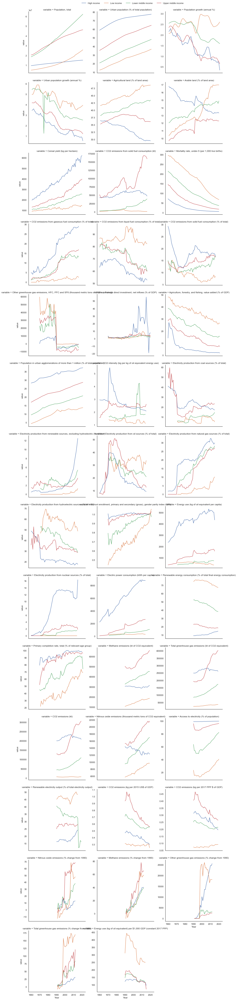

In [ ]:
g = sns.FacetGrid(data = df.groupby(['IncomeGroup', 'Year'])\
                          .mean()\
                          .reset_index()\
                          .melt(id_vars = ['IncomeGroup', 'Year'],
                                value_vars = cols), 
                  col = 'variable', 
                  height = 5, 
                  col_wrap = 3,
                  hue = 'IncomeGroup',
                  sharey = False)
g.map(sns.lineplot, 'Year', 'value')
g.add_legend()
sns.move_legend(g, loc = 'lower center', bbox_to_anchor=(.5, 1), ncol=4, title=None, frameon=False)

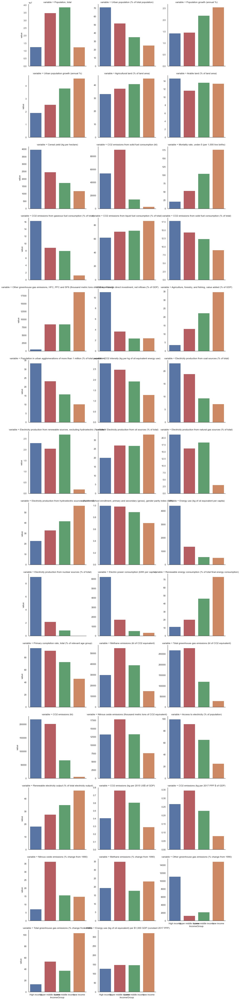

In [ ]:
g = sns.FacetGrid(data = df.groupby(['IncomeGroup'])\
                          .mean()\
                          .reset_index()\
                          .melt(id_vars = ['IncomeGroup'],
                                value_vars = cols), 
                  col = 'variable', 
                  height = 5, 
                  col_wrap = 3,
                  hue = 'IncomeGroup',
                  sharey = False)
g.map(sns.barplot, 'IncomeGroup', 'value',
      order = ['High income', 'Upper middle income', 'Lower middle income', 'Low income'])

In [ ]:
col_pairing = df_raw[['Indicator Name', 'Indicator Code']].drop_duplicates()
col_pairing
col_dict = {}
for i in range(len(col_pairing['Indicator Name'])):
    col_dict[col_pairing['Indicator Name'][i]] = col_pairing['Indicator Code'][i]
col_dict

{'Urban population (% of total population)': 'SP.URB.TOTL.IN.ZS',
 'Urban population': 'SP.URB.TOTL',
 'Urban population growth (annual %)': 'SP.URB.GROW',
 'Population, total': 'SP.POP.TOTL',
 'Population growth (annual %)': 'SP.POP.GROW',
 'Poverty headcount ratio at $2.15 a day (2017 PPP) (% of population)': 'SI.POV.DDAY',
 'Prevalence of underweight, weight for age (% of children under 5)': 'SH.STA.MALN.ZS',
 'Community health workers (per 1,000 people)': 'SH.MED.CMHW.P3',
 'Mortality rate, under-5 (per 1,000 live births)': 'SH.DYN.MORT',
 'Primary completion rate, total (% of relevant age group)': 'SE.PRM.CMPT.ZS',
 'School enrollment, primary and secondary (gross), gender parity index (GPI)': 'SE.ENR.PRSC.FM.ZS',
 'Agriculture, forestry, and fishing, value added (% of GDP)': 'NV.AGR.TOTL.ZS',
 'CPIA public sector management and institutions cluster average (1=low to 6=high)': 'IQ.CPA.PUBS.XQ',
 'Ease of doing business rank (1=most business-friendly regulations)': 'IC.BUS.EASE.XQ'

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


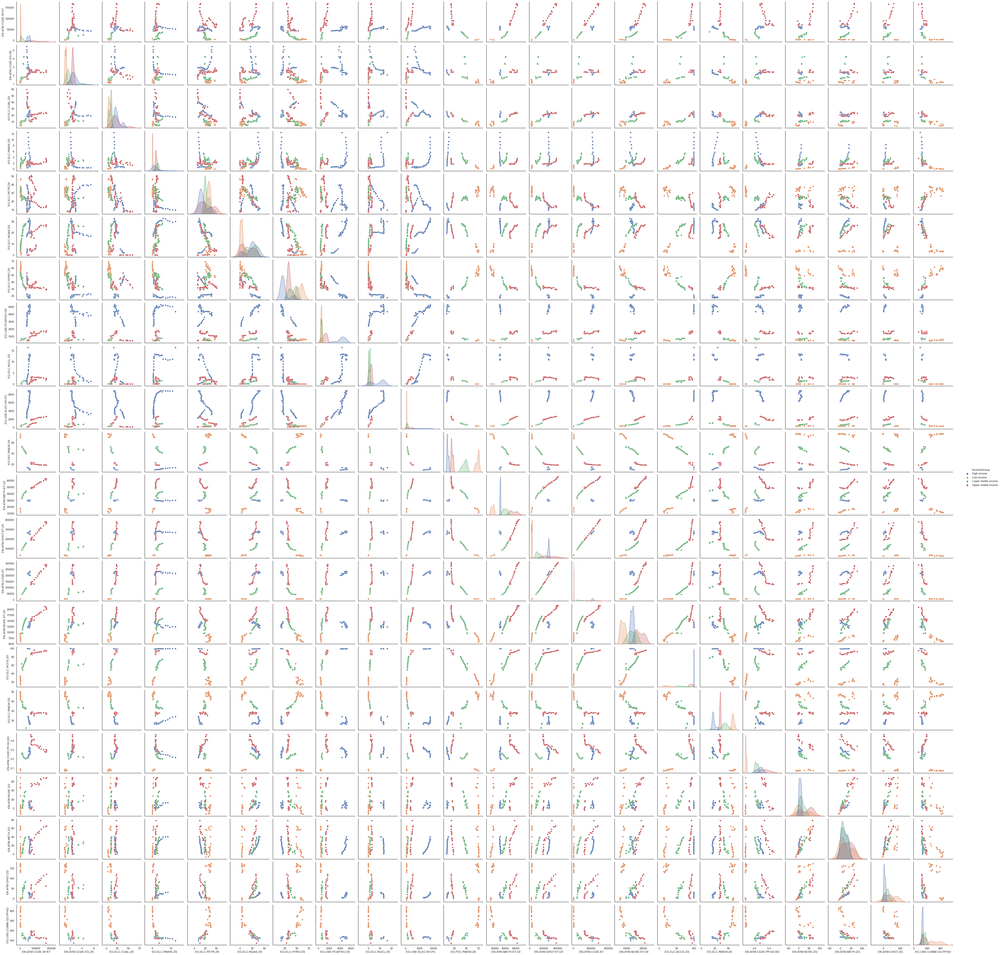

In [ ]:
sns.pairplot(df[['CO2 emissions from solid fuel consumption (kt)',
    'CO2 intensity (kg per kg of oil equivalent energy use)',
    'Electricity production from coal sources (% of total)',
    'Electricity production from renewable sources, excluding hydroelectric (% of total)',
    'Electricity production from oil sources (% of total)',
    'Electricity production from natural gas sources (% of total)',
    'Electricity production from hydroelectric sources (% of total)',
    'Energy use (kg of oil equivalent per capita)',
    'Electricity production from nuclear sources (% of total)',
    'Electric power consumption (kWh per capita)',
    'Renewable energy consumption (% of total final energy consumption)',
    'Methane emissions (kt of CO2 equivalent)',
    'Total greenhouse gas emissions (kt of CO2 equivalent)',
    'CO2 emissions (kt)',
    'Nitrous oxide emissions (thousand metric tons of CO2 equivalent)',
    'Access to electricity (% of population)',
    'Renewable electricity output (% of total electricity output)',
    'CO2 emissions (kg per 2017 PPP $ of GDP)',
    'Nitrous oxide emissions (% change from 1990)',
    'Methane emissions (% change from 1990)',
    'Total greenhouse gas emissions (% change from 1990)',
    'Energy use (kg of oil equivalent) per $1,000 GDP (constant 2017 PPP)',
    'IncomeGroup',
    'Year']]\
        .groupby(['IncomeGroup', 'Year'])\
        .mean()\
        .reset_index()\
        .drop(columns = 'Year')\
        .rename(columns = col_dict),
    hue = 'IncomeGroup')
plt.savefig('pairplot.eps')

In [ ]:
years = [str(i) for i in range(1990, 2022, 1)]

cc_cleaned = df_raw.\
     drop(columns = ['Country Name', 'Indicator Code', 'Unnamed: 66']).\
     melt(id_vars = ['Country Code', 'Indicator Name']).\
     drop(columns = 'variable').\
     pivot_table(index = 'Country Code', columns = 'Indicator Name', 
                 values = 'value', aggfunc = 'median')
     
cc_cleaned = cc_cleaned.fillna(cc_cleaned.mean())

cc_income = pd.merge(cc_cleaned, income[['Country Code', 'IncomeGroup']], 
                     on = 'Country Code', how = 'outer').dropna()

#binning IncomeGroup into 3 categories: high, middle, low

income_group_map = {'High income': 'High income',
                   'Lower middle income': 'Middle income',
                   'Upper middle income': 'Middle income',
                   'Low income': 'Low income'}

cc_income['IncomeGroup'] = cc_income['IncomeGroup'].map(income_group_map)


#normalize data

scaler = MinMaxScaler()

cc_norm = cc_income.loc[:, ~cc_income.columns.isin(['Country Code', 'IncomeGroup'])]

cc_norm = pd.DataFrame(scaler.fit_transform(cc_norm),
            columns=cc_norm.columns, index=cc_norm.index) 

cc_norm = cc_norm.assign(IncomeGroup = cc_income['IncomeGroup'])

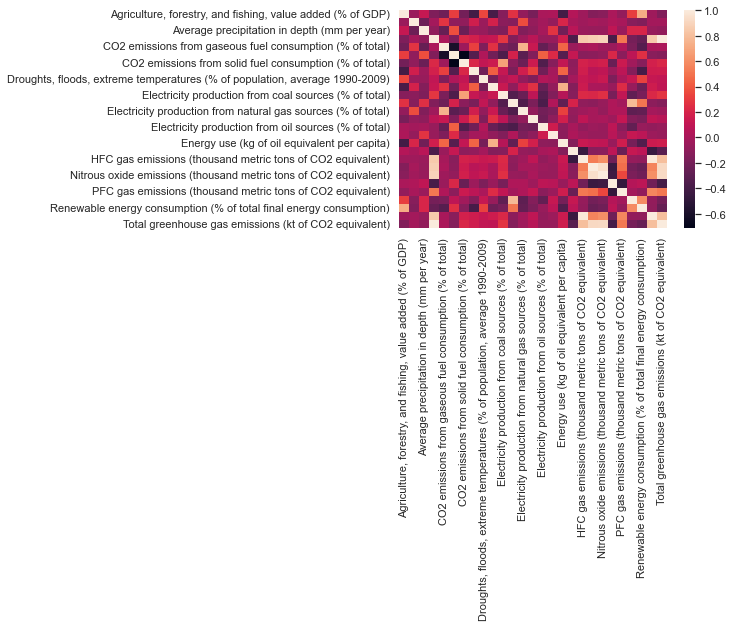

In [ ]:
# correlation heat map for climate change variables 

# extract climate change variables of interest

cc_cor = cc_norm[[
       'Agriculture, forestry, and fishing, value added (% of GDP)',
       'Annual freshwater withdrawals, total (% of internal resources)',
       'Average precipitation in depth (mm per year)',
        'CO2 emissions (kt)',
       'CO2 emissions from gaseous fuel consumption (% of total)',
       'CO2 emissions from liquid fuel consumption (% of total)',
       'CO2 emissions from solid fuel consumption (% of total)',
       'Cereal yield (kg per hectare)',
       'Droughts, floods, extreme temperatures (% of population, average 1990-2009)',
       'Electric power consumption (kWh per capita)',
       'Electricity production from coal sources (% of total)',
       'Electricity production from hydroelectric sources (% of total)',
       'Electricity production from natural gas sources (% of total)',
       'Electricity production from nuclear sources (% of total)',
       'Electricity production from oil sources (% of total)',
       'Electricity production from renewable sources, excluding hydroelectric (% of total)',
       'Energy use (kg of oil equivalent per capita)',
       'GHG net emissions/removals by LUCF (Mt of CO2 equivalent)',
       'HFC gas emissions (thousand metric tons of CO2 equivalent)',
       'Methane emissions (kt of CO2 equivalent)',
       'Nitrous oxide emissions (thousand metric tons of CO2 equivalent)',
       'Other greenhouse gas emissions, HFC, PFC and SF6 (thousand metric tons of CO2 equivalent)',
       'PFC gas emissions (thousand metric tons of CO2 equivalent)',
       'Renewable electricity output (% of total electricity output)',
       'Renewable energy consumption (% of total final energy consumption)',
       'SF6 gas emissions (thousand metric tons of CO2 equivalent)',
       'Total greenhouse gas emissions (kt of CO2 equivalent)',
       'IncomeGroup']]

# plotting correlation heatmap
cor_plot = sns.heatmap(cc_cor.corr())

# displaying heatmap
plt.show()

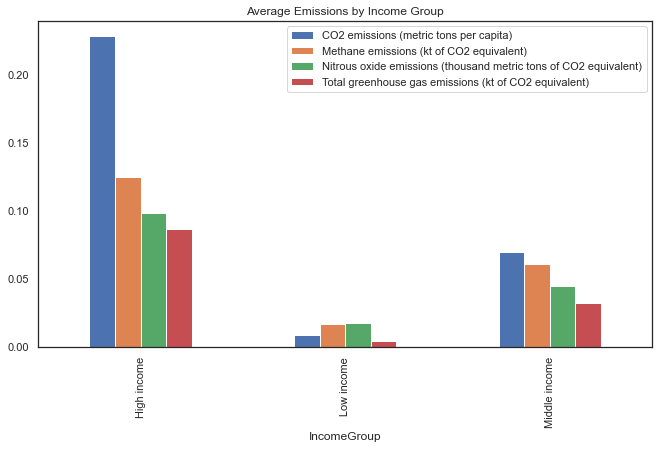

In [ ]:
bar_data = cc_norm[['IncomeGroup','Nitrous oxide emissions (thousand metric tons of CO2 equivalent)',
                     'CO2 emissions (metric tons per capita)',
                     'Methane emissions (kt of CO2 equivalent)',
                     'Total greenhouse gas emissions (kt of CO2 equivalent)']]

bar_data = bar_data.pivot_table(index = 'IncomeGroup', aggfunc = 'mean')


bar_plot = bar_data.plot(kind='bar',figsize= (11,6), title = "Average Emissions by Income Group")

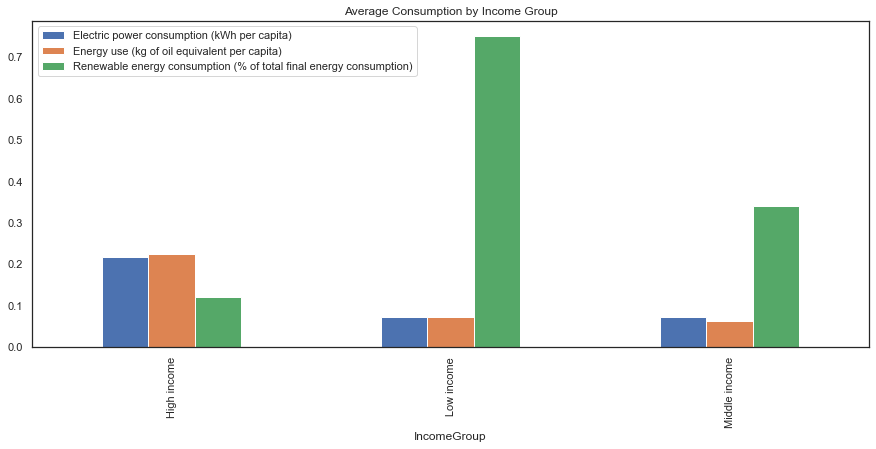

In [ ]:
bar_data2 = cc_norm[['IncomeGroup','Electric power consumption (kWh per capita)',
                     'Energy use (kg of oil equivalent per capita)',
                     'Renewable energy consumption (% of total final energy consumption)']]

bar_data2 = bar_data2.pivot_table(index = 'IncomeGroup', aggfunc = 'mean')


bar_plot2 = bar_data2.plot(kind='bar',figsize= (15,6), title = "Average Consumption by Income Group")

## Missing Data

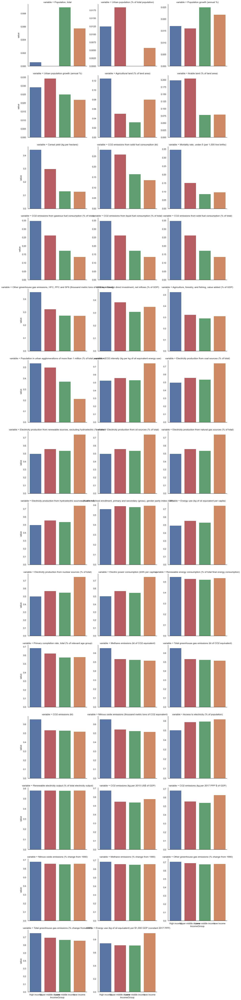

In [ ]:
# How much missing data by incomegroup
g = sns.FacetGrid(data = df.drop(columns = 'IncomeGroup').isna() \
                    .merge(df['IncomeGroup'], left_index = True, right_index = True) \
                    .groupby(['IncomeGroup']).mean().reset_index().drop(columns = 'Year') \
                    .melt(id_vars = ['IncomeGroup'],
                          value_vars = cols), 
                  col = 'variable', 
                  height = 5, 
                  col_wrap = 3,
                  hue = 'IncomeGroup',
                  sharey = False)
g.map(sns.barplot, 'IncomeGroup', 'value',
      order = ['High income', 'Upper middle income', 'Lower middle income', 'Low income'])

## Final Features to Use

In [ ]:
final_cols = 'EG.ELC.ACCS.ZS BX.KLT.DINV.WD.GD.ZS EN.ATM.GHGT.KT.CE EG.USE.PCAP.KG.OE EG.USE.COMM.GD.PP.KD '\
    'EG.ELC.RNWX.KH EG.ELC.COAL.ZS SP.POP.TOTL NV.AGR.TOTL.ZS AG.YLD.CREL.KG SE.ENR.PRSC.FM.ZS '\
    'EN.ATM.NOXE.ZG EN.ATM.METH.KT.CE EN.ATM.GHGO.ZG EN.ATM.CO2E.SF.ZS EN.ATM.CO2E.LF.ZS '\
    'EN.ATM.CO2E.EG.ZS EG.USE.ELEC.KH.PC EG.ELC.RNWX.ZS EG.ELC.RNEW.ZS EG.ELC.PETR.ZS EG.ELC.NUCL.ZS '\
    'EG.ELC.NGAS.ZS EG.ELC.HYRO.ZS'.split()

In [ ]:
for i in final_cols:
    print(df_raw[df_raw['Indicator Code'] == i]['Indicator Name'])

61       Access to electricity (% of population)
137      Access to electricity (% of population)
213      Access to electricity (% of population)
289      Access to electricity (% of population)
365      Access to electricity (% of population)
                          ...                   
19897    Access to electricity (% of population)
19973    Access to electricity (% of population)
20049    Access to electricity (% of population)
20125    Access to electricity (% of population)
20201    Access to electricity (% of population)
Name: Indicator Name, Length: 266, dtype: object
62       Foreign direct investment, net inflows (% of GDP)
138      Foreign direct investment, net inflows (% of GDP)
214      Foreign direct investment, net inflows (% of GDP)
290      Foreign direct investment, net inflows (% of GDP)
366      Foreign direct investment, net inflows (% of GDP)
                               ...                        
19898    Foreign direct investment, net inflows (% of GDP)

In [ ]:
df_temp = df_raw.query('`Indicator Code` in @final_cols')\
    .drop(columns = ['Country Name', 'Indicator Code', 'Unnamed: 66'])\
    .melt(id_vars = ['Country Code', 'Indicator Name'], 
         value_vars = years,
         var_name = 'Year')\
    .pivot(index = ['Country Code', 'Year'], columns = 'Indicator Name')['value']\
    .reset_index()\
    .merge(income_class)\
    .set_index('Country Code')
df_temp['Year'] = pd.to_numeric(df_temp['Year'])
df = df_temp.query('Year >= 1990')
df.head()

,Year,Access to electricity (% of population),"Agriculture, forestry, and fishing, value added (% of GDP)",CO2 emissions from liquid fuel consumption (% of total),CO2 emissions from solid fuel consumption (% of total),CO2 intensity (kg per kg of oil equivalent energy use),Cereal yield (kg per hectare),Electric power consumption (kWh per capita),Electricity production from coal sources (% of total),Electricity production from hydroelectric sources (% of total),...,"Energy use (kg of oil equivalent) per $1,000 GDP (constant 2017 PPP)","Foreign direct investment, net inflows (% of GDP)",Methane emissions (kt of CO2 equivalent),Nitrous oxide emissions (% change from 1990),Other greenhouse gas emissions (% change from 1990),"Population, total",Renewable electricity output (% of total electricity output),"School enrollment, primary and secondary (gross), gender parity index (GPI)",Total greenhouse gas emissions (kt of CO2 equivalent),IncomeGroup
Country Code,,,,,,,,,,,,,,,,,,,,,
ABW,1990,100.000000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,17.063550,NaN,NaN,NaN,62152.0,0.0,NaN,NaN,High income
ABW,1991,99.153656,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,21.185138,NaN,0.328263,-350.000000,64623.0,0.0,NaN,NaN,High income
ABW,1992,99.197128,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,-3.857809,NaN,2.621905,58.333333,68240.0,0.0,NaN,NaN,High income
ABW,1993,99.239914,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,-1.655493,NaN,7.279196,-275.000000,72495.0,0.0,NaN,NaN,High income
ABW,1994,100.000000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,-5.874439,NaN,11.980535,241.666667,76705.0,0.0,NaN,NaN,High income


In [ ]:
df.dtypes

Year                                                                                     int64
Access to electricity (% of population)                                                float64
Agriculture, forestry, and fishing, value added (% of GDP)                             float64
CO2 emissions from liquid fuel consumption (% of total)                                float64
CO2 emissions from solid fuel consumption (% of total)                                 float64
CO2 intensity (kg per kg of oil equivalent energy use)                                 float64
Cereal yield (kg per hectare)                                                          float64
Electric power consumption (kWh per capita)                                            float64
Electricity production from coal sources (% of total)                                  float64
Electricity production from hydroelectric sources (% of total)                         float64
Electricity production from natural gas sources (%

In [ ]:
df['IncomeGroup'] = df['IncomeGroup'].astype('category')

In [ ]:
df.dtypes

Year                                                                                      int64
Access to electricity (% of population)                                                 float64
Agriculture, forestry, and fishing, value added (% of GDP)                              float64
CO2 emissions from liquid fuel consumption (% of total)                                 float64
CO2 emissions from solid fuel consumption (% of total)                                  float64
CO2 intensity (kg per kg of oil equivalent energy use)                                  float64
Cereal yield (kg per hectare)                                                           float64
Electric power consumption (kWh per capita)                                             float64
Electricity production from coal sources (% of total)                                   float64
Electricity production from hydroelectric sources (% of total)                          float64
Electricity production from natural gas 

In [ ]:
df = df.rename(columns = lambda x:re.sub('[^A-Za-z0-9_]+', '_', x))
df.head()

,Year,Access_to_electricity_of_population_,Agriculture_forestry_and_fishing_value_added_of_GDP_,CO2_emissions_from_liquid_fuel_consumption_of_total_,CO2_emissions_from_solid_fuel_consumption_of_total_,CO2_intensity_kg_per_kg_of_oil_equivalent_energy_use_,Cereal_yield_kg_per_hectare_,Electric_power_consumption_kWh_per_capita_,Electricity_production_from_coal_sources_of_total_,Electricity_production_from_hydroelectric_sources_of_total_,...,Energy_use_kg_of_oil_equivalent_per_1_000_GDP_constant_2017_PPP_,Foreign_direct_investment_net_inflows_of_GDP_,Methane_emissions_kt_of_CO2_equivalent_,Nitrous_oxide_emissions_change_from_1990_,Other_greenhouse_gas_emissions_change_from_1990_,Population_total,Renewable_electricity_output_of_total_electricity_output_,School_enrollment_primary_and_secondary_gross_gender_parity_index_GPI_,Total_greenhouse_gas_emissions_kt_of_CO2_equivalent_,IncomeGroup
Country Code,,,,,,,,,,,,,,,,,,,,,
ABW,1990,100.000000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,17.063550,NaN,NaN,NaN,62152.0,0.0,NaN,NaN,High income
ABW,1991,99.153656,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,21.185138,NaN,0.328263,-350.000000,64623.0,0.0,NaN,NaN,High income
ABW,1992,99.197128,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,-3.857809,NaN,2.621905,58.333333,68240.0,0.0,NaN,NaN,High income
ABW,1993,99.239914,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,-1.655493,NaN,7.279196,-275.000000,72495.0,0.0,NaN,NaN,High income
ABW,1994,100.000000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,-5.874439,NaN,11.980535,241.666667,76705.0,0.0,NaN,NaN,High income


In [ ]:
# Apply mice algorithm
kds = mf.ImputationKernel(
  df,
  save_all_iterations=True,
  random_state=50
)

In [ ]:
kds.mice(5)

In [ ]:
data_complete = kds.complete_data()

In [ ]:
data_complete.isnull().sum()

Year                                                                               0
Access_to_electricity_of_population_                                               0
Agriculture_forestry_and_fishing_value_added_of_GDP_                               0
CO2_emissions_from_liquid_fuel_consumption_of_total_                               0
CO2_emissions_from_solid_fuel_consumption_of_total_                                0
CO2_intensity_kg_per_kg_of_oil_equivalent_energy_use_                              0
Cereal_yield_kg_per_hectare_                                                       0
Electric_power_consumption_kWh_per_capita_                                         0
Electricity_production_from_coal_sources_of_total_                                 0
Electricity_production_from_hydroelectric_sources_of_total_                        0
Electricity_production_from_natural_gas_sources_of_total_                          0
Electricity_production_from_nuclear_sources_of_total_            

## Testing imputed values

In [ ]:
final_cols_temp = df.columns.to_list()
final_cols_v2 = [i for i in final_cols_temp if i not in ['Year', 'IncomeGroup']]
final_cols_v2

['Access_to_electricity_of_population_',
 'Agriculture_forestry_and_fishing_value_added_of_GDP_',
 'CO2_emissions_from_liquid_fuel_consumption_of_total_',
 'CO2_emissions_from_solid_fuel_consumption_of_total_',
 'CO2_intensity_kg_per_kg_of_oil_equivalent_energy_use_',
 'Cereal_yield_kg_per_hectare_',
 'Electric_power_consumption_kWh_per_capita_',
 'Electricity_production_from_coal_sources_of_total_',
 'Electricity_production_from_hydroelectric_sources_of_total_',
 'Electricity_production_from_natural_gas_sources_of_total_',
 'Electricity_production_from_nuclear_sources_of_total_',
 'Electricity_production_from_oil_sources_of_total_',
 'Electricity_production_from_renewable_sources_excluding_hydroelectric_of_total_',
 'Electricity_production_from_renewable_sources_excluding_hydroelectric_kWh_',
 'Energy_use_kg_of_oil_equivalent_per_capita_',
 'Energy_use_kg_of_oil_equivalent_per_1_000_GDP_constant_2017_PPP_',
 'Foreign_direct_investment_net_inflows_of_GDP_',
 'Methane_emissions_kt_of_CO

In [ ]:
for i in final_cols_v2:
    print(df[i].agg([np.median]))
    print(data_complete[i].agg([np.median]))

median    99.482323
Name: Access_to_electricity_of_population_, dtype: float64
median    98.4842
Name: Access_to_electricity_of_population_, dtype: float64
median    8.598249
Name: Agriculture_forestry_and_fishing_value_added_of_GDP_, dtype: float64
median    8.152673
Name: Agriculture_forestry_and_fishing_value_added_of_GDP_, dtype: float64
median    67.644413
Name: CO2_emissions_from_liquid_fuel_consumption_of_total_, dtype: float64
median    64.1725
Name: CO2_emissions_from_liquid_fuel_consumption_of_total_, dtype: float64
median    1.801568
Name: CO2_emissions_from_solid_fuel_consumption_of_total_, dtype: float64
median    3.188696
Name: CO2_emissions_from_solid_fuel_consumption_of_total_, dtype: float64
median    2.243572
Name: CO2_intensity_kg_per_kg_of_oil_equivalent_energy_use_, dtype: float64
median    2.393702
Name: CO2_intensity_kg_per_kg_of_oil_equivalent_energy_use_, dtype: float64
median    2384.9
Name: Cereal_yield_kg_per_hectare_, dtype: float64
median    2741.3
Name: C

In [ ]:
# data_complete.to_csv('final_data_v2.csv')

In [ ]:
data_complete

,Year,Access_to_electricity_of_population_,Agriculture_forestry_and_fishing_value_added_of_GDP_,CO2_emissions_from_liquid_fuel_consumption_of_total_,CO2_emissions_from_solid_fuel_consumption_of_total_,CO2_intensity_kg_per_kg_of_oil_equivalent_energy_use_,Cereal_yield_kg_per_hectare_,Electric_power_consumption_kWh_per_capita_,Electricity_production_from_coal_sources_of_total_,Electricity_production_from_hydroelectric_sources_of_total_,...,Energy_use_kg_of_oil_equivalent_per_1_000_GDP_constant_2017_PPP_,Foreign_direct_investment_net_inflows_of_GDP_,Methane_emissions_kt_of_CO2_equivalent_,Nitrous_oxide_emissions_change_from_1990_,Other_greenhouse_gas_emissions_change_from_1990_,Population_total,Renewable_electricity_output_of_total_electricity_output_,School_enrollment_primary_and_secondary_gross_gender_parity_index_GPI_,Total_greenhouse_gas_emissions_kt_of_CO2_equivalent_,IncomeGroup
Country Code,,,,,,,,,,,,,,,,,,,,,
ABW,1990,100.000000,0.173159,97.316538,1.382401,2.961180,3233.1,6712.774758,0.000000,0.000000,...,147.155786,17.063550,1169.999957,506.405664,11.371740,62152.0,0.000000,1.00052,12380.000114,High income
ABW,1991,99.153656,6.284239,69.753876,0.035046,3.339307,4867.8,2154.442931,3.232505,0.264625,...,90.726260,21.185138,17860.000610,0.328263,-350.000000,64623.0,0.000000,1.02656,21680.000305,High income
ABW,1992,99.197128,1.227344,25.953729,53.816034,2.682589,1768.9,6659.000427,30.792984,0.602344,...,334.312497,-3.857809,15539.999962,2.621905,58.333333,68240.0,0.000000,0.99109,58330.001831,High income
ABW,1993,99.239914,0.781227,61.238900,31.553256,2.277763,6458.3,8355.841952,42.514851,0.980009,...,166.565828,-1.655493,36900.001526,7.279196,-275.000000,72495.0,0.000000,1.01189,134360.000610,High income
ABW,1994,100.000000,2.059827,53.525157,0.048187,2.370888,1052.9,7006.273821,0.000000,0.480382,...,462.526341,-5.874439,1750.000000,11.980535,241.666667,76705.0,0.000000,1.04548,2150.000095,High income
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
ZWE,2017,44.178635,8.340969,76.138673,2.536918,1.840943,1202.7,140.331909,0.000000,78.591034,...,90.031031,1.746885,12060.000420,5.715750,793.402500,14236599.0,78.623188,0.89341,28299.999237,Lower middle income
ZWE,2018,45.572647,10.520955,52.219856,28.244726,2.263373,1242.2,304.431831,54.668675,7.996903,...,90.924153,3.962704,12340.000153,73.910536,-83.550571,14438812.0,8.278663,0.93028,30829.999924,Lower middle income
ZWE,2019,46.781475,10.143657,93.605000,0.140633,3.215600,1173.7,733.210611,0.000000,0.000000,...,90.924153,1.293799,12550.000191,9.824680,12170.543304,14645473.0,0.000000,0.93545,30530.000687,Lower middle income


In [ ]:
scaler = StandardScaler()
df_raw = data_complete\
    .reset_index()\
    .drop(columns = ['Year', 'IncomeGroup'])\
    .groupby('Country Code').median()

In [ ]:
df_scaled = pd.DataFrame(scaler.fit_transform(df_raw),
             columns = df_raw.columns,
             index = df_raw.index)

In [ ]:
df = df_scaled.merge(data_complete[['IncomeGroup']].reset_index().drop_duplicates().set_index('Country Code'), 
                     left_index = True, right_index = True)

In [ ]:
# df.to_csv('scaled_data.csv')

In [ ]:
df

,Access_to_electricity_of_population_,Agriculture_forestry_and_fishing_value_added_of_GDP_,CO2_emissions_from_liquid_fuel_consumption_of_total_,CO2_emissions_from_solid_fuel_consumption_of_total_,CO2_intensity_kg_per_kg_of_oil_equivalent_energy_use_,Cereal_yield_kg_per_hectare_,Electric_power_consumption_kWh_per_capita_,Electricity_production_from_coal_sources_of_total_,Electricity_production_from_hydroelectric_sources_of_total_,Electricity_production_from_natural_gas_sources_of_total_,...,Energy_use_kg_of_oil_equivalent_per_1_000_GDP_constant_2017_PPP_,Foreign_direct_investment_net_inflows_of_GDP_,Methane_emissions_kt_of_CO2_equivalent_,Nitrous_oxide_emissions_change_from_1990_,Other_greenhouse_gas_emissions_change_from_1990_,Population_total,Renewable_electricity_output_of_total_electricity_output_,School_enrollment_primary_and_secondary_gross_gender_parity_index_GPI_,Total_greenhouse_gas_emissions_kt_of_CO2_equivalent_,IncomeGroup
Country Code,,,,,,,,,,,,,,,,,,,,,
ABW,0.703738,-0.980459,-0.183391,0.143605,0.125284,0.794723,1.064184,0.370699,-0.777069,0.460065,...,0.280581,-0.103731,-0.270634,-0.738753,-0.148593,-0.244931,-0.841529,0.479635,-0.215270,High income
AFG,-1.511655,1.413152,-0.110937,-0.219752,-0.893218,-0.706439,-0.686668,-0.267507,1.413314,-0.571804,...,0.485431,-0.186196,-0.221558,0.187313,-0.147300,-0.033128,1.347864,-3.712541,-0.225792,Low income
AGO,-1.446565,-0.386224,-0.936298,-0.634300,-0.426108,-1.107882,-0.830195,-0.545583,1.430868,-0.680363,...,-0.577101,-0.131778,-0.001897,-1.448859,-0.118451,-0.084169,1.260489,-1.529051,-0.150164,Lower middle income
ALB,0.703738,0.696345,0.593171,-0.394157,-0.407107,0.081997,-0.505193,-0.545583,2.379358,-0.680363,...,-0.506462,-0.048743,-0.297056,-0.754728,-0.149643,-0.221242,2.107901,0.326592,-0.237149,Upper middle income
AND,0.703738,-0.107666,1.359637,-0.634300,0.191961,0.711593,2.833946,-0.545583,1.638091,-0.625373,...,0.529162,0.054631,-0.331464,-0.191322,-0.147621,-0.245122,2.122050,0.678454,-0.249497,High income
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
XKX,0.697203,-0.311472,-1.519916,2.613362,1.097023,-0.132195,-0.170431,3.469611,-0.746523,-0.680363,...,0.069036,-0.053773,-0.306801,-0.375459,-0.147742,-0.231133,-0.794220,0.858149,-0.233808,Upper middle income
YEM,-0.807159,-0.053138,1.300701,-0.634300,0.716371,-0.973202,-0.814363,-0.545583,-0.798651,-0.680363,...,-0.516579,-0.215233,-0.140837,0.498776,-0.142613,-0.079223,-0.841529,-3.136032,-0.194443,Low income
ZAF,0.140010,-0.798947,-1.928586,4.062579,0.532558,-0.150529,0.197555,3.640074,-0.778709,-0.680363,...,0.939600,-0.184957,0.367655,-0.055835,-0.130526,0.147637,-0.817115,0.513815,0.460987,Upper middle income


## Machine Learning

In [ ]:
X = df.reset_index().drop(columns = ['IncomeGroup', 'Country Code'])
Y = df.reset_index()['IncomeGroup']

In [ ]:
X_train, X_test, Y_train, Y_test = train_test_split(X, Y, test_size = 0.2, random_state = 50)

In [ ]:
f1_scorer = make_scorer(f1_score, average = 'weighted')

### Linear SVC

In [ ]:
param_grid = {'C': [10, 15, 20, 25, 30, 35, 40, 45, 50, 60, 70, 80, 90, 100]}
svc = LinearSVC(random_state = 50, tol = 1e-5, max_iter = 1e5)
svc_gs = GridSearchCV(estimator = svc,
                     param_grid = param_grid,
                     cv = 5,
                     verbose = 3,
                     scoring = f1_scorer)

In [ ]:
search = svc_gs.fit(X_train, Y_train)

Fitting 5 folds for each of 14 candidates, totalling 70 fits
[CV 1/5] END ..............................C=10;, score=0.805 total time=   0.1s
[CV 2/5] END ..............................C=10;, score=0.754 total time=   0.1s
[CV 3/5] END ..............................C=10;, score=0.914 total time=   0.1s
[CV 4/5] END ..............................C=10;, score=0.661 total time=   0.1s
[CV 5/5] END ..............................C=10;, score=0.686 total time=   0.1s
[CV 1/5] END ..............................C=15;, score=0.803 total time=   0.1s
[CV 2/5] END ..............................C=15;, score=0.754 total time=   0.1s
[CV 3/5] END ..............................C=15;, score=0.914 total time=   0.1s
[CV 4/5] END ..............................C=15;, score=0.606 total time=   0.1s
[CV 5/5] END ..............................C=15;, score=0.684 total time=   0.1s
[CV 1/5] END ..............................C=20;, score=0.803 total time=   0.2s
[CV 2/5] END ..............................C=20;

/Users/jaskainth/opt/anaconda3/lib/python3.9/site-packages/sklearn/svm/_base.py:1206: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(


[CV 4/5] END ..............................C=70;, score=0.599 total time=   0.5s
[CV 5/5] END ..............................C=70;, score=0.706 total time=   0.4s
[CV 1/5] END ..............................C=80;, score=0.775 total time=   0.6s


/Users/jaskainth/opt/anaconda3/lib/python3.9/site-packages/sklearn/svm/_base.py:1206: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(


[CV 2/5] END ..............................C=80;, score=0.754 total time=   0.6s
[CV 3/5] END ..............................C=80;, score=0.888 total time=   0.6s


/Users/jaskainth/opt/anaconda3/lib/python3.9/site-packages/sklearn/svm/_base.py:1206: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(


[CV 4/5] END ..............................C=80;, score=0.599 total time=   0.5s
[CV 5/5] END ..............................C=80;, score=0.706 total time=   0.5s


/Users/jaskainth/opt/anaconda3/lib/python3.9/site-packages/sklearn/svm/_base.py:1206: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(


[CV 1/5] END ..............................C=90;, score=0.775 total time=   0.7s


/Users/jaskainth/opt/anaconda3/lib/python3.9/site-packages/sklearn/svm/_base.py:1206: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(


[CV 2/5] END ..............................C=90;, score=0.754 total time=   0.6s


/Users/jaskainth/opt/anaconda3/lib/python3.9/site-packages/sklearn/svm/_base.py:1206: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(


[CV 3/5] END ..............................C=90;, score=0.888 total time=   0.7s


/Users/jaskainth/opt/anaconda3/lib/python3.9/site-packages/sklearn/svm/_base.py:1206: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(


[CV 4/5] END ..............................C=90;, score=0.599 total time=   0.6s
[CV 5/5] END ..............................C=90;, score=0.706 total time=   0.6s


/Users/jaskainth/opt/anaconda3/lib/python3.9/site-packages/sklearn/svm/_base.py:1206: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(


[CV 1/5] END .............................C=100;, score=0.775 total time=   0.7s


/Users/jaskainth/opt/anaconda3/lib/python3.9/site-packages/sklearn/svm/_base.py:1206: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(


[CV 2/5] END .............................C=100;, score=0.754 total time=   0.6s


/Users/jaskainth/opt/anaconda3/lib/python3.9/site-packages/sklearn/svm/_base.py:1206: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(


[CV 3/5] END .............................C=100;, score=0.888 total time=   0.7s


/Users/jaskainth/opt/anaconda3/lib/python3.9/site-packages/sklearn/svm/_base.py:1206: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(


[CV 4/5] END .............................C=100;, score=0.599 total time=   0.6s


/Users/jaskainth/opt/anaconda3/lib/python3.9/site-packages/sklearn/svm/_base.py:1206: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(


[CV 5/5] END .............................C=100;, score=0.706 total time=   0.6s


In [ ]:
pd.DataFrame(search.cv_results_) # The results of the cv

,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_C,params,split0_test_score,split1_test_score,split2_test_score,split3_test_score,split4_test_score,mean_test_score,std_test_score,rank_test_score
0,0.092644,0.008442,0.001663,0.000928,10,{'C': 10},0.804820,0.754093,0.914345,0.660958,0.686053,0.764053,0.090622,1
1,0.123876,0.012918,0.001450,0.000247,15,{'C': 15},0.803175,0.754093,0.914345,0.605590,0.683801,0.752201,0.104944,2
2,0.159548,0.013847,0.001634,0.000263,20,{'C': 20},0.803175,0.754093,0.914345,0.605590,0.683801,0.752201,0.104944,2
3,0.203416,0.018417,0.001733,0.000452,25,{'C': 25},0.774603,0.754093,0.914345,0.605357,0.683801,0.746440,0.102832,7
4,0.220699,0.027223,0.001846,0.000582,30,{'C': 30},0.774603,0.754093,0.914345,0.598715,0.683801,0.745111,0.104672,8
5,0.278861,0.030668,0.001545,0.000045,35,{'C': 35},0.774603,0.754093,0.914345,0.598715,0.683801,0.745111,0.104672,8
6,0.316380,0.034267,0.001773,0.000283,40,{'C': 40},0.774603,0.754093,0.914345,0.598715,0.683801,0.745111,0.104672,8
7,0.339451,0.035312,0.002096,0.000425,45,{'C': 45},0.774603,0.754093,0.914345,0.598715,0.683801,0.745111,0.104672,8
8,0.396390,0.051051,0.001982,0.000401,50,{'C': 50},0.774603,0.754093,0.914345,0.598715,0.705882,0.749527,0.102434,4
9,0.482647,0.057436,0.002004,0.000301,60,{'C': 60},0.774603,0.754093,0.914345,0.598715,0.705882,0.749527,0.102434,4


In [ ]:
search.best_params_

{'C': 10}

In [ ]:
svc_final = LinearSVC(C = 10, 
                      random_state = 50,
                     max_iter = 100000)
svc_final.fit(X_train, Y_train)


LinearSVC(C=10, max_iter=100000, random_state=50)

In [ ]:
Y_pred = svc_final.predict(X_test)

In [ ]:
print(classification_report(Y_test, Y_pred))

                     precision    recall  f1-score   support

        High income       0.80      0.92      0.86        13
         Low income       1.00      0.88      0.93         8
Lower middle income       0.62      1.00      0.76         8
Upper middle income       0.89      0.53      0.67        15

           accuracy                           0.80        44
          macro avg       0.83      0.83      0.80        44
       weighted avg       0.83      0.80      0.79        44



### Decision Tree

In [ ]:
param_grid = {'criterion': ['gini', 'entropy'],
             'max_depth': np.arange(3, 16),
             'min_samples_split': [1, 2, 3, 4, 5, 7, 10, 15, 20, 25, 30, 35, 40], 
             'min_samples_leaf': [1, 2, 3, 4, 5, 7, 10, 15, 20]}

In [ ]:
dt = DecisionTreeClassifier(random_state = 50)
dt_gs = GridSearchCV(estimator = dt,
                     param_grid = param_grid,
                     cv = 5,
                     verbose = 3,
                     scoring = f1_scorer)

In [ ]:
search = dt_gs.fit(X_train, Y_train)

Fitting 5 folds for each of 3042 candidates, totalling 15210 fits
[CV 1/5] END criterion=gini, max_depth=3, min_samples_leaf=1, min_samples_split=1;, score=nan total time=   0.0s
[CV 2/5] END criterion=gini, max_depth=3, min_samples_leaf=1, min_samples_split=1;, score=nan total time=   0.0s
[CV 3/5] END criterion=gini, max_depth=3, min_samples_leaf=1, min_samples_split=1;, score=nan total time=   0.0s
[CV 4/5] END criterion=gini, max_depth=3, min_samples_leaf=1, min_samples_split=1;, score=nan total time=   0.0s
[CV 5/5] END criterion=gini, max_depth=3, min_samples_leaf=1, min_samples_split=1;, score=nan total time=   0.0s
[CV 1/5] END criterion=gini, max_depth=3, min_samples_leaf=1, min_samples_split=2;, score=0.768 total time=   0.0s
[CV 2/5] END criterion=gini, max_depth=3, min_samples_leaf=1, min_samples_split=2;, score=0.700 total time=   0.0s
[CV 3/5] END criterion=gini, max_depth=3, min_samples_leaf=1, min_samples_split=2;, score=0.685 total time=   0.0s
[CV 4/5] END criterion=g

[CV 2/5] END criterion=gini, max_depth=3, min_samples_leaf=3, min_samples_split=2;, score=0.700 total time=   0.0s
[CV 3/5] END criterion=gini, max_depth=3, min_samples_leaf=3, min_samples_split=2;, score=0.659 total time=   0.0s
[CV 4/5] END criterion=gini, max_depth=3, min_samples_leaf=3, min_samples_split=2;, score=0.787 total time=   0.0s
[CV 5/5] END criterion=gini, max_depth=3, min_samples_leaf=3, min_samples_split=2;, score=0.635 total time=   0.0s
[CV 1/5] END criterion=gini, max_depth=3, min_samples_leaf=3, min_samples_split=3;, score=0.768 total time=   0.0s
[CV 2/5] END criterion=gini, max_depth=3, min_samples_leaf=3, min_samples_split=3;, score=0.700 total time=   0.0s
[CV 3/5] END criterion=gini, max_depth=3, min_samples_leaf=3, min_samples_split=3;, score=0.659 total time=   0.0s
[CV 4/5] END criterion=gini, max_depth=3, min_samples_leaf=3, min_samples_split=3;, score=0.787 total time=   0.0s
[CV 5/5] END criterion=gini, max_depth=3, min_samples_leaf=3, min_samples_split=

[CV 3/5] END criterion=gini, max_depth=3, min_samples_leaf=5, min_samples_split=5;, score=0.659 total time=   0.0s
[CV 4/5] END criterion=gini, max_depth=3, min_samples_leaf=5, min_samples_split=5;, score=0.763 total time=   0.0s
[CV 5/5] END criterion=gini, max_depth=3, min_samples_leaf=5, min_samples_split=5;, score=0.658 total time=   0.0s
[CV 1/5] END criterion=gini, max_depth=3, min_samples_leaf=5, min_samples_split=7;, score=0.792 total time=   0.0s
[CV 2/5] END criterion=gini, max_depth=3, min_samples_leaf=5, min_samples_split=7;, score=0.700 total time=   0.0s
[CV 3/5] END criterion=gini, max_depth=3, min_samples_leaf=5, min_samples_split=7;, score=0.659 total time=   0.0s
[CV 4/5] END criterion=gini, max_depth=3, min_samples_leaf=5, min_samples_split=7;, score=0.763 total time=   0.0s
[CV 5/5] END criterion=gini, max_depth=3, min_samples_leaf=5, min_samples_split=7;, score=0.658 total time=   0.0s
[CV 1/5] END criterion=gini, max_depth=3, min_samples_leaf=5, min_samples_split=

[CV 4/5] END criterion=gini, max_depth=3, min_samples_leaf=7, min_samples_split=10;, score=0.739 total time=   0.0s
[CV 5/5] END criterion=gini, max_depth=3, min_samples_leaf=7, min_samples_split=10;, score=0.664 total time=   0.0s
[CV 1/5] END criterion=gini, max_depth=3, min_samples_leaf=7, min_samples_split=15;, score=0.629 total time=   0.0s
[CV 2/5] END criterion=gini, max_depth=3, min_samples_leaf=7, min_samples_split=15;, score=0.700 total time=   0.0s
[CV 3/5] END criterion=gini, max_depth=3, min_samples_leaf=7, min_samples_split=15;, score=0.600 total time=   0.0s
[CV 4/5] END criterion=gini, max_depth=3, min_samples_leaf=7, min_samples_split=15;, score=0.739 total time=   0.0s
[CV 5/5] END criterion=gini, max_depth=3, min_samples_leaf=7, min_samples_split=15;, score=0.664 total time=   0.0s
[CV 1/5] END criterion=gini, max_depth=3, min_samples_leaf=7, min_samples_split=20;, score=0.629 total time=   0.0s
[CV 2/5] END criterion=gini, max_depth=3, min_samples_leaf=7, min_sample

[CV 2/5] END criterion=gini, max_depth=3, min_samples_leaf=15, min_samples_split=25;, score=0.737 total time=   0.0s
[CV 3/5] END criterion=gini, max_depth=3, min_samples_leaf=15, min_samples_split=25;, score=0.600 total time=   0.0s
[CV 4/5] END criterion=gini, max_depth=3, min_samples_leaf=15, min_samples_split=25;, score=0.725 total time=   0.0s
[CV 5/5] END criterion=gini, max_depth=3, min_samples_leaf=15, min_samples_split=25;, score=0.658 total time=   0.0s
[CV 1/5] END criterion=gini, max_depth=3, min_samples_leaf=15, min_samples_split=30;, score=0.629 total time=   0.0s
[CV 2/5] END criterion=gini, max_depth=3, min_samples_leaf=15, min_samples_split=30;, score=0.737 total time=   0.0s
[CV 3/5] END criterion=gini, max_depth=3, min_samples_leaf=15, min_samples_split=30;, score=0.600 total time=   0.0s
[CV 4/5] END criterion=gini, max_depth=3, min_samples_leaf=15, min_samples_split=30;, score=0.725 total time=   0.0s
[CV 5/5] END criterion=gini, max_depth=3, min_samples_leaf=15, m

[CV 2/5] END criterion=gini, max_depth=3, min_samples_leaf=20, min_samples_split=40;, score=0.671 total time=   0.0s
[CV 3/5] END criterion=gini, max_depth=3, min_samples_leaf=20, min_samples_split=40;, score=0.554 total time=   0.0s
[CV 4/5] END criterion=gini, max_depth=3, min_samples_leaf=20, min_samples_split=40;, score=0.607 total time=   0.0s
[CV 5/5] END criterion=gini, max_depth=3, min_samples_leaf=20, min_samples_split=40;, score=0.686 total time=   0.0s
[CV 1/5] END criterion=gini, max_depth=4, min_samples_leaf=1, min_samples_split=1;, score=nan total time=   0.0s
[CV 2/5] END criterion=gini, max_depth=4, min_samples_leaf=1, min_samples_split=1;, score=nan total time=   0.0s
[CV 3/5] END criterion=gini, max_depth=4, min_samples_leaf=1, min_samples_split=1;, score=nan total time=   0.0s
[CV 4/5] END criterion=gini, max_depth=4, min_samples_leaf=1, min_samples_split=1;, score=nan total time=   0.0s
[CV 5/5] END criterion=gini, max_depth=4, min_samples_leaf=1, min_samples_split=

[CV 1/5] END criterion=gini, max_depth=4, min_samples_leaf=3, min_samples_split=2;, score=0.737 total time=   0.0s
[CV 2/5] END criterion=gini, max_depth=4, min_samples_leaf=3, min_samples_split=2;, score=0.799 total time=   0.0s
[CV 3/5] END criterion=gini, max_depth=4, min_samples_leaf=3, min_samples_split=2;, score=0.624 total time=   0.0s
[CV 4/5] END criterion=gini, max_depth=4, min_samples_leaf=3, min_samples_split=2;, score=0.734 total time=   0.0s
[CV 5/5] END criterion=gini, max_depth=4, min_samples_leaf=3, min_samples_split=2;, score=0.701 total time=   0.0s
[CV 1/5] END criterion=gini, max_depth=4, min_samples_leaf=3, min_samples_split=3;, score=0.737 total time=   0.0s
[CV 2/5] END criterion=gini, max_depth=4, min_samples_leaf=3, min_samples_split=3;, score=0.799 total time=   0.0s
[CV 3/5] END criterion=gini, max_depth=4, min_samples_leaf=3, min_samples_split=3;, score=0.624 total time=   0.0s
[CV 4/5] END criterion=gini, max_depth=4, min_samples_leaf=3, min_samples_split=

[CV 4/5] END criterion=gini, max_depth=4, min_samples_leaf=5, min_samples_split=4;, score=0.762 total time=   0.0s
[CV 5/5] END criterion=gini, max_depth=4, min_samples_leaf=5, min_samples_split=4;, score=0.658 total time=   0.0s
[CV 1/5] END criterion=gini, max_depth=4, min_samples_leaf=5, min_samples_split=5;, score=0.793 total time=   0.0s
[CV 2/5] END criterion=gini, max_depth=4, min_samples_leaf=5, min_samples_split=5;, score=0.729 total time=   0.0s
[CV 3/5] END criterion=gini, max_depth=4, min_samples_leaf=5, min_samples_split=5;, score=0.605 total time=   0.0s
[CV 4/5] END criterion=gini, max_depth=4, min_samples_leaf=5, min_samples_split=5;, score=0.762 total time=   0.0s
[CV 5/5] END criterion=gini, max_depth=4, min_samples_leaf=5, min_samples_split=5;, score=0.658 total time=   0.0s
[CV 1/5] END criterion=gini, max_depth=4, min_samples_leaf=5, min_samples_split=7;, score=0.793 total time=   0.0s
[CV 2/5] END criterion=gini, max_depth=4, min_samples_leaf=5, min_samples_split=

[CV 4/5] END criterion=gini, max_depth=4, min_samples_leaf=7, min_samples_split=7;, score=0.679 total time=   0.0s
[CV 5/5] END criterion=gini, max_depth=4, min_samples_leaf=7, min_samples_split=7;, score=0.664 total time=   0.0s
[CV 1/5] END criterion=gini, max_depth=4, min_samples_leaf=7, min_samples_split=10;, score=0.737 total time=   0.0s
[CV 2/5] END criterion=gini, max_depth=4, min_samples_leaf=7, min_samples_split=10;, score=0.729 total time=   0.0s
[CV 3/5] END criterion=gini, max_depth=4, min_samples_leaf=7, min_samples_split=10;, score=0.629 total time=   0.0s
[CV 4/5] END criterion=gini, max_depth=4, min_samples_leaf=7, min_samples_split=10;, score=0.679 total time=   0.0s
[CV 5/5] END criterion=gini, max_depth=4, min_samples_leaf=7, min_samples_split=10;, score=0.664 total time=   0.0s
[CV 1/5] END criterion=gini, max_depth=4, min_samples_leaf=7, min_samples_split=15;, score=0.737 total time=   0.0s
[CV 2/5] END criterion=gini, max_depth=4, min_samples_leaf=7, min_samples_

[CV 1/5] END criterion=gini, max_depth=4, min_samples_leaf=10, min_samples_split=15;, score=0.629 total time=   0.0s
[CV 2/5] END criterion=gini, max_depth=4, min_samples_leaf=10, min_samples_split=15;, score=0.700 total time=   0.0s
[CV 3/5] END criterion=gini, max_depth=4, min_samples_leaf=10, min_samples_split=15;, score=0.629 total time=   0.0s
[CV 4/5] END criterion=gini, max_depth=4, min_samples_leaf=10, min_samples_split=15;, score=0.748 total time=   0.0s
[CV 5/5] END criterion=gini, max_depth=4, min_samples_leaf=10, min_samples_split=15;, score=0.664 total time=   0.0s
[CV 1/5] END criterion=gini, max_depth=4, min_samples_leaf=10, min_samples_split=20;, score=0.629 total time=   0.0s
[CV 2/5] END criterion=gini, max_depth=4, min_samples_leaf=10, min_samples_split=20;, score=0.700 total time=   0.0s
[CV 3/5] END criterion=gini, max_depth=4, min_samples_leaf=10, min_samples_split=20;, score=0.629 total time=   0.0s
[CV 4/5] END criterion=gini, max_depth=4, min_samples_leaf=10, m

[CV 1/5] END criterion=gini, max_depth=4, min_samples_leaf=15, min_samples_split=25;, score=0.629 total time=   0.0s
[CV 2/5] END criterion=gini, max_depth=4, min_samples_leaf=15, min_samples_split=25;, score=0.737 total time=   0.0s
[CV 3/5] END criterion=gini, max_depth=4, min_samples_leaf=15, min_samples_split=25;, score=0.600 total time=   0.0s
[CV 4/5] END criterion=gini, max_depth=4, min_samples_leaf=15, min_samples_split=25;, score=0.725 total time=   0.0s
[CV 5/5] END criterion=gini, max_depth=4, min_samples_leaf=15, min_samples_split=25;, score=0.658 total time=   0.0s
[CV 1/5] END criterion=gini, max_depth=4, min_samples_leaf=15, min_samples_split=30;, score=0.629 total time=   0.0s
[CV 2/5] END criterion=gini, max_depth=4, min_samples_leaf=15, min_samples_split=30;, score=0.737 total time=   0.0s
[CV 3/5] END criterion=gini, max_depth=4, min_samples_leaf=15, min_samples_split=30;, score=0.600 total time=   0.0s
[CV 4/5] END criterion=gini, max_depth=4, min_samples_leaf=15, m

[CV 2/5] END criterion=gini, max_depth=4, min_samples_leaf=20, min_samples_split=35;, score=0.671 total time=   0.0s
[CV 3/5] END criterion=gini, max_depth=4, min_samples_leaf=20, min_samples_split=35;, score=0.554 total time=   0.0s
[CV 4/5] END criterion=gini, max_depth=4, min_samples_leaf=20, min_samples_split=35;, score=0.607 total time=   0.0s
[CV 5/5] END criterion=gini, max_depth=4, min_samples_leaf=20, min_samples_split=35;, score=0.686 total time=   0.0s
[CV 1/5] END criterion=gini, max_depth=4, min_samples_leaf=20, min_samples_split=40;, score=0.708 total time=   0.0s
[CV 2/5] END criterion=gini, max_depth=4, min_samples_leaf=20, min_samples_split=40;, score=0.671 total time=   0.0s
[CV 3/5] END criterion=gini, max_depth=4, min_samples_leaf=20, min_samples_split=40;, score=0.554 total time=   0.0s
[CV 4/5] END criterion=gini, max_depth=4, min_samples_leaf=20, min_samples_split=40;, score=0.607 total time=   0.0s
[CV 5/5] END criterion=gini, max_depth=4, min_samples_leaf=20, m

[CV 4/5] END criterion=gini, max_depth=5, min_samples_leaf=2, min_samples_split=30;, score=0.711 total time=   0.0s
[CV 5/5] END criterion=gini, max_depth=5, min_samples_leaf=2, min_samples_split=30;, score=0.726 total time=   0.0s
[CV 1/5] END criterion=gini, max_depth=5, min_samples_leaf=2, min_samples_split=35;, score=0.768 total time=   0.0s
[CV 2/5] END criterion=gini, max_depth=5, min_samples_leaf=2, min_samples_split=35;, score=0.700 total time=   0.0s
[CV 3/5] END criterion=gini, max_depth=5, min_samples_leaf=2, min_samples_split=35;, score=0.624 total time=   0.0s
[CV 4/5] END criterion=gini, max_depth=5, min_samples_leaf=2, min_samples_split=35;, score=0.711 total time=   0.0s
[CV 5/5] END criterion=gini, max_depth=5, min_samples_leaf=2, min_samples_split=35;, score=0.658 total time=   0.0s
[CV 1/5] END criterion=gini, max_depth=5, min_samples_leaf=2, min_samples_split=40;, score=0.717 total time=   0.0s
[CV 2/5] END criterion=gini, max_depth=5, min_samples_leaf=2, min_sample

[CV 4/5] END criterion=gini, max_depth=5, min_samples_leaf=4, min_samples_split=35;, score=0.711 total time=   0.0s
[CV 5/5] END criterion=gini, max_depth=5, min_samples_leaf=4, min_samples_split=35;, score=0.658 total time=   0.0s
[CV 1/5] END criterion=gini, max_depth=5, min_samples_leaf=4, min_samples_split=40;, score=0.717 total time=   0.0s
[CV 2/5] END criterion=gini, max_depth=5, min_samples_leaf=4, min_samples_split=40;, score=0.700 total time=   0.0s
[CV 3/5] END criterion=gini, max_depth=5, min_samples_leaf=4, min_samples_split=40;, score=0.605 total time=   0.0s
[CV 4/5] END criterion=gini, max_depth=5, min_samples_leaf=4, min_samples_split=40;, score=0.768 total time=   0.0s
[CV 5/5] END criterion=gini, max_depth=5, min_samples_leaf=4, min_samples_split=40;, score=0.658 total time=   0.0s
[CV 1/5] END criterion=gini, max_depth=5, min_samples_leaf=5, min_samples_split=1;, score=nan total time=   0.0s
[CV 2/5] END criterion=gini, max_depth=5, min_samples_leaf=5, min_samples_s

[CV 5/5] END criterion=gini, max_depth=5, min_samples_leaf=7, min_samples_split=25;, score=0.664 total time=   0.0s
[CV 1/5] END criterion=gini, max_depth=5, min_samples_leaf=7, min_samples_split=30;, score=0.629 total time=   0.0s
[CV 2/5] END criterion=gini, max_depth=5, min_samples_leaf=7, min_samples_split=30;, score=0.700 total time=   0.0s
[CV 3/5] END criterion=gini, max_depth=5, min_samples_leaf=7, min_samples_split=30;, score=0.600 total time=   0.0s
[CV 4/5] END criterion=gini, max_depth=5, min_samples_leaf=7, min_samples_split=30;, score=0.679 total time=   0.0s
[CV 5/5] END criterion=gini, max_depth=5, min_samples_leaf=7, min_samples_split=30;, score=0.664 total time=   0.0s
[CV 1/5] END criterion=gini, max_depth=5, min_samples_leaf=7, min_samples_split=35;, score=0.629 total time=   0.0s
[CV 2/5] END criterion=gini, max_depth=5, min_samples_leaf=7, min_samples_split=35;, score=0.700 total time=   0.0s
[CV 3/5] END criterion=gini, max_depth=5, min_samples_leaf=7, min_sample

[CV 1/5] END criterion=gini, max_depth=5, min_samples_leaf=15, min_samples_split=25;, score=0.629 total time=   0.0s
[CV 2/5] END criterion=gini, max_depth=5, min_samples_leaf=15, min_samples_split=25;, score=0.737 total time=   0.0s
[CV 3/5] END criterion=gini, max_depth=5, min_samples_leaf=15, min_samples_split=25;, score=0.600 total time=   0.0s
[CV 4/5] END criterion=gini, max_depth=5, min_samples_leaf=15, min_samples_split=25;, score=0.725 total time=   0.0s
[CV 5/5] END criterion=gini, max_depth=5, min_samples_leaf=15, min_samples_split=25;, score=0.658 total time=   0.0s
[CV 1/5] END criterion=gini, max_depth=5, min_samples_leaf=15, min_samples_split=30;, score=0.629 total time=   0.0s
[CV 2/5] END criterion=gini, max_depth=5, min_samples_leaf=15, min_samples_split=30;, score=0.737 total time=   0.0s
[CV 3/5] END criterion=gini, max_depth=5, min_samples_leaf=15, min_samples_split=30;, score=0.600 total time=   0.0s
[CV 4/5] END criterion=gini, max_depth=5, min_samples_leaf=15, m

[CV 4/5] END criterion=gini, max_depth=6, min_samples_leaf=1, min_samples_split=25;, score=0.652 total time=   0.0s
[CV 5/5] END criterion=gini, max_depth=6, min_samples_leaf=1, min_samples_split=25;, score=0.765 total time=   0.0s
[CV 1/5] END criterion=gini, max_depth=6, min_samples_leaf=1, min_samples_split=30;, score=0.793 total time=   0.0s
[CV 2/5] END criterion=gini, max_depth=6, min_samples_leaf=1, min_samples_split=30;, score=0.700 total time=   0.0s
[CV 3/5] END criterion=gini, max_depth=6, min_samples_leaf=1, min_samples_split=30;, score=0.657 total time=   0.0s
[CV 4/5] END criterion=gini, max_depth=6, min_samples_leaf=1, min_samples_split=30;, score=0.711 total time=   0.0s
[CV 5/5] END criterion=gini, max_depth=6, min_samples_leaf=1, min_samples_split=30;, score=0.726 total time=   0.0s
[CV 1/5] END criterion=gini, max_depth=6, min_samples_leaf=1, min_samples_split=35;, score=0.768 total time=   0.0s
[CV 2/5] END criterion=gini, max_depth=6, min_samples_leaf=1, min_sample

[CV 1/5] END criterion=gini, max_depth=6, min_samples_leaf=3, min_samples_split=30;, score=0.793 total time=   0.0s
[CV 2/5] END criterion=gini, max_depth=6, min_samples_leaf=3, min_samples_split=30;, score=0.700 total time=   0.0s
[CV 3/5] END criterion=gini, max_depth=6, min_samples_leaf=3, min_samples_split=30;, score=0.624 total time=   0.0s
[CV 4/5] END criterion=gini, max_depth=6, min_samples_leaf=3, min_samples_split=30;, score=0.711 total time=   0.0s
[CV 5/5] END criterion=gini, max_depth=6, min_samples_leaf=3, min_samples_split=30;, score=0.726 total time=   0.0s
[CV 1/5] END criterion=gini, max_depth=6, min_samples_leaf=3, min_samples_split=35;, score=0.768 total time=   0.0s
[CV 2/5] END criterion=gini, max_depth=6, min_samples_leaf=3, min_samples_split=35;, score=0.700 total time=   0.0s
[CV 3/5] END criterion=gini, max_depth=6, min_samples_leaf=3, min_samples_split=35;, score=0.624 total time=   0.0s
[CV 4/5] END criterion=gini, max_depth=6, min_samples_leaf=3, min_sample

[CV 4/5] END criterion=gini, max_depth=6, min_samples_leaf=5, min_samples_split=35;, score=0.796 total time=   0.0s
[CV 5/5] END criterion=gini, max_depth=6, min_samples_leaf=5, min_samples_split=35;, score=0.658 total time=   0.0s
[CV 1/5] END criterion=gini, max_depth=6, min_samples_leaf=5, min_samples_split=40;, score=0.717 total time=   0.0s
[CV 2/5] END criterion=gini, max_depth=6, min_samples_leaf=5, min_samples_split=40;, score=0.700 total time=   0.0s
[CV 3/5] END criterion=gini, max_depth=6, min_samples_leaf=5, min_samples_split=40;, score=0.605 total time=   0.0s
[CV 4/5] END criterion=gini, max_depth=6, min_samples_leaf=5, min_samples_split=40;, score=0.765 total time=   0.0s
[CV 5/5] END criterion=gini, max_depth=6, min_samples_leaf=5, min_samples_split=40;, score=0.658 total time=   0.0s
[CV 1/5] END criterion=gini, max_depth=6, min_samples_leaf=7, min_samples_split=1;, score=nan total time=   0.0s
[CV 2/5] END criterion=gini, max_depth=6, min_samples_leaf=7, min_samples_s

[CV 4/5] END criterion=gini, max_depth=6, min_samples_leaf=10, min_samples_split=1;, score=nan total time=   0.0s
[CV 5/5] END criterion=gini, max_depth=6, min_samples_leaf=10, min_samples_split=1;, score=nan total time=   0.0s
[CV 1/5] END criterion=gini, max_depth=6, min_samples_leaf=10, min_samples_split=2;, score=0.629 total time=   0.0s
[CV 2/5] END criterion=gini, max_depth=6, min_samples_leaf=10, min_samples_split=2;, score=0.700 total time=   0.0s
[CV 3/5] END criterion=gini, max_depth=6, min_samples_leaf=10, min_samples_split=2;, score=0.629 total time=   0.0s
[CV 4/5] END criterion=gini, max_depth=6, min_samples_leaf=10, min_samples_split=2;, score=0.748 total time=   0.0s
[CV 5/5] END criterion=gini, max_depth=6, min_samples_leaf=10, min_samples_split=2;, score=0.664 total time=   0.0s
[CV 1/5] END criterion=gini, max_depth=6, min_samples_leaf=10, min_samples_split=3;, score=0.629 total time=   0.0s
[CV 2/5] END criterion=gini, max_depth=6, min_samples_leaf=10, min_samples_s

[CV 2/5] END criterion=gini, max_depth=6, min_samples_leaf=15, min_samples_split=4;, score=0.737 total time=   0.0s
[CV 3/5] END criterion=gini, max_depth=6, min_samples_leaf=15, min_samples_split=4;, score=0.600 total time=   0.0s
[CV 4/5] END criterion=gini, max_depth=6, min_samples_leaf=15, min_samples_split=4;, score=0.725 total time=   0.0s
[CV 5/5] END criterion=gini, max_depth=6, min_samples_leaf=15, min_samples_split=4;, score=0.658 total time=   0.0s
[CV 1/5] END criterion=gini, max_depth=6, min_samples_leaf=15, min_samples_split=5;, score=0.629 total time=   0.0s
[CV 2/5] END criterion=gini, max_depth=6, min_samples_leaf=15, min_samples_split=5;, score=0.737 total time=   0.0s
[CV 3/5] END criterion=gini, max_depth=6, min_samples_leaf=15, min_samples_split=5;, score=0.600 total time=   0.0s
[CV 4/5] END criterion=gini, max_depth=6, min_samples_leaf=15, min_samples_split=5;, score=0.725 total time=   0.0s
[CV 5/5] END criterion=gini, max_depth=6, min_samples_leaf=15, min_sampl

[CV 3/5] END criterion=gini, max_depth=6, min_samples_leaf=20, min_samples_split=10;, score=0.554 total time=   0.0s
[CV 4/5] END criterion=gini, max_depth=6, min_samples_leaf=20, min_samples_split=10;, score=0.607 total time=   0.0s
[CV 5/5] END criterion=gini, max_depth=6, min_samples_leaf=20, min_samples_split=10;, score=0.686 total time=   0.0s
[CV 1/5] END criterion=gini, max_depth=6, min_samples_leaf=20, min_samples_split=15;, score=0.708 total time=   0.0s
[CV 2/5] END criterion=gini, max_depth=6, min_samples_leaf=20, min_samples_split=15;, score=0.671 total time=   0.0s
[CV 3/5] END criterion=gini, max_depth=6, min_samples_leaf=20, min_samples_split=15;, score=0.554 total time=   0.0s
[CV 4/5] END criterion=gini, max_depth=6, min_samples_leaf=20, min_samples_split=15;, score=0.607 total time=   0.0s
[CV 5/5] END criterion=gini, max_depth=6, min_samples_leaf=20, min_samples_split=15;, score=0.686 total time=   0.0s
[CV 1/5] END criterion=gini, max_depth=6, min_samples_leaf=20, m

[CV 2/5] END criterion=gini, max_depth=7, min_samples_leaf=1, min_samples_split=20;, score=0.725 total time=   0.0s
[CV 3/5] END criterion=gini, max_depth=7, min_samples_leaf=1, min_samples_split=20;, score=0.624 total time=   0.0s
[CV 4/5] END criterion=gini, max_depth=7, min_samples_leaf=1, min_samples_split=20;, score=0.604 total time=   0.0s
[CV 5/5] END criterion=gini, max_depth=7, min_samples_leaf=1, min_samples_split=20;, score=0.731 total time=   0.0s
[CV 1/5] END criterion=gini, max_depth=7, min_samples_leaf=1, min_samples_split=25;, score=0.761 total time=   0.0s
[CV 2/5] END criterion=gini, max_depth=7, min_samples_leaf=1, min_samples_split=25;, score=0.725 total time=   0.0s
[CV 3/5] END criterion=gini, max_depth=7, min_samples_leaf=1, min_samples_split=25;, score=0.624 total time=   0.0s
[CV 4/5] END criterion=gini, max_depth=7, min_samples_leaf=1, min_samples_split=25;, score=0.604 total time=   0.0s
[CV 5/5] END criterion=gini, max_depth=7, min_samples_leaf=1, min_sample

[CV 5/5] END criterion=gini, max_depth=7, min_samples_leaf=2, min_samples_split=25;, score=0.790 total time=   0.0s
[CV 1/5] END criterion=gini, max_depth=7, min_samples_leaf=2, min_samples_split=30;, score=0.793 total time=   0.0s
[CV 2/5] END criterion=gini, max_depth=7, min_samples_leaf=2, min_samples_split=30;, score=0.700 total time=   0.0s
[CV 3/5] END criterion=gini, max_depth=7, min_samples_leaf=2, min_samples_split=30;, score=0.624 total time=   0.0s
[CV 4/5] END criterion=gini, max_depth=7, min_samples_leaf=2, min_samples_split=30;, score=0.711 total time=   0.0s
[CV 5/5] END criterion=gini, max_depth=7, min_samples_leaf=2, min_samples_split=30;, score=0.726 total time=   0.0s
[CV 1/5] END criterion=gini, max_depth=7, min_samples_leaf=2, min_samples_split=35;, score=0.768 total time=   0.0s
[CV 2/5] END criterion=gini, max_depth=7, min_samples_leaf=2, min_samples_split=35;, score=0.700 total time=   0.0s
[CV 3/5] END criterion=gini, max_depth=7, min_samples_leaf=2, min_sample

[CV 4/5] END criterion=gini, max_depth=7, min_samples_leaf=3, min_samples_split=35;, score=0.711 total time=   0.0s
[CV 5/5] END criterion=gini, max_depth=7, min_samples_leaf=3, min_samples_split=35;, score=0.658 total time=   0.0s
[CV 1/5] END criterion=gini, max_depth=7, min_samples_leaf=3, min_samples_split=40;, score=0.717 total time=   0.0s
[CV 2/5] END criterion=gini, max_depth=7, min_samples_leaf=3, min_samples_split=40;, score=0.700 total time=   0.0s
[CV 3/5] END criterion=gini, max_depth=7, min_samples_leaf=3, min_samples_split=40;, score=0.605 total time=   0.0s
[CV 4/5] END criterion=gini, max_depth=7, min_samples_leaf=3, min_samples_split=40;, score=0.768 total time=   0.0s
[CV 5/5] END criterion=gini, max_depth=7, min_samples_leaf=3, min_samples_split=40;, score=0.658 total time=   0.0s
[CV 1/5] END criterion=gini, max_depth=7, min_samples_leaf=4, min_samples_split=1;, score=nan total time=   0.0s
[CV 2/5] END criterion=gini, max_depth=7, min_samples_leaf=4, min_samples_s

[CV 4/5] END criterion=gini, max_depth=7, min_samples_leaf=5, min_samples_split=1;, score=nan total time=   0.0s
[CV 5/5] END criterion=gini, max_depth=7, min_samples_leaf=5, min_samples_split=1;, score=nan total time=   0.0s
[CV 1/5] END criterion=gini, max_depth=7, min_samples_leaf=5, min_samples_split=2;, score=0.793 total time=   0.0s
[CV 2/5] END criterion=gini, max_depth=7, min_samples_leaf=5, min_samples_split=2;, score=0.729 total time=   0.0s
[CV 3/5] END criterion=gini, max_depth=7, min_samples_leaf=5, min_samples_split=2;, score=0.657 total time=   0.0s
[CV 4/5] END criterion=gini, max_depth=7, min_samples_leaf=5, min_samples_split=2;, score=0.684 total time=   0.0s
[CV 5/5] END criterion=gini, max_depth=7, min_samples_leaf=5, min_samples_split=2;, score=0.632 total time=   0.0s
[CV 1/5] END criterion=gini, max_depth=7, min_samples_leaf=5, min_samples_split=3;, score=0.793 total time=   0.0s
[CV 2/5] END criterion=gini, max_depth=7, min_samples_leaf=5, min_samples_split=3;, 

[CV 3/5] END criterion=gini, max_depth=7, min_samples_leaf=7, min_samples_split=3;, score=0.629 total time=   0.0s
[CV 4/5] END criterion=gini, max_depth=7, min_samples_leaf=7, min_samples_split=3;, score=0.679 total time=   0.0s
[CV 5/5] END criterion=gini, max_depth=7, min_samples_leaf=7, min_samples_split=3;, score=0.664 total time=   0.0s
[CV 1/5] END criterion=gini, max_depth=7, min_samples_leaf=7, min_samples_split=4;, score=0.737 total time=   0.0s
[CV 2/5] END criterion=gini, max_depth=7, min_samples_leaf=7, min_samples_split=4;, score=0.729 total time=   0.0s
[CV 3/5] END criterion=gini, max_depth=7, min_samples_leaf=7, min_samples_split=4;, score=0.629 total time=   0.0s
[CV 4/5] END criterion=gini, max_depth=7, min_samples_leaf=7, min_samples_split=4;, score=0.679 total time=   0.0s
[CV 5/5] END criterion=gini, max_depth=7, min_samples_leaf=7, min_samples_split=4;, score=0.664 total time=   0.0s
[CV 1/5] END criterion=gini, max_depth=7, min_samples_leaf=7, min_samples_split=

[CV 4/5] END criterion=gini, max_depth=7, min_samples_leaf=10, min_samples_split=5;, score=0.748 total time=   0.0s
[CV 5/5] END criterion=gini, max_depth=7, min_samples_leaf=10, min_samples_split=5;, score=0.664 total time=   0.0s
[CV 1/5] END criterion=gini, max_depth=7, min_samples_leaf=10, min_samples_split=7;, score=0.629 total time=   0.0s
[CV 2/5] END criterion=gini, max_depth=7, min_samples_leaf=10, min_samples_split=7;, score=0.700 total time=   0.0s
[CV 3/5] END criterion=gini, max_depth=7, min_samples_leaf=10, min_samples_split=7;, score=0.629 total time=   0.0s
[CV 4/5] END criterion=gini, max_depth=7, min_samples_leaf=10, min_samples_split=7;, score=0.748 total time=   0.0s
[CV 5/5] END criterion=gini, max_depth=7, min_samples_leaf=10, min_samples_split=7;, score=0.664 total time=   0.0s
[CV 1/5] END criterion=gini, max_depth=7, min_samples_leaf=10, min_samples_split=10;, score=0.629 total time=   0.0s
[CV 2/5] END criterion=gini, max_depth=7, min_samples_leaf=10, min_samp

[CV 3/5] END criterion=gini, max_depth=7, min_samples_leaf=15, min_samples_split=15;, score=0.600 total time=   0.0s
[CV 4/5] END criterion=gini, max_depth=7, min_samples_leaf=15, min_samples_split=15;, score=0.725 total time=   0.0s
[CV 5/5] END criterion=gini, max_depth=7, min_samples_leaf=15, min_samples_split=15;, score=0.658 total time=   0.0s
[CV 1/5] END criterion=gini, max_depth=7, min_samples_leaf=15, min_samples_split=20;, score=0.629 total time=   0.0s
[CV 2/5] END criterion=gini, max_depth=7, min_samples_leaf=15, min_samples_split=20;, score=0.737 total time=   0.0s
[CV 3/5] END criterion=gini, max_depth=7, min_samples_leaf=15, min_samples_split=20;, score=0.600 total time=   0.0s
[CV 4/5] END criterion=gini, max_depth=7, min_samples_leaf=15, min_samples_split=20;, score=0.725 total time=   0.0s
[CV 5/5] END criterion=gini, max_depth=7, min_samples_leaf=15, min_samples_split=20;, score=0.658 total time=   0.0s
[CV 1/5] END criterion=gini, max_depth=7, min_samples_leaf=15, m

[CV 4/5] END criterion=gini, max_depth=7, min_samples_leaf=20, min_samples_split=30;, score=0.607 total time=   0.0s
[CV 5/5] END criterion=gini, max_depth=7, min_samples_leaf=20, min_samples_split=30;, score=0.686 total time=   0.0s
[CV 1/5] END criterion=gini, max_depth=7, min_samples_leaf=20, min_samples_split=35;, score=0.708 total time=   0.0s
[CV 2/5] END criterion=gini, max_depth=7, min_samples_leaf=20, min_samples_split=35;, score=0.671 total time=   0.0s
[CV 3/5] END criterion=gini, max_depth=7, min_samples_leaf=20, min_samples_split=35;, score=0.554 total time=   0.0s
[CV 4/5] END criterion=gini, max_depth=7, min_samples_leaf=20, min_samples_split=35;, score=0.607 total time=   0.0s
[CV 5/5] END criterion=gini, max_depth=7, min_samples_leaf=20, min_samples_split=35;, score=0.686 total time=   0.0s
[CV 1/5] END criterion=gini, max_depth=7, min_samples_leaf=20, min_samples_split=40;, score=0.708 total time=   0.0s
[CV 2/5] END criterion=gini, max_depth=7, min_samples_leaf=20, m

[CV 5/5] END criterion=gini, max_depth=8, min_samples_leaf=1, min_samples_split=35;, score=0.658 total time=   0.0s
[CV 1/5] END criterion=gini, max_depth=8, min_samples_leaf=1, min_samples_split=40;, score=0.717 total time=   0.0s
[CV 2/5] END criterion=gini, max_depth=8, min_samples_leaf=1, min_samples_split=40;, score=0.700 total time=   0.0s
[CV 3/5] END criterion=gini, max_depth=8, min_samples_leaf=1, min_samples_split=40;, score=0.638 total time=   0.0s
[CV 4/5] END criterion=gini, max_depth=8, min_samples_leaf=1, min_samples_split=40;, score=0.768 total time=   0.0s
[CV 5/5] END criterion=gini, max_depth=8, min_samples_leaf=1, min_samples_split=40;, score=0.658 total time=   0.0s
[CV 1/5] END criterion=gini, max_depth=8, min_samples_leaf=2, min_samples_split=1;, score=nan total time=   0.0s
[CV 2/5] END criterion=gini, max_depth=8, min_samples_leaf=2, min_samples_split=1;, score=nan total time=   0.0s
[CV 3/5] END criterion=gini, max_depth=8, min_samples_leaf=2, min_samples_spli

[CV 5/5] END criterion=gini, max_depth=8, min_samples_leaf=3, min_samples_split=1;, score=nan total time=   0.0s
[CV 1/5] END criterion=gini, max_depth=8, min_samples_leaf=3, min_samples_split=2;, score=0.767 total time=   0.0s
[CV 2/5] END criterion=gini, max_depth=8, min_samples_leaf=3, min_samples_split=2;, score=0.759 total time=   0.0s
[CV 3/5] END criterion=gini, max_depth=8, min_samples_leaf=3, min_samples_split=2;, score=0.654 total time=   0.0s
[CV 4/5] END criterion=gini, max_depth=8, min_samples_leaf=3, min_samples_split=2;, score=0.711 total time=   0.0s
[CV 5/5] END criterion=gini, max_depth=8, min_samples_leaf=3, min_samples_split=2;, score=0.700 total time=   0.0s
[CV 1/5] END criterion=gini, max_depth=8, min_samples_leaf=3, min_samples_split=3;, score=0.767 total time=   0.0s
[CV 2/5] END criterion=gini, max_depth=8, min_samples_leaf=3, min_samples_split=3;, score=0.759 total time=   0.0s
[CV 3/5] END criterion=gini, max_depth=8, min_samples_leaf=3, min_samples_split=3;

[CV 1/5] END criterion=gini, max_depth=8, min_samples_leaf=5, min_samples_split=4;, score=0.793 total time=   0.0s
[CV 2/5] END criterion=gini, max_depth=8, min_samples_leaf=5, min_samples_split=4;, score=0.729 total time=   0.0s
[CV 3/5] END criterion=gini, max_depth=8, min_samples_leaf=5, min_samples_split=4;, score=0.657 total time=   0.0s
[CV 4/5] END criterion=gini, max_depth=8, min_samples_leaf=5, min_samples_split=4;, score=0.684 total time=   0.0s
[CV 5/5] END criterion=gini, max_depth=8, min_samples_leaf=5, min_samples_split=4;, score=0.632 total time=   0.0s
[CV 1/5] END criterion=gini, max_depth=8, min_samples_leaf=5, min_samples_split=5;, score=0.793 total time=   0.0s
[CV 2/5] END criterion=gini, max_depth=8, min_samples_leaf=5, min_samples_split=5;, score=0.729 total time=   0.0s
[CV 3/5] END criterion=gini, max_depth=8, min_samples_leaf=5, min_samples_split=5;, score=0.657 total time=   0.0s
[CV 4/5] END criterion=gini, max_depth=8, min_samples_leaf=5, min_samples_split=

[CV 4/5] END criterion=gini, max_depth=8, min_samples_leaf=7, min_samples_split=5;, score=0.679 total time=   0.0s
[CV 5/5] END criterion=gini, max_depth=8, min_samples_leaf=7, min_samples_split=5;, score=0.664 total time=   0.0s
[CV 1/5] END criterion=gini, max_depth=8, min_samples_leaf=7, min_samples_split=7;, score=0.737 total time=   0.0s
[CV 2/5] END criterion=gini, max_depth=8, min_samples_leaf=7, min_samples_split=7;, score=0.729 total time=   0.0s
[CV 3/5] END criterion=gini, max_depth=8, min_samples_leaf=7, min_samples_split=7;, score=0.629 total time=   0.0s
[CV 4/5] END criterion=gini, max_depth=8, min_samples_leaf=7, min_samples_split=7;, score=0.679 total time=   0.0s
[CV 5/5] END criterion=gini, max_depth=8, min_samples_leaf=7, min_samples_split=7;, score=0.664 total time=   0.0s
[CV 1/5] END criterion=gini, max_depth=8, min_samples_leaf=7, min_samples_split=10;, score=0.737 total time=   0.0s
[CV 2/5] END criterion=gini, max_depth=8, min_samples_leaf=7, min_samples_split

[CV 5/5] END criterion=gini, max_depth=8, min_samples_leaf=10, min_samples_split=10;, score=0.664 total time=   0.0s
[CV 1/5] END criterion=gini, max_depth=8, min_samples_leaf=10, min_samples_split=15;, score=0.629 total time=   0.0s
[CV 2/5] END criterion=gini, max_depth=8, min_samples_leaf=10, min_samples_split=15;, score=0.700 total time=   0.0s
[CV 3/5] END criterion=gini, max_depth=8, min_samples_leaf=10, min_samples_split=15;, score=0.629 total time=   0.0s
[CV 4/5] END criterion=gini, max_depth=8, min_samples_leaf=10, min_samples_split=15;, score=0.748 total time=   0.0s
[CV 5/5] END criterion=gini, max_depth=8, min_samples_leaf=10, min_samples_split=15;, score=0.664 total time=   0.0s
[CV 1/5] END criterion=gini, max_depth=8, min_samples_leaf=10, min_samples_split=20;, score=0.629 total time=   0.0s
[CV 2/5] END criterion=gini, max_depth=8, min_samples_leaf=10, min_samples_split=20;, score=0.700 total time=   0.0s
[CV 3/5] END criterion=gini, max_depth=8, min_samples_leaf=10, m

[CV 4/5] END criterion=gini, max_depth=8, min_samples_leaf=15, min_samples_split=25;, score=0.725 total time=   0.0s
[CV 5/5] END criterion=gini, max_depth=8, min_samples_leaf=15, min_samples_split=25;, score=0.658 total time=   0.0s
[CV 1/5] END criterion=gini, max_depth=8, min_samples_leaf=15, min_samples_split=30;, score=0.629 total time=   0.0s
[CV 2/5] END criterion=gini, max_depth=8, min_samples_leaf=15, min_samples_split=30;, score=0.737 total time=   0.0s
[CV 3/5] END criterion=gini, max_depth=8, min_samples_leaf=15, min_samples_split=30;, score=0.600 total time=   0.0s
[CV 4/5] END criterion=gini, max_depth=8, min_samples_leaf=15, min_samples_split=30;, score=0.725 total time=   0.0s
[CV 5/5] END criterion=gini, max_depth=8, min_samples_leaf=15, min_samples_split=30;, score=0.658 total time=   0.0s
[CV 1/5] END criterion=gini, max_depth=8, min_samples_leaf=15, min_samples_split=35;, score=0.629 total time=   0.0s
[CV 2/5] END criterion=gini, max_depth=8, min_samples_leaf=15, m

[CV 5/5] END criterion=gini, max_depth=8, min_samples_leaf=20, min_samples_split=40;, score=0.686 total time=   0.0s
[CV 1/5] END criterion=gini, max_depth=9, min_samples_leaf=1, min_samples_split=1;, score=nan total time=   0.0s
[CV 2/5] END criterion=gini, max_depth=9, min_samples_leaf=1, min_samples_split=1;, score=nan total time=   0.0s
[CV 3/5] END criterion=gini, max_depth=9, min_samples_leaf=1, min_samples_split=1;, score=nan total time=   0.0s
[CV 4/5] END criterion=gini, max_depth=9, min_samples_leaf=1, min_samples_split=1;, score=nan total time=   0.0s
[CV 5/5] END criterion=gini, max_depth=9, min_samples_leaf=1, min_samples_split=1;, score=nan total time=   0.0s
[CV 1/5] END criterion=gini, max_depth=9, min_samples_leaf=1, min_samples_split=2;, score=0.818 total time=   0.0s
[CV 2/5] END criterion=gini, max_depth=9, min_samples_leaf=1, min_samples_split=2;, score=0.767 total time=   0.0s
[CV 3/5] END criterion=gini, max_depth=9, min_samples_leaf=1, min_samples_split=2;, scor

[CV 4/5] END criterion=gini, max_depth=9, min_samples_leaf=2, min_samples_split=2;, score=0.697 total time=   0.0s
[CV 5/5] END criterion=gini, max_depth=9, min_samples_leaf=2, min_samples_split=2;, score=0.607 total time=   0.0s
[CV 1/5] END criterion=gini, max_depth=9, min_samples_leaf=2, min_samples_split=3;, score=0.701 total time=   0.0s
[CV 2/5] END criterion=gini, max_depth=9, min_samples_leaf=2, min_samples_split=3;, score=0.741 total time=   0.0s
[CV 3/5] END criterion=gini, max_depth=9, min_samples_leaf=2, min_samples_split=3;, score=0.597 total time=   0.0s
[CV 4/5] END criterion=gini, max_depth=9, min_samples_leaf=2, min_samples_split=3;, score=0.697 total time=   0.0s
[CV 5/5] END criterion=gini, max_depth=9, min_samples_leaf=2, min_samples_split=3;, score=0.607 total time=   0.0s
[CV 1/5] END criterion=gini, max_depth=9, min_samples_leaf=2, min_samples_split=4;, score=0.701 total time=   0.0s
[CV 2/5] END criterion=gini, max_depth=9, min_samples_leaf=2, min_samples_split=

[CV 2/5] END criterion=gini, max_depth=9, min_samples_leaf=3, min_samples_split=4;, score=0.759 total time=   0.0s
[CV 3/5] END criterion=gini, max_depth=9, min_samples_leaf=3, min_samples_split=4;, score=0.654 total time=   0.0s
[CV 4/5] END criterion=gini, max_depth=9, min_samples_leaf=3, min_samples_split=4;, score=0.711 total time=   0.0s
[CV 5/5] END criterion=gini, max_depth=9, min_samples_leaf=3, min_samples_split=4;, score=0.700 total time=   0.0s
[CV 1/5] END criterion=gini, max_depth=9, min_samples_leaf=3, min_samples_split=5;, score=0.767 total time=   0.0s
[CV 2/5] END criterion=gini, max_depth=9, min_samples_leaf=3, min_samples_split=5;, score=0.759 total time=   0.0s
[CV 3/5] END criterion=gini, max_depth=9, min_samples_leaf=3, min_samples_split=5;, score=0.654 total time=   0.0s
[CV 4/5] END criterion=gini, max_depth=9, min_samples_leaf=3, min_samples_split=5;, score=0.711 total time=   0.0s
[CV 5/5] END criterion=gini, max_depth=9, min_samples_leaf=3, min_samples_split=

[CV 3/5] END criterion=gini, max_depth=9, min_samples_leaf=5, min_samples_split=7;, score=0.657 total time=   0.0s
[CV 4/5] END criterion=gini, max_depth=9, min_samples_leaf=5, min_samples_split=7;, score=0.684 total time=   0.0s
[CV 5/5] END criterion=gini, max_depth=9, min_samples_leaf=5, min_samples_split=7;, score=0.632 total time=   0.0s
[CV 1/5] END criterion=gini, max_depth=9, min_samples_leaf=5, min_samples_split=10;, score=0.793 total time=   0.0s
[CV 2/5] END criterion=gini, max_depth=9, min_samples_leaf=5, min_samples_split=10;, score=0.729 total time=   0.0s
[CV 3/5] END criterion=gini, max_depth=9, min_samples_leaf=5, min_samples_split=10;, score=0.657 total time=   0.0s
[CV 4/5] END criterion=gini, max_depth=9, min_samples_leaf=5, min_samples_split=10;, score=0.684 total time=   0.0s
[CV 5/5] END criterion=gini, max_depth=9, min_samples_leaf=5, min_samples_split=10;, score=0.632 total time=   0.0s
[CV 1/5] END criterion=gini, max_depth=9, min_samples_leaf=5, min_samples_s

[CV 1/5] END criterion=gini, max_depth=9, min_samples_leaf=7, min_samples_split=15;, score=0.737 total time=   0.0s
[CV 2/5] END criterion=gini, max_depth=9, min_samples_leaf=7, min_samples_split=15;, score=0.700 total time=   0.0s
[CV 3/5] END criterion=gini, max_depth=9, min_samples_leaf=7, min_samples_split=15;, score=0.629 total time=   0.0s
[CV 4/5] END criterion=gini, max_depth=9, min_samples_leaf=7, min_samples_split=15;, score=0.679 total time=   0.0s
[CV 5/5] END criterion=gini, max_depth=9, min_samples_leaf=7, min_samples_split=15;, score=0.664 total time=   0.0s
[CV 1/5] END criterion=gini, max_depth=9, min_samples_leaf=7, min_samples_split=20;, score=0.629 total time=   0.0s
[CV 2/5] END criterion=gini, max_depth=9, min_samples_leaf=7, min_samples_split=20;, score=0.700 total time=   0.0s
[CV 3/5] END criterion=gini, max_depth=9, min_samples_leaf=7, min_samples_split=20;, score=0.629 total time=   0.0s
[CV 4/5] END criterion=gini, max_depth=9, min_samples_leaf=7, min_sample

[CV 4/5] END criterion=gini, max_depth=9, min_samples_leaf=10, min_samples_split=20;, score=0.748 total time=   0.0s
[CV 5/5] END criterion=gini, max_depth=9, min_samples_leaf=10, min_samples_split=20;, score=0.664 total time=   0.0s
[CV 1/5] END criterion=gini, max_depth=9, min_samples_leaf=10, min_samples_split=25;, score=0.629 total time=   0.0s
[CV 2/5] END criterion=gini, max_depth=9, min_samples_leaf=10, min_samples_split=25;, score=0.700 total time=   0.0s
[CV 3/5] END criterion=gini, max_depth=9, min_samples_leaf=10, min_samples_split=25;, score=0.600 total time=   0.0s
[CV 4/5] END criterion=gini, max_depth=9, min_samples_leaf=10, min_samples_split=25;, score=0.748 total time=   0.0s
[CV 5/5] END criterion=gini, max_depth=9, min_samples_leaf=10, min_samples_split=25;, score=0.664 total time=   0.0s
[CV 1/5] END criterion=gini, max_depth=9, min_samples_leaf=10, min_samples_split=30;, score=0.629 total time=   0.0s
[CV 2/5] END criterion=gini, max_depth=9, min_samples_leaf=10, m

[CV 2/5] END criterion=gini, max_depth=9, min_samples_leaf=15, min_samples_split=30;, score=0.737 total time=   0.0s
[CV 3/5] END criterion=gini, max_depth=9, min_samples_leaf=15, min_samples_split=30;, score=0.600 total time=   0.0s
[CV 4/5] END criterion=gini, max_depth=9, min_samples_leaf=15, min_samples_split=30;, score=0.725 total time=   0.0s
[CV 5/5] END criterion=gini, max_depth=9, min_samples_leaf=15, min_samples_split=30;, score=0.658 total time=   0.0s
[CV 1/5] END criterion=gini, max_depth=9, min_samples_leaf=15, min_samples_split=35;, score=0.629 total time=   0.0s
[CV 2/5] END criterion=gini, max_depth=9, min_samples_leaf=15, min_samples_split=35;, score=0.737 total time=   0.0s
[CV 3/5] END criterion=gini, max_depth=9, min_samples_leaf=15, min_samples_split=35;, score=0.600 total time=   0.0s
[CV 4/5] END criterion=gini, max_depth=9, min_samples_leaf=15, min_samples_split=35;, score=0.725 total time=   0.0s
[CV 5/5] END criterion=gini, max_depth=9, min_samples_leaf=15, m

[CV 2/5] END criterion=gini, max_depth=9, min_samples_leaf=20, min_samples_split=40;, score=0.671 total time=   0.0s
[CV 3/5] END criterion=gini, max_depth=9, min_samples_leaf=20, min_samples_split=40;, score=0.554 total time=   0.0s
[CV 4/5] END criterion=gini, max_depth=9, min_samples_leaf=20, min_samples_split=40;, score=0.607 total time=   0.0s
[CV 5/5] END criterion=gini, max_depth=9, min_samples_leaf=20, min_samples_split=40;, score=0.686 total time=   0.0s
[CV 1/5] END criterion=gini, max_depth=10, min_samples_leaf=1, min_samples_split=1;, score=nan total time=   0.0s
[CV 2/5] END criterion=gini, max_depth=10, min_samples_leaf=1, min_samples_split=1;, score=nan total time=   0.0s
[CV 3/5] END criterion=gini, max_depth=10, min_samples_leaf=1, min_samples_split=1;, score=nan total time=   0.0s
[CV 4/5] END criterion=gini, max_depth=10, min_samples_leaf=1, min_samples_split=1;, score=nan total time=   0.0s
[CV 5/5] END criterion=gini, max_depth=10, min_samples_leaf=1, min_samples_s

[CV 5/5] END criterion=gini, max_depth=10, min_samples_leaf=3, min_samples_split=2;, score=0.700 total time=   0.0s
[CV 1/5] END criterion=gini, max_depth=10, min_samples_leaf=3, min_samples_split=3;, score=0.767 total time=   0.0s
[CV 2/5] END criterion=gini, max_depth=10, min_samples_leaf=3, min_samples_split=3;, score=0.759 total time=   0.0s
[CV 3/5] END criterion=gini, max_depth=10, min_samples_leaf=3, min_samples_split=3;, score=0.654 total time=   0.0s
[CV 4/5] END criterion=gini, max_depth=10, min_samples_leaf=3, min_samples_split=3;, score=0.711 total time=   0.0s
[CV 5/5] END criterion=gini, max_depth=10, min_samples_leaf=3, min_samples_split=3;, score=0.700 total time=   0.0s
[CV 1/5] END criterion=gini, max_depth=10, min_samples_leaf=3, min_samples_split=4;, score=0.767 total time=   0.0s
[CV 2/5] END criterion=gini, max_depth=10, min_samples_leaf=3, min_samples_split=4;, score=0.759 total time=   0.0s
[CV 3/5] END criterion=gini, max_depth=10, min_samples_leaf=3, min_sampl

[CV 3/5] END criterion=gini, max_depth=10, min_samples_leaf=4, min_samples_split=4;, score=0.711 total time=   0.0s
[CV 4/5] END criterion=gini, max_depth=10, min_samples_leaf=4, min_samples_split=4;, score=0.676 total time=   0.0s
[CV 5/5] END criterion=gini, max_depth=10, min_samples_leaf=4, min_samples_split=4;, score=0.726 total time=   0.0s
[CV 1/5] END criterion=gini, max_depth=10, min_samples_leaf=4, min_samples_split=5;, score=0.684 total time=   0.0s
[CV 2/5] END criterion=gini, max_depth=10, min_samples_leaf=4, min_samples_split=5;, score=0.775 total time=   0.0s
[CV 3/5] END criterion=gini, max_depth=10, min_samples_leaf=4, min_samples_split=5;, score=0.711 total time=   0.0s
[CV 4/5] END criterion=gini, max_depth=10, min_samples_leaf=4, min_samples_split=5;, score=0.676 total time=   0.0s
[CV 5/5] END criterion=gini, max_depth=10, min_samples_leaf=4, min_samples_split=5;, score=0.726 total time=   0.0s
[CV 1/5] END criterion=gini, max_depth=10, min_samples_leaf=4, min_sampl

[CV 5/5] END criterion=gini, max_depth=10, min_samples_leaf=5, min_samples_split=5;, score=0.632 total time=   0.0s
[CV 1/5] END criterion=gini, max_depth=10, min_samples_leaf=5, min_samples_split=7;, score=0.793 total time=   0.0s
[CV 2/5] END criterion=gini, max_depth=10, min_samples_leaf=5, min_samples_split=7;, score=0.729 total time=   0.0s
[CV 3/5] END criterion=gini, max_depth=10, min_samples_leaf=5, min_samples_split=7;, score=0.657 total time=   0.0s
[CV 4/5] END criterion=gini, max_depth=10, min_samples_leaf=5, min_samples_split=7;, score=0.684 total time=   0.0s
[CV 5/5] END criterion=gini, max_depth=10, min_samples_leaf=5, min_samples_split=7;, score=0.632 total time=   0.0s
[CV 1/5] END criterion=gini, max_depth=10, min_samples_leaf=5, min_samples_split=10;, score=0.793 total time=   0.0s
[CV 2/5] END criterion=gini, max_depth=10, min_samples_leaf=5, min_samples_split=10;, score=0.729 total time=   0.0s
[CV 3/5] END criterion=gini, max_depth=10, min_samples_leaf=5, min_sam

[CV 4/5] END criterion=gini, max_depth=10, min_samples_leaf=7, min_samples_split=10;, score=0.679 total time=   0.0s
[CV 5/5] END criterion=gini, max_depth=10, min_samples_leaf=7, min_samples_split=10;, score=0.664 total time=   0.0s
[CV 1/5] END criterion=gini, max_depth=10, min_samples_leaf=7, min_samples_split=15;, score=0.737 total time=   0.0s
[CV 2/5] END criterion=gini, max_depth=10, min_samples_leaf=7, min_samples_split=15;, score=0.700 total time=   0.0s
[CV 3/5] END criterion=gini, max_depth=10, min_samples_leaf=7, min_samples_split=15;, score=0.629 total time=   0.0s
[CV 4/5] END criterion=gini, max_depth=10, min_samples_leaf=7, min_samples_split=15;, score=0.679 total time=   0.0s
[CV 5/5] END criterion=gini, max_depth=10, min_samples_leaf=7, min_samples_split=15;, score=0.664 total time=   0.0s
[CV 1/5] END criterion=gini, max_depth=10, min_samples_leaf=7, min_samples_split=20;, score=0.629 total time=   0.0s
[CV 2/5] END criterion=gini, max_depth=10, min_samples_leaf=7, m

[CV 5/5] END criterion=gini, max_depth=10, min_samples_leaf=10, min_samples_split=20;, score=0.664 total time=   0.0s
[CV 1/5] END criterion=gini, max_depth=10, min_samples_leaf=10, min_samples_split=25;, score=0.629 total time=   0.0s
[CV 2/5] END criterion=gini, max_depth=10, min_samples_leaf=10, min_samples_split=25;, score=0.700 total time=   0.0s
[CV 3/5] END criterion=gini, max_depth=10, min_samples_leaf=10, min_samples_split=25;, score=0.600 total time=   0.0s
[CV 4/5] END criterion=gini, max_depth=10, min_samples_leaf=10, min_samples_split=25;, score=0.748 total time=   0.0s
[CV 5/5] END criterion=gini, max_depth=10, min_samples_leaf=10, min_samples_split=25;, score=0.664 total time=   0.0s
[CV 1/5] END criterion=gini, max_depth=10, min_samples_leaf=10, min_samples_split=30;, score=0.629 total time=   0.0s
[CV 2/5] END criterion=gini, max_depth=10, min_samples_leaf=10, min_samples_split=30;, score=0.700 total time=   0.0s
[CV 3/5] END criterion=gini, max_depth=10, min_samples_l

[CV 4/5] END criterion=gini, max_depth=10, min_samples_leaf=15, min_samples_split=35;, score=0.725 total time=   0.0s
[CV 5/5] END criterion=gini, max_depth=10, min_samples_leaf=15, min_samples_split=35;, score=0.658 total time=   0.0s
[CV 1/5] END criterion=gini, max_depth=10, min_samples_leaf=15, min_samples_split=40;, score=0.717 total time=   0.0s
[CV 2/5] END criterion=gini, max_depth=10, min_samples_leaf=15, min_samples_split=40;, score=0.644 total time=   0.0s
[CV 3/5] END criterion=gini, max_depth=10, min_samples_leaf=15, min_samples_split=40;, score=0.554 total time=   0.0s
[CV 4/5] END criterion=gini, max_depth=10, min_samples_leaf=15, min_samples_split=40;, score=0.694 total time=   0.0s
[CV 5/5] END criterion=gini, max_depth=10, min_samples_leaf=15, min_samples_split=40;, score=0.658 total time=   0.0s
[CV 1/5] END criterion=gini, max_depth=10, min_samples_leaf=20, min_samples_split=1;, score=nan total time=   0.0s
[CV 2/5] END criterion=gini, max_depth=10, min_samples_leaf

[CV 1/5] END criterion=gini, max_depth=11, min_samples_leaf=1, min_samples_split=3;, score=0.737 total time=   0.0s
[CV 2/5] END criterion=gini, max_depth=11, min_samples_leaf=1, min_samples_split=3;, score=0.767 total time=   0.0s
[CV 3/5] END criterion=gini, max_depth=11, min_samples_leaf=1, min_samples_split=3;, score=0.654 total time=   0.0s
[CV 4/5] END criterion=gini, max_depth=11, min_samples_leaf=1, min_samples_split=3;, score=0.675 total time=   0.0s
[CV 5/5] END criterion=gini, max_depth=11, min_samples_leaf=1, min_samples_split=3;, score=0.630 total time=   0.0s
[CV 1/5] END criterion=gini, max_depth=11, min_samples_leaf=1, min_samples_split=4;, score=0.737 total time=   0.0s
[CV 2/5] END criterion=gini, max_depth=11, min_samples_leaf=1, min_samples_split=4;, score=0.736 total time=   0.0s
[CV 3/5] END criterion=gini, max_depth=11, min_samples_leaf=1, min_samples_split=4;, score=0.654 total time=   0.0s
[CV 4/5] END criterion=gini, max_depth=11, min_samples_leaf=1, min_sampl

[CV 3/5] END criterion=gini, max_depth=11, min_samples_leaf=3, min_samples_split=5;, score=0.654 total time=   0.0s
[CV 4/5] END criterion=gini, max_depth=11, min_samples_leaf=3, min_samples_split=5;, score=0.711 total time=   0.0s
[CV 5/5] END criterion=gini, max_depth=11, min_samples_leaf=3, min_samples_split=5;, score=0.700 total time=   0.0s
[CV 1/5] END criterion=gini, max_depth=11, min_samples_leaf=3, min_samples_split=7;, score=0.678 total time=   0.0s
[CV 2/5] END criterion=gini, max_depth=11, min_samples_leaf=3, min_samples_split=7;, score=0.774 total time=   0.0s
[CV 3/5] END criterion=gini, max_depth=11, min_samples_leaf=3, min_samples_split=7;, score=0.654 total time=   0.0s
[CV 4/5] END criterion=gini, max_depth=11, min_samples_leaf=3, min_samples_split=7;, score=0.734 total time=   0.0s
[CV 5/5] END criterion=gini, max_depth=11, min_samples_leaf=3, min_samples_split=7;, score=0.700 total time=   0.0s
[CV 1/5] END criterion=gini, max_depth=11, min_samples_leaf=3, min_sampl

[CV 3/5] END criterion=gini, max_depth=11, min_samples_leaf=4, min_samples_split=10;, score=0.711 total time=   0.0s
[CV 4/5] END criterion=gini, max_depth=11, min_samples_leaf=4, min_samples_split=10;, score=0.589 total time=   0.0s
[CV 5/5] END criterion=gini, max_depth=11, min_samples_leaf=4, min_samples_split=10;, score=0.726 total time=   0.0s
[CV 1/5] END criterion=gini, max_depth=11, min_samples_leaf=4, min_samples_split=15;, score=0.793 total time=   0.0s
[CV 2/5] END criterion=gini, max_depth=11, min_samples_leaf=4, min_samples_split=15;, score=0.793 total time=   0.0s
[CV 3/5] END criterion=gini, max_depth=11, min_samples_leaf=4, min_samples_split=15;, score=0.654 total time=   0.0s
[CV 4/5] END criterion=gini, max_depth=11, min_samples_leaf=4, min_samples_split=15;, score=0.711 total time=   0.0s
[CV 5/5] END criterion=gini, max_depth=11, min_samples_leaf=4, min_samples_split=15;, score=0.790 total time=   0.0s
[CV 1/5] END criterion=gini, max_depth=11, min_samples_leaf=4, m

[CV 2/5] END criterion=gini, max_depth=11, min_samples_leaf=5, min_samples_split=20;, score=0.698 total time=   0.0s
[CV 3/5] END criterion=gini, max_depth=11, min_samples_leaf=5, min_samples_split=20;, score=0.624 total time=   0.0s
[CV 4/5] END criterion=gini, max_depth=11, min_samples_leaf=5, min_samples_split=20;, score=0.684 total time=   0.0s
[CV 5/5] END criterion=gini, max_depth=11, min_samples_leaf=5, min_samples_split=20;, score=0.658 total time=   0.0s
[CV 1/5] END criterion=gini, max_depth=11, min_samples_leaf=5, min_samples_split=25;, score=0.793 total time=   0.0s
[CV 2/5] END criterion=gini, max_depth=11, min_samples_leaf=5, min_samples_split=25;, score=0.698 total time=   0.0s
[CV 3/5] END criterion=gini, max_depth=11, min_samples_leaf=5, min_samples_split=25;, score=0.624 total time=   0.0s
[CV 4/5] END criterion=gini, max_depth=11, min_samples_leaf=5, min_samples_split=25;, score=0.762 total time=   0.0s
[CV 5/5] END criterion=gini, max_depth=11, min_samples_leaf=5, m

[CV 5/5] END criterion=gini, max_depth=11, min_samples_leaf=7, min_samples_split=25;, score=0.664 total time=   0.0s
[CV 1/5] END criterion=gini, max_depth=11, min_samples_leaf=7, min_samples_split=30;, score=0.629 total time=   0.0s
[CV 2/5] END criterion=gini, max_depth=11, min_samples_leaf=7, min_samples_split=30;, score=0.700 total time=   0.0s
[CV 3/5] END criterion=gini, max_depth=11, min_samples_leaf=7, min_samples_split=30;, score=0.600 total time=   0.0s
[CV 4/5] END criterion=gini, max_depth=11, min_samples_leaf=7, min_samples_split=30;, score=0.679 total time=   0.0s
[CV 5/5] END criterion=gini, max_depth=11, min_samples_leaf=7, min_samples_split=30;, score=0.664 total time=   0.0s
[CV 1/5] END criterion=gini, max_depth=11, min_samples_leaf=7, min_samples_split=35;, score=0.629 total time=   0.0s
[CV 2/5] END criterion=gini, max_depth=11, min_samples_leaf=7, min_samples_split=35;, score=0.700 total time=   0.0s
[CV 3/5] END criterion=gini, max_depth=11, min_samples_leaf=7, m

[CV 4/5] END criterion=gini, max_depth=11, min_samples_leaf=10, min_samples_split=35;, score=0.748 total time=   0.0s
[CV 5/5] END criterion=gini, max_depth=11, min_samples_leaf=10, min_samples_split=35;, score=0.664 total time=   0.0s
[CV 1/5] END criterion=gini, max_depth=11, min_samples_leaf=10, min_samples_split=40;, score=0.717 total time=   0.0s
[CV 2/5] END criterion=gini, max_depth=11, min_samples_leaf=10, min_samples_split=40;, score=0.700 total time=   0.0s
[CV 3/5] END criterion=gini, max_depth=11, min_samples_leaf=10, min_samples_split=40;, score=0.554 total time=   0.0s
[CV 4/5] END criterion=gini, max_depth=11, min_samples_leaf=10, min_samples_split=40;, score=0.721 total time=   0.0s
[CV 5/5] END criterion=gini, max_depth=11, min_samples_leaf=10, min_samples_split=40;, score=0.664 total time=   0.0s
[CV 1/5] END criterion=gini, max_depth=11, min_samples_leaf=15, min_samples_split=1;, score=nan total time=   0.0s
[CV 2/5] END criterion=gini, max_depth=11, min_samples_leaf

[CV 5/5] END criterion=gini, max_depth=11, min_samples_leaf=20, min_samples_split=2;, score=0.686 total time=   0.0s
[CV 1/5] END criterion=gini, max_depth=11, min_samples_leaf=20, min_samples_split=3;, score=0.708 total time=   0.0s
[CV 2/5] END criterion=gini, max_depth=11, min_samples_leaf=20, min_samples_split=3;, score=0.671 total time=   0.0s
[CV 3/5] END criterion=gini, max_depth=11, min_samples_leaf=20, min_samples_split=3;, score=0.554 total time=   0.0s
[CV 4/5] END criterion=gini, max_depth=11, min_samples_leaf=20, min_samples_split=3;, score=0.607 total time=   0.0s
[CV 5/5] END criterion=gini, max_depth=11, min_samples_leaf=20, min_samples_split=3;, score=0.686 total time=   0.0s
[CV 1/5] END criterion=gini, max_depth=11, min_samples_leaf=20, min_samples_split=4;, score=0.708 total time=   0.0s
[CV 2/5] END criterion=gini, max_depth=11, min_samples_leaf=20, min_samples_split=4;, score=0.671 total time=   0.0s
[CV 3/5] END criterion=gini, max_depth=11, min_samples_leaf=20, 

[CV 3/5] END criterion=gini, max_depth=12, min_samples_leaf=1, min_samples_split=5;, score=0.654 total time=   0.0s
[CV 4/5] END criterion=gini, max_depth=12, min_samples_leaf=1, min_samples_split=5;, score=0.697 total time=   0.0s
[CV 5/5] END criterion=gini, max_depth=12, min_samples_leaf=1, min_samples_split=5;, score=0.666 total time=   0.0s
[CV 1/5] END criterion=gini, max_depth=12, min_samples_leaf=1, min_samples_split=7;, score=0.712 total time=   0.0s
[CV 2/5] END criterion=gini, max_depth=12, min_samples_leaf=1, min_samples_split=7;, score=0.736 total time=   0.0s
[CV 3/5] END criterion=gini, max_depth=12, min_samples_leaf=1, min_samples_split=7;, score=0.654 total time=   0.0s
[CV 4/5] END criterion=gini, max_depth=12, min_samples_leaf=1, min_samples_split=7;, score=0.675 total time=   0.0s
[CV 5/5] END criterion=gini, max_depth=12, min_samples_leaf=1, min_samples_split=7;, score=0.640 total time=   0.0s
[CV 1/5] END criterion=gini, max_depth=12, min_samples_leaf=1, min_sampl

[CV 5/5] END criterion=gini, max_depth=12, min_samples_leaf=2, min_samples_split=7;, score=0.674 total time=   0.0s
[CV 1/5] END criterion=gini, max_depth=12, min_samples_leaf=2, min_samples_split=10;, score=0.793 total time=   0.0s
[CV 2/5] END criterion=gini, max_depth=12, min_samples_leaf=2, min_samples_split=10;, score=0.799 total time=   0.0s
[CV 3/5] END criterion=gini, max_depth=12, min_samples_leaf=2, min_samples_split=10;, score=0.654 total time=   0.0s
[CV 4/5] END criterion=gini, max_depth=12, min_samples_leaf=2, min_samples_split=10;, score=0.604 total time=   0.0s
[CV 5/5] END criterion=gini, max_depth=12, min_samples_leaf=2, min_samples_split=10;, score=0.699 total time=   0.0s
[CV 1/5] END criterion=gini, max_depth=12, min_samples_leaf=2, min_samples_split=15;, score=0.793 total time=   0.0s
[CV 2/5] END criterion=gini, max_depth=12, min_samples_leaf=2, min_samples_split=15;, score=0.766 total time=   0.0s
[CV 3/5] END criterion=gini, max_depth=12, min_samples_leaf=2, mi

[CV 3/5] END criterion=gini, max_depth=12, min_samples_leaf=3, min_samples_split=15;, score=0.654 total time=   0.0s
[CV 4/5] END criterion=gini, max_depth=12, min_samples_leaf=3, min_samples_split=15;, score=0.640 total time=   0.0s
[CV 5/5] END criterion=gini, max_depth=12, min_samples_leaf=3, min_samples_split=15;, score=0.790 total time=   0.0s
[CV 1/5] END criterion=gini, max_depth=12, min_samples_leaf=3, min_samples_split=20;, score=0.793 total time=   0.0s
[CV 2/5] END criterion=gini, max_depth=12, min_samples_leaf=3, min_samples_split=20;, score=0.796 total time=   0.0s
[CV 3/5] END criterion=gini, max_depth=12, min_samples_leaf=3, min_samples_split=20;, score=0.624 total time=   0.0s
[CV 4/5] END criterion=gini, max_depth=12, min_samples_leaf=3, min_samples_split=20;, score=0.640 total time=   0.0s
[CV 5/5] END criterion=gini, max_depth=12, min_samples_leaf=3, min_samples_split=20;, score=0.790 total time=   0.0s
[CV 1/5] END criterion=gini, max_depth=12, min_samples_leaf=3, m

[CV 2/5] END criterion=gini, max_depth=12, min_samples_leaf=4, min_samples_split=25;, score=0.793 total time=   0.0s
[CV 3/5] END criterion=gini, max_depth=12, min_samples_leaf=4, min_samples_split=25;, score=0.624 total time=   0.0s
[CV 4/5] END criterion=gini, max_depth=12, min_samples_leaf=4, min_samples_split=25;, score=0.711 total time=   0.0s
[CV 5/5] END criterion=gini, max_depth=12, min_samples_leaf=4, min_samples_split=25;, score=0.790 total time=   0.0s
[CV 1/5] END criterion=gini, max_depth=12, min_samples_leaf=4, min_samples_split=30;, score=0.793 total time=   0.0s
[CV 2/5] END criterion=gini, max_depth=12, min_samples_leaf=4, min_samples_split=30;, score=0.700 total time=   0.0s
[CV 3/5] END criterion=gini, max_depth=12, min_samples_leaf=4, min_samples_split=30;, score=0.624 total time=   0.0s
[CV 4/5] END criterion=gini, max_depth=12, min_samples_leaf=4, min_samples_split=30;, score=0.711 total time=   0.0s
[CV 5/5] END criterion=gini, max_depth=12, min_samples_leaf=4, m

[CV 1/5] END criterion=gini, max_depth=12, min_samples_leaf=5, min_samples_split=35;, score=0.792 total time=   0.0s
[CV 2/5] END criterion=gini, max_depth=12, min_samples_leaf=5, min_samples_split=35;, score=0.700 total time=   0.0s
[CV 3/5] END criterion=gini, max_depth=12, min_samples_leaf=5, min_samples_split=35;, score=0.624 total time=   0.0s
[CV 4/5] END criterion=gini, max_depth=12, min_samples_leaf=5, min_samples_split=35;, score=0.796 total time=   0.0s
[CV 5/5] END criterion=gini, max_depth=12, min_samples_leaf=5, min_samples_split=35;, score=0.658 total time=   0.0s
[CV 1/5] END criterion=gini, max_depth=12, min_samples_leaf=5, min_samples_split=40;, score=0.717 total time=   0.0s
[CV 2/5] END criterion=gini, max_depth=12, min_samples_leaf=5, min_samples_split=40;, score=0.700 total time=   0.0s
[CV 3/5] END criterion=gini, max_depth=12, min_samples_leaf=5, min_samples_split=40;, score=0.605 total time=   0.0s
[CV 4/5] END criterion=gini, max_depth=12, min_samples_leaf=5, m

[CV 4/5] END criterion=gini, max_depth=12, min_samples_leaf=10, min_samples_split=1;, score=nan total time=   0.0s
[CV 5/5] END criterion=gini, max_depth=12, min_samples_leaf=10, min_samples_split=1;, score=nan total time=   0.0s
[CV 1/5] END criterion=gini, max_depth=12, min_samples_leaf=10, min_samples_split=2;, score=0.629 total time=   0.0s
[CV 2/5] END criterion=gini, max_depth=12, min_samples_leaf=10, min_samples_split=2;, score=0.700 total time=   0.0s
[CV 3/5] END criterion=gini, max_depth=12, min_samples_leaf=10, min_samples_split=2;, score=0.629 total time=   0.0s
[CV 4/5] END criterion=gini, max_depth=12, min_samples_leaf=10, min_samples_split=2;, score=0.748 total time=   0.0s
[CV 5/5] END criterion=gini, max_depth=12, min_samples_leaf=10, min_samples_split=2;, score=0.664 total time=   0.0s
[CV 1/5] END criterion=gini, max_depth=12, min_samples_leaf=10, min_samples_split=3;, score=0.629 total time=   0.0s
[CV 2/5] END criterion=gini, max_depth=12, min_samples_leaf=10, min_

[CV 3/5] END criterion=gini, max_depth=12, min_samples_leaf=15, min_samples_split=4;, score=0.600 total time=   0.0s
[CV 4/5] END criterion=gini, max_depth=12, min_samples_leaf=15, min_samples_split=4;, score=0.725 total time=   0.0s
[CV 5/5] END criterion=gini, max_depth=12, min_samples_leaf=15, min_samples_split=4;, score=0.658 total time=   0.0s
[CV 1/5] END criterion=gini, max_depth=12, min_samples_leaf=15, min_samples_split=5;, score=0.629 total time=   0.0s
[CV 2/5] END criterion=gini, max_depth=12, min_samples_leaf=15, min_samples_split=5;, score=0.737 total time=   0.0s
[CV 3/5] END criterion=gini, max_depth=12, min_samples_leaf=15, min_samples_split=5;, score=0.600 total time=   0.0s
[CV 4/5] END criterion=gini, max_depth=12, min_samples_leaf=15, min_samples_split=5;, score=0.725 total time=   0.0s
[CV 5/5] END criterion=gini, max_depth=12, min_samples_leaf=15, min_samples_split=5;, score=0.658 total time=   0.0s
[CV 1/5] END criterion=gini, max_depth=12, min_samples_leaf=15, 

[CV 4/5] END criterion=gini, max_depth=12, min_samples_leaf=20, min_samples_split=5;, score=0.607 total time=   0.0s
[CV 5/5] END criterion=gini, max_depth=12, min_samples_leaf=20, min_samples_split=5;, score=0.686 total time=   0.0s
[CV 1/5] END criterion=gini, max_depth=12, min_samples_leaf=20, min_samples_split=7;, score=0.708 total time=   0.0s
[CV 2/5] END criterion=gini, max_depth=12, min_samples_leaf=20, min_samples_split=7;, score=0.671 total time=   0.0s
[CV 3/5] END criterion=gini, max_depth=12, min_samples_leaf=20, min_samples_split=7;, score=0.554 total time=   0.0s
[CV 4/5] END criterion=gini, max_depth=12, min_samples_leaf=20, min_samples_split=7;, score=0.607 total time=   0.0s
[CV 5/5] END criterion=gini, max_depth=12, min_samples_leaf=20, min_samples_split=7;, score=0.686 total time=   0.0s
[CV 1/5] END criterion=gini, max_depth=12, min_samples_leaf=20, min_samples_split=10;, score=0.708 total time=   0.0s
[CV 2/5] END criterion=gini, max_depth=12, min_samples_leaf=20,

[CV 3/5] END criterion=gini, max_depth=13, min_samples_leaf=2, min_samples_split=5;, score=0.623 total time=   0.0s
[CV 4/5] END criterion=gini, max_depth=13, min_samples_leaf=2, min_samples_split=5;, score=0.697 total time=   0.0s
[CV 5/5] END criterion=gini, max_depth=13, min_samples_leaf=2, min_samples_split=5;, score=0.674 total time=   0.0s
[CV 1/5] END criterion=gini, max_depth=13, min_samples_leaf=2, min_samples_split=7;, score=0.712 total time=   0.0s
[CV 2/5] END criterion=gini, max_depth=13, min_samples_leaf=2, min_samples_split=7;, score=0.799 total time=   0.0s
[CV 3/5] END criterion=gini, max_depth=13, min_samples_leaf=2, min_samples_split=7;, score=0.654 total time=   0.0s
[CV 4/5] END criterion=gini, max_depth=13, min_samples_leaf=2, min_samples_split=7;, score=0.697 total time=   0.0s
[CV 5/5] END criterion=gini, max_depth=13, min_samples_leaf=2, min_samples_split=7;, score=0.674 total time=   0.0s
[CV 1/5] END criterion=gini, max_depth=13, min_samples_leaf=2, min_sampl

[CV 4/5] END criterion=gini, max_depth=13, min_samples_leaf=4, min_samples_split=2;, score=0.676 total time=   0.0s
[CV 5/5] END criterion=gini, max_depth=13, min_samples_leaf=4, min_samples_split=2;, score=0.726 total time=   0.0s
[CV 1/5] END criterion=gini, max_depth=13, min_samples_leaf=4, min_samples_split=3;, score=0.684 total time=   0.0s
[CV 2/5] END criterion=gini, max_depth=13, min_samples_leaf=4, min_samples_split=3;, score=0.775 total time=   0.0s
[CV 3/5] END criterion=gini, max_depth=13, min_samples_leaf=4, min_samples_split=3;, score=0.711 total time=   0.0s
[CV 4/5] END criterion=gini, max_depth=13, min_samples_leaf=4, min_samples_split=3;, score=0.676 total time=   0.0s
[CV 5/5] END criterion=gini, max_depth=13, min_samples_leaf=4, min_samples_split=3;, score=0.726 total time=   0.0s
[CV 1/5] END criterion=gini, max_depth=13, min_samples_leaf=4, min_samples_split=4;, score=0.684 total time=   0.0s
[CV 2/5] END criterion=gini, max_depth=13, min_samples_leaf=4, min_sampl

[CV 1/5] END criterion=gini, max_depth=13, min_samples_leaf=5, min_samples_split=40;, score=0.717 total time=   0.0s
[CV 2/5] END criterion=gini, max_depth=13, min_samples_leaf=5, min_samples_split=40;, score=0.700 total time=   0.0s
[CV 3/5] END criterion=gini, max_depth=13, min_samples_leaf=5, min_samples_split=40;, score=0.605 total time=   0.0s
[CV 4/5] END criterion=gini, max_depth=13, min_samples_leaf=5, min_samples_split=40;, score=0.765 total time=   0.0s
[CV 5/5] END criterion=gini, max_depth=13, min_samples_leaf=5, min_samples_split=40;, score=0.658 total time=   0.0s
[CV 1/5] END criterion=gini, max_depth=13, min_samples_leaf=7, min_samples_split=1;, score=nan total time=   0.0s
[CV 2/5] END criterion=gini, max_depth=13, min_samples_leaf=7, min_samples_split=1;, score=nan total time=   0.0s
[CV 3/5] END criterion=gini, max_depth=13, min_samples_leaf=7, min_samples_split=1;, score=nan total time=   0.0s
[CV 4/5] END criterion=gini, max_depth=13, min_samples_leaf=7, min_sample

[CV 1/5] END criterion=gini, max_depth=13, min_samples_leaf=10, min_samples_split=2;, score=0.629 total time=   0.0s
[CV 2/5] END criterion=gini, max_depth=13, min_samples_leaf=10, min_samples_split=2;, score=0.700 total time=   0.0s
[CV 3/5] END criterion=gini, max_depth=13, min_samples_leaf=10, min_samples_split=2;, score=0.629 total time=   0.0s
[CV 4/5] END criterion=gini, max_depth=13, min_samples_leaf=10, min_samples_split=2;, score=0.748 total time=   0.0s
[CV 5/5] END criterion=gini, max_depth=13, min_samples_leaf=10, min_samples_split=2;, score=0.664 total time=   0.0s
[CV 1/5] END criterion=gini, max_depth=13, min_samples_leaf=10, min_samples_split=3;, score=0.629 total time=   0.0s
[CV 2/5] END criterion=gini, max_depth=13, min_samples_leaf=10, min_samples_split=3;, score=0.700 total time=   0.0s
[CV 3/5] END criterion=gini, max_depth=13, min_samples_leaf=10, min_samples_split=3;, score=0.629 total time=   0.0s
[CV 4/5] END criterion=gini, max_depth=13, min_samples_leaf=10, 

[CV 2/5] END criterion=gini, max_depth=13, min_samples_leaf=15, min_samples_split=4;, score=0.737 total time=   0.0s
[CV 3/5] END criterion=gini, max_depth=13, min_samples_leaf=15, min_samples_split=4;, score=0.600 total time=   0.0s
[CV 4/5] END criterion=gini, max_depth=13, min_samples_leaf=15, min_samples_split=4;, score=0.725 total time=   0.0s
[CV 5/5] END criterion=gini, max_depth=13, min_samples_leaf=15, min_samples_split=4;, score=0.658 total time=   0.0s
[CV 1/5] END criterion=gini, max_depth=13, min_samples_leaf=15, min_samples_split=5;, score=0.629 total time=   0.0s
[CV 2/5] END criterion=gini, max_depth=13, min_samples_leaf=15, min_samples_split=5;, score=0.737 total time=   0.0s
[CV 3/5] END criterion=gini, max_depth=13, min_samples_leaf=15, min_samples_split=5;, score=0.600 total time=   0.0s
[CV 4/5] END criterion=gini, max_depth=13, min_samples_leaf=15, min_samples_split=5;, score=0.725 total time=   0.0s
[CV 5/5] END criterion=gini, max_depth=13, min_samples_leaf=15, 

[CV 1/5] END criterion=gini, max_depth=14, min_samples_leaf=1, min_samples_split=5;, score=0.726 total time=   0.0s
[CV 2/5] END criterion=gini, max_depth=14, min_samples_leaf=1, min_samples_split=5;, score=0.736 total time=   0.0s
[CV 3/5] END criterion=gini, max_depth=14, min_samples_leaf=1, min_samples_split=5;, score=0.654 total time=   0.0s
[CV 4/5] END criterion=gini, max_depth=14, min_samples_leaf=1, min_samples_split=5;, score=0.697 total time=   0.0s
[CV 5/5] END criterion=gini, max_depth=14, min_samples_leaf=1, min_samples_split=5;, score=0.666 total time=   0.0s
[CV 1/5] END criterion=gini, max_depth=14, min_samples_leaf=1, min_samples_split=7;, score=0.712 total time=   0.0s
[CV 2/5] END criterion=gini, max_depth=14, min_samples_leaf=1, min_samples_split=7;, score=0.736 total time=   0.0s
[CV 3/5] END criterion=gini, max_depth=14, min_samples_leaf=1, min_samples_split=7;, score=0.654 total time=   0.0s
[CV 4/5] END criterion=gini, max_depth=14, min_samples_leaf=1, min_sampl

[CV 5/5] END criterion=gini, max_depth=14, min_samples_leaf=3, min_samples_split=5;, score=0.700 total time=   0.0s
[CV 1/5] END criterion=gini, max_depth=14, min_samples_leaf=3, min_samples_split=7;, score=0.678 total time=   0.0s
[CV 2/5] END criterion=gini, max_depth=14, min_samples_leaf=3, min_samples_split=7;, score=0.774 total time=   0.0s
[CV 3/5] END criterion=gini, max_depth=14, min_samples_leaf=3, min_samples_split=7;, score=0.654 total time=   0.0s
[CV 4/5] END criterion=gini, max_depth=14, min_samples_leaf=3, min_samples_split=7;, score=0.734 total time=   0.0s
[CV 5/5] END criterion=gini, max_depth=14, min_samples_leaf=3, min_samples_split=7;, score=0.700 total time=   0.0s
[CV 1/5] END criterion=gini, max_depth=14, min_samples_leaf=3, min_samples_split=10;, score=0.793 total time=   0.0s
[CV 2/5] END criterion=gini, max_depth=14, min_samples_leaf=3, min_samples_split=10;, score=0.799 total time=   0.0s
[CV 3/5] END criterion=gini, max_depth=14, min_samples_leaf=3, min_sam

[CV 3/5] END criterion=gini, max_depth=14, min_samples_leaf=5, min_samples_split=3;, score=0.657 total time=   0.0s
[CV 4/5] END criterion=gini, max_depth=14, min_samples_leaf=5, min_samples_split=3;, score=0.684 total time=   0.0s
[CV 5/5] END criterion=gini, max_depth=14, min_samples_leaf=5, min_samples_split=3;, score=0.632 total time=   0.0s
[CV 1/5] END criterion=gini, max_depth=14, min_samples_leaf=5, min_samples_split=4;, score=0.793 total time=   0.0s
[CV 2/5] END criterion=gini, max_depth=14, min_samples_leaf=5, min_samples_split=4;, score=0.729 total time=   0.0s
[CV 3/5] END criterion=gini, max_depth=14, min_samples_leaf=5, min_samples_split=4;, score=0.657 total time=   0.0s
[CV 4/5] END criterion=gini, max_depth=14, min_samples_leaf=5, min_samples_split=4;, score=0.684 total time=   0.0s
[CV 5/5] END criterion=gini, max_depth=14, min_samples_leaf=5, min_samples_split=4;, score=0.632 total time=   0.0s
[CV 1/5] END criterion=gini, max_depth=14, min_samples_leaf=5, min_sampl

[CV 2/5] END criterion=gini, max_depth=14, min_samples_leaf=10, min_samples_split=1;, score=nan total time=   0.0s
[CV 3/5] END criterion=gini, max_depth=14, min_samples_leaf=10, min_samples_split=1;, score=nan total time=   0.0s
[CV 4/5] END criterion=gini, max_depth=14, min_samples_leaf=10, min_samples_split=1;, score=nan total time=   0.0s
[CV 5/5] END criterion=gini, max_depth=14, min_samples_leaf=10, min_samples_split=1;, score=nan total time=   0.0s
[CV 1/5] END criterion=gini, max_depth=14, min_samples_leaf=10, min_samples_split=2;, score=0.629 total time=   0.0s
[CV 2/5] END criterion=gini, max_depth=14, min_samples_leaf=10, min_samples_split=2;, score=0.700 total time=   0.0s
[CV 3/5] END criterion=gini, max_depth=14, min_samples_leaf=10, min_samples_split=2;, score=0.629 total time=   0.0s
[CV 4/5] END criterion=gini, max_depth=14, min_samples_leaf=10, min_samples_split=2;, score=0.748 total time=   0.0s
[CV 5/5] END criterion=gini, max_depth=14, min_samples_leaf=10, min_samp

[CV 2/5] END criterion=gini, max_depth=14, min_samples_leaf=15, min_samples_split=40;, score=0.644 total time=   0.0s
[CV 3/5] END criterion=gini, max_depth=14, min_samples_leaf=15, min_samples_split=40;, score=0.554 total time=   0.0s
[CV 4/5] END criterion=gini, max_depth=14, min_samples_leaf=15, min_samples_split=40;, score=0.694 total time=   0.0s
[CV 5/5] END criterion=gini, max_depth=14, min_samples_leaf=15, min_samples_split=40;, score=0.658 total time=   0.0s
[CV 1/5] END criterion=gini, max_depth=14, min_samples_leaf=20, min_samples_split=1;, score=nan total time=   0.0s
[CV 2/5] END criterion=gini, max_depth=14, min_samples_leaf=20, min_samples_split=1;, score=nan total time=   0.0s
[CV 3/5] END criterion=gini, max_depth=14, min_samples_leaf=20, min_samples_split=1;, score=nan total time=   0.0s
[CV 4/5] END criterion=gini, max_depth=14, min_samples_leaf=20, min_samples_split=1;, score=nan total time=   0.0s
[CV 5/5] END criterion=gini, max_depth=14, min_samples_leaf=20, min_

[CV 1/5] END criterion=gini, max_depth=15, min_samples_leaf=1, min_samples_split=2;, score=0.818 total time=   0.0s
[CV 2/5] END criterion=gini, max_depth=15, min_samples_leaf=1, min_samples_split=2;, score=0.767 total time=   0.0s
[CV 3/5] END criterion=gini, max_depth=15, min_samples_leaf=1, min_samples_split=2;, score=0.630 total time=   0.0s
[CV 4/5] END criterion=gini, max_depth=15, min_samples_leaf=1, min_samples_split=2;, score=0.697 total time=   0.0s
[CV 5/5] END criterion=gini, max_depth=15, min_samples_leaf=1, min_samples_split=2;, score=0.605 total time=   0.0s
[CV 1/5] END criterion=gini, max_depth=15, min_samples_leaf=1, min_samples_split=3;, score=0.737 total time=   0.0s
[CV 2/5] END criterion=gini, max_depth=15, min_samples_leaf=1, min_samples_split=3;, score=0.767 total time=   0.0s
[CV 3/5] END criterion=gini, max_depth=15, min_samples_leaf=1, min_samples_split=3;, score=0.654 total time=   0.0s
[CV 4/5] END criterion=gini, max_depth=15, min_samples_leaf=1, min_sampl

[CV 1/5] END criterion=gini, max_depth=15, min_samples_leaf=3, min_samples_split=4;, score=0.767 total time=   0.0s
[CV 2/5] END criterion=gini, max_depth=15, min_samples_leaf=3, min_samples_split=4;, score=0.759 total time=   0.0s
[CV 3/5] END criterion=gini, max_depth=15, min_samples_leaf=3, min_samples_split=4;, score=0.654 total time=   0.0s
[CV 4/5] END criterion=gini, max_depth=15, min_samples_leaf=3, min_samples_split=4;, score=0.711 total time=   0.0s
[CV 5/5] END criterion=gini, max_depth=15, min_samples_leaf=3, min_samples_split=4;, score=0.700 total time=   0.0s
[CV 1/5] END criterion=gini, max_depth=15, min_samples_leaf=3, min_samples_split=5;, score=0.767 total time=   0.0s
[CV 2/5] END criterion=gini, max_depth=15, min_samples_leaf=3, min_samples_split=5;, score=0.759 total time=   0.0s
[CV 3/5] END criterion=gini, max_depth=15, min_samples_leaf=3, min_samples_split=5;, score=0.654 total time=   0.0s
[CV 4/5] END criterion=gini, max_depth=15, min_samples_leaf=3, min_sampl

[CV 2/5] END criterion=gini, max_depth=15, min_samples_leaf=5, min_samples_split=5;, score=0.729 total time=   0.0s
[CV 3/5] END criterion=gini, max_depth=15, min_samples_leaf=5, min_samples_split=5;, score=0.657 total time=   0.0s
[CV 4/5] END criterion=gini, max_depth=15, min_samples_leaf=5, min_samples_split=5;, score=0.684 total time=   0.0s
[CV 5/5] END criterion=gini, max_depth=15, min_samples_leaf=5, min_samples_split=5;, score=0.632 total time=   0.0s
[CV 1/5] END criterion=gini, max_depth=15, min_samples_leaf=5, min_samples_split=7;, score=0.793 total time=   0.0s
[CV 2/5] END criterion=gini, max_depth=15, min_samples_leaf=5, min_samples_split=7;, score=0.729 total time=   0.0s
[CV 3/5] END criterion=gini, max_depth=15, min_samples_leaf=5, min_samples_split=7;, score=0.657 total time=   0.0s
[CV 4/5] END criterion=gini, max_depth=15, min_samples_leaf=5, min_samples_split=7;, score=0.684 total time=   0.0s
[CV 5/5] END criterion=gini, max_depth=15, min_samples_leaf=5, min_sampl

[CV 5/5] END criterion=gini, max_depth=15, min_samples_leaf=7, min_samples_split=7;, score=0.664 total time=   0.0s
[CV 1/5] END criterion=gini, max_depth=15, min_samples_leaf=7, min_samples_split=10;, score=0.737 total time=   0.0s
[CV 2/5] END criterion=gini, max_depth=15, min_samples_leaf=7, min_samples_split=10;, score=0.729 total time=   0.0s
[CV 3/5] END criterion=gini, max_depth=15, min_samples_leaf=7, min_samples_split=10;, score=0.629 total time=   0.0s
[CV 4/5] END criterion=gini, max_depth=15, min_samples_leaf=7, min_samples_split=10;, score=0.679 total time=   0.0s
[CV 5/5] END criterion=gini, max_depth=15, min_samples_leaf=7, min_samples_split=10;, score=0.664 total time=   0.0s
[CV 1/5] END criterion=gini, max_depth=15, min_samples_leaf=7, min_samples_split=15;, score=0.737 total time=   0.0s
[CV 2/5] END criterion=gini, max_depth=15, min_samples_leaf=7, min_samples_split=15;, score=0.700 total time=   0.0s
[CV 3/5] END criterion=gini, max_depth=15, min_samples_leaf=7, mi

[CV 4/5] END criterion=gini, max_depth=15, min_samples_leaf=10, min_samples_split=35;, score=0.748 total time=   0.0s
[CV 5/5] END criterion=gini, max_depth=15, min_samples_leaf=10, min_samples_split=35;, score=0.664 total time=   0.0s
[CV 1/5] END criterion=gini, max_depth=15, min_samples_leaf=10, min_samples_split=40;, score=0.717 total time=   0.0s
[CV 2/5] END criterion=gini, max_depth=15, min_samples_leaf=10, min_samples_split=40;, score=0.700 total time=   0.0s
[CV 3/5] END criterion=gini, max_depth=15, min_samples_leaf=10, min_samples_split=40;, score=0.554 total time=   0.0s
[CV 4/5] END criterion=gini, max_depth=15, min_samples_leaf=10, min_samples_split=40;, score=0.721 total time=   0.0s
[CV 5/5] END criterion=gini, max_depth=15, min_samples_leaf=10, min_samples_split=40;, score=0.664 total time=   0.0s
[CV 1/5] END criterion=gini, max_depth=15, min_samples_leaf=15, min_samples_split=1;, score=nan total time=   0.0s
[CV 2/5] END criterion=gini, max_depth=15, min_samples_leaf

[CV 5/5] END criterion=entropy, max_depth=3, min_samples_leaf=1, min_samples_split=2;, score=0.609 total time=   0.0s
[CV 1/5] END criterion=entropy, max_depth=3, min_samples_leaf=1, min_samples_split=3;, score=0.768 total time=   0.0s
[CV 2/5] END criterion=entropy, max_depth=3, min_samples_leaf=1, min_samples_split=3;, score=0.755 total time=   0.0s
[CV 3/5] END criterion=entropy, max_depth=3, min_samples_leaf=1, min_samples_split=3;, score=0.652 total time=   0.0s
[CV 4/5] END criterion=entropy, max_depth=3, min_samples_leaf=1, min_samples_split=3;, score=0.787 total time=   0.0s
[CV 5/5] END criterion=entropy, max_depth=3, min_samples_leaf=1, min_samples_split=3;, score=0.609 total time=   0.0s
[CV 1/5] END criterion=entropy, max_depth=3, min_samples_leaf=1, min_samples_split=4;, score=0.768 total time=   0.0s
[CV 2/5] END criterion=entropy, max_depth=3, min_samples_leaf=1, min_samples_split=4;, score=0.755 total time=   0.0s
[CV 3/5] END criterion=entropy, max_depth=3, min_samples

[CV 3/5] END criterion=entropy, max_depth=3, min_samples_leaf=3, min_samples_split=2;, score=0.617 total time=   0.0s
[CV 4/5] END criterion=entropy, max_depth=3, min_samples_leaf=3, min_samples_split=2;, score=0.787 total time=   0.0s
[CV 5/5] END criterion=entropy, max_depth=3, min_samples_leaf=3, min_samples_split=2;, score=0.609 total time=   0.0s
[CV 1/5] END criterion=entropy, max_depth=3, min_samples_leaf=3, min_samples_split=3;, score=0.768 total time=   0.0s
[CV 2/5] END criterion=entropy, max_depth=3, min_samples_leaf=3, min_samples_split=3;, score=0.755 total time=   0.0s
[CV 3/5] END criterion=entropy, max_depth=3, min_samples_leaf=3, min_samples_split=3;, score=0.617 total time=   0.0s
[CV 4/5] END criterion=entropy, max_depth=3, min_samples_leaf=3, min_samples_split=3;, score=0.787 total time=   0.0s
[CV 5/5] END criterion=entropy, max_depth=3, min_samples_leaf=3, min_samples_split=3;, score=0.609 total time=   0.0s
[CV 1/5] END criterion=entropy, max_depth=3, min_samples

[CV 3/5] END criterion=entropy, max_depth=3, min_samples_leaf=5, min_samples_split=3;, score=0.617 total time=   0.0s
[CV 4/5] END criterion=entropy, max_depth=3, min_samples_leaf=5, min_samples_split=3;, score=0.787 total time=   0.0s
[CV 5/5] END criterion=entropy, max_depth=3, min_samples_leaf=5, min_samples_split=3;, score=0.632 total time=   0.0s
[CV 1/5] END criterion=entropy, max_depth=3, min_samples_leaf=5, min_samples_split=4;, score=0.629 total time=   0.0s
[CV 2/5] END criterion=entropy, max_depth=3, min_samples_leaf=5, min_samples_split=4;, score=0.755 total time=   0.0s
[CV 3/5] END criterion=entropy, max_depth=3, min_samples_leaf=5, min_samples_split=4;, score=0.617 total time=   0.0s
[CV 4/5] END criterion=entropy, max_depth=3, min_samples_leaf=5, min_samples_split=4;, score=0.787 total time=   0.0s
[CV 5/5] END criterion=entropy, max_depth=3, min_samples_leaf=5, min_samples_split=4;, score=0.632 total time=   0.0s
[CV 1/5] END criterion=entropy, max_depth=3, min_samples

[CV 2/5] END criterion=entropy, max_depth=3, min_samples_leaf=10, min_samples_split=5;, score=0.700 total time=   0.0s
[CV 3/5] END criterion=entropy, max_depth=3, min_samples_leaf=10, min_samples_split=5;, score=0.617 total time=   0.0s
[CV 4/5] END criterion=entropy, max_depth=3, min_samples_leaf=10, min_samples_split=5;, score=0.748 total time=   0.0s
[CV 5/5] END criterion=entropy, max_depth=3, min_samples_leaf=10, min_samples_split=5;, score=0.602 total time=   0.0s
[CV 1/5] END criterion=entropy, max_depth=3, min_samples_leaf=10, min_samples_split=7;, score=0.629 total time=   0.0s
[CV 2/5] END criterion=entropy, max_depth=3, min_samples_leaf=10, min_samples_split=7;, score=0.700 total time=   0.0s
[CV 3/5] END criterion=entropy, max_depth=3, min_samples_leaf=10, min_samples_split=7;, score=0.617 total time=   0.0s
[CV 4/5] END criterion=entropy, max_depth=3, min_samples_leaf=10, min_samples_split=7;, score=0.748 total time=   0.0s
[CV 5/5] END criterion=entropy, max_depth=3, min

[CV 4/5] END criterion=entropy, max_depth=3, min_samples_leaf=15, min_samples_split=7;, score=0.716 total time=   0.0s
[CV 5/5] END criterion=entropy, max_depth=3, min_samples_leaf=15, min_samples_split=7;, score=0.596 total time=   0.0s
[CV 1/5] END criterion=entropy, max_depth=3, min_samples_leaf=15, min_samples_split=10;, score=0.629 total time=   0.0s
[CV 2/5] END criterion=entropy, max_depth=3, min_samples_leaf=15, min_samples_split=10;, score=0.736 total time=   0.0s
[CV 3/5] END criterion=entropy, max_depth=3, min_samples_leaf=15, min_samples_split=10;, score=0.617 total time=   0.0s
[CV 4/5] END criterion=entropy, max_depth=3, min_samples_leaf=15, min_samples_split=10;, score=0.716 total time=   0.0s
[CV 5/5] END criterion=entropy, max_depth=3, min_samples_leaf=15, min_samples_split=10;, score=0.596 total time=   0.0s
[CV 1/5] END criterion=entropy, max_depth=3, min_samples_leaf=15, min_samples_split=15;, score=0.629 total time=   0.0s
[CV 2/5] END criterion=entropy, max_depth=

[CV 3/5] END criterion=entropy, max_depth=3, min_samples_leaf=20, min_samples_split=15;, score=0.640 total time=   0.0s
[CV 4/5] END criterion=entropy, max_depth=3, min_samples_leaf=20, min_samples_split=15;, score=0.690 total time=   0.0s
[CV 5/5] END criterion=entropy, max_depth=3, min_samples_leaf=20, min_samples_split=15;, score=0.596 total time=   0.0s
[CV 1/5] END criterion=entropy, max_depth=3, min_samples_leaf=20, min_samples_split=20;, score=0.649 total time=   0.0s
[CV 2/5] END criterion=entropy, max_depth=3, min_samples_leaf=20, min_samples_split=20;, score=0.736 total time=   0.0s
[CV 3/5] END criterion=entropy, max_depth=3, min_samples_leaf=20, min_samples_split=20;, score=0.640 total time=   0.0s
[CV 4/5] END criterion=entropy, max_depth=3, min_samples_leaf=20, min_samples_split=20;, score=0.690 total time=   0.0s
[CV 5/5] END criterion=entropy, max_depth=3, min_samples_leaf=20, min_samples_split=20;, score=0.596 total time=   0.0s
[CV 1/5] END criterion=entropy, max_dept

[CV 1/5] END criterion=entropy, max_depth=4, min_samples_leaf=2, min_samples_split=20;, score=0.768 total time=   0.0s
[CV 2/5] END criterion=entropy, max_depth=4, min_samples_leaf=2, min_samples_split=20;, score=0.755 total time=   0.0s
[CV 3/5] END criterion=entropy, max_depth=4, min_samples_leaf=2, min_samples_split=20;, score=0.648 total time=   0.0s
[CV 4/5] END criterion=entropy, max_depth=4, min_samples_leaf=2, min_samples_split=20;, score=0.781 total time=   0.0s
[CV 5/5] END criterion=entropy, max_depth=4, min_samples_leaf=2, min_samples_split=20;, score=0.658 total time=   0.0s
[CV 1/5] END criterion=entropy, max_depth=4, min_samples_leaf=2, min_samples_split=25;, score=0.768 total time=   0.0s
[CV 2/5] END criterion=entropy, max_depth=4, min_samples_leaf=2, min_samples_split=25;, score=0.755 total time=   0.0s
[CV 3/5] END criterion=entropy, max_depth=4, min_samples_leaf=2, min_samples_split=25;, score=0.615 total time=   0.0s
[CV 4/5] END criterion=entropy, max_depth=4, min

[CV 4/5] END criterion=entropy, max_depth=4, min_samples_leaf=4, min_samples_split=20;, score=0.781 total time=   0.0s
[CV 5/5] END criterion=entropy, max_depth=4, min_samples_leaf=4, min_samples_split=20;, score=0.658 total time=   0.0s
[CV 1/5] END criterion=entropy, max_depth=4, min_samples_leaf=4, min_samples_split=25;, score=0.768 total time=   0.0s
[CV 2/5] END criterion=entropy, max_depth=4, min_samples_leaf=4, min_samples_split=25;, score=0.755 total time=   0.0s
[CV 3/5] END criterion=entropy, max_depth=4, min_samples_leaf=4, min_samples_split=25;, score=0.615 total time=   0.0s
[CV 4/5] END criterion=entropy, max_depth=4, min_samples_leaf=4, min_samples_split=25;, score=0.781 total time=   0.0s
[CV 5/5] END criterion=entropy, max_depth=4, min_samples_leaf=4, min_samples_split=25;, score=0.595 total time=   0.0s
[CV 1/5] END criterion=entropy, max_depth=4, min_samples_leaf=4, min_samples_split=30;, score=0.768 total time=   0.0s
[CV 2/5] END criterion=entropy, max_depth=4, min

[CV 4/5] END criterion=entropy, max_depth=4, min_samples_leaf=7, min_samples_split=25;, score=0.760 total time=   0.0s
[CV 5/5] END criterion=entropy, max_depth=4, min_samples_leaf=7, min_samples_split=25;, score=0.632 total time=   0.0s
[CV 1/5] END criterion=entropy, max_depth=4, min_samples_leaf=7, min_samples_split=30;, score=0.629 total time=   0.0s
[CV 2/5] END criterion=entropy, max_depth=4, min_samples_leaf=7, min_samples_split=30;, score=0.755 total time=   0.0s
[CV 3/5] END criterion=entropy, max_depth=4, min_samples_leaf=7, min_samples_split=30;, score=0.617 total time=   0.0s
[CV 4/5] END criterion=entropy, max_depth=4, min_samples_leaf=7, min_samples_split=30;, score=0.760 total time=   0.0s
[CV 5/5] END criterion=entropy, max_depth=4, min_samples_leaf=7, min_samples_split=30;, score=0.632 total time=   0.0s
[CV 1/5] END criterion=entropy, max_depth=4, min_samples_leaf=7, min_samples_split=35;, score=0.629 total time=   0.0s
[CV 2/5] END criterion=entropy, max_depth=4, min

[CV 4/5] END criterion=entropy, max_depth=4, min_samples_leaf=10, min_samples_split=30;, score=0.748 total time=   0.0s
[CV 5/5] END criterion=entropy, max_depth=4, min_samples_leaf=10, min_samples_split=30;, score=0.602 total time=   0.0s
[CV 1/5] END criterion=entropy, max_depth=4, min_samples_leaf=10, min_samples_split=35;, score=0.629 total time=   0.0s
[CV 2/5] END criterion=entropy, max_depth=4, min_samples_leaf=10, min_samples_split=35;, score=0.700 total time=   0.0s
[CV 3/5] END criterion=entropy, max_depth=4, min_samples_leaf=10, min_samples_split=35;, score=0.617 total time=   0.0s
[CV 4/5] END criterion=entropy, max_depth=4, min_samples_leaf=10, min_samples_split=35;, score=0.748 total time=   0.0s
[CV 5/5] END criterion=entropy, max_depth=4, min_samples_leaf=10, min_samples_split=35;, score=0.602 total time=   0.0s
[CV 1/5] END criterion=entropy, max_depth=4, min_samples_leaf=10, min_samples_split=40;, score=0.717 total time=   0.0s
[CV 2/5] END criterion=entropy, max_dept

[CV 5/5] END criterion=entropy, max_depth=4, min_samples_leaf=15, min_samples_split=35;, score=0.596 total time=   0.0s
[CV 1/5] END criterion=entropy, max_depth=4, min_samples_leaf=15, min_samples_split=40;, score=0.717 total time=   0.0s
[CV 2/5] END criterion=entropy, max_depth=4, min_samples_leaf=15, min_samples_split=40;, score=0.736 total time=   0.0s
[CV 3/5] END criterion=entropy, max_depth=4, min_samples_leaf=15, min_samples_split=40;, score=0.617 total time=   0.0s
[CV 4/5] END criterion=entropy, max_depth=4, min_samples_leaf=15, min_samples_split=40;, score=0.690 total time=   0.0s
[CV 5/5] END criterion=entropy, max_depth=4, min_samples_leaf=15, min_samples_split=40;, score=0.596 total time=   0.0s
[CV 1/5] END criterion=entropy, max_depth=4, min_samples_leaf=20, min_samples_split=1;, score=nan total time=   0.0s
[CV 2/5] END criterion=entropy, max_depth=4, min_samples_leaf=20, min_samples_split=1;, score=nan total time=   0.0s
[CV 3/5] END criterion=entropy, max_depth=4, m

[CV 2/5] END criterion=entropy, max_depth=5, min_samples_leaf=1, min_samples_split=2;, score=0.651 total time=   0.0s
[CV 3/5] END criterion=entropy, max_depth=5, min_samples_leaf=1, min_samples_split=2;, score=0.601 total time=   0.0s
[CV 4/5] END criterion=entropy, max_depth=5, min_samples_leaf=1, min_samples_split=2;, score=0.582 total time=   0.0s
[CV 5/5] END criterion=entropy, max_depth=5, min_samples_leaf=1, min_samples_split=2;, score=0.609 total time=   0.0s
[CV 1/5] END criterion=entropy, max_depth=5, min_samples_leaf=1, min_samples_split=3;, score=0.768 total time=   0.0s
[CV 2/5] END criterion=entropy, max_depth=5, min_samples_leaf=1, min_samples_split=3;, score=0.651 total time=   0.0s
[CV 3/5] END criterion=entropy, max_depth=5, min_samples_leaf=1, min_samples_split=3;, score=0.601 total time=   0.0s
[CV 4/5] END criterion=entropy, max_depth=5, min_samples_leaf=1, min_samples_split=3;, score=0.582 total time=   0.0s
[CV 5/5] END criterion=entropy, max_depth=5, min_samples

[CV 3/5] END criterion=entropy, max_depth=5, min_samples_leaf=3, min_samples_split=1;, score=nan total time=   0.0s
[CV 4/5] END criterion=entropy, max_depth=5, min_samples_leaf=3, min_samples_split=1;, score=nan total time=   0.0s
[CV 5/5] END criterion=entropy, max_depth=5, min_samples_leaf=3, min_samples_split=1;, score=nan total time=   0.0s
[CV 1/5] END criterion=entropy, max_depth=5, min_samples_leaf=3, min_samples_split=2;, score=0.768 total time=   0.0s
[CV 2/5] END criterion=entropy, max_depth=5, min_samples_leaf=3, min_samples_split=2;, score=0.757 total time=   0.0s
[CV 3/5] END criterion=entropy, max_depth=5, min_samples_leaf=3, min_samples_split=2;, score=0.565 total time=   0.0s
[CV 4/5] END criterion=entropy, max_depth=5, min_samples_leaf=3, min_samples_split=2;, score=0.655 total time=   0.0s
[CV 5/5] END criterion=entropy, max_depth=5, min_samples_leaf=3, min_samples_split=2;, score=0.599 total time=   0.0s
[CV 1/5] END criterion=entropy, max_depth=5, min_samples_leaf=

[CV 1/5] END criterion=entropy, max_depth=5, min_samples_leaf=5, min_samples_split=2;, score=0.768 total time=   0.0s
[CV 2/5] END criterion=entropy, max_depth=5, min_samples_leaf=5, min_samples_split=2;, score=0.689 total time=   0.0s
[CV 3/5] END criterion=entropy, max_depth=5, min_samples_leaf=5, min_samples_split=2;, score=0.602 total time=   0.0s
[CV 4/5] END criterion=entropy, max_depth=5, min_samples_leaf=5, min_samples_split=2;, score=0.656 total time=   0.0s
[CV 5/5] END criterion=entropy, max_depth=5, min_samples_leaf=5, min_samples_split=2;, score=0.695 total time=   0.0s
[CV 1/5] END criterion=entropy, max_depth=5, min_samples_leaf=5, min_samples_split=3;, score=0.768 total time=   0.0s
[CV 2/5] END criterion=entropy, max_depth=5, min_samples_leaf=5, min_samples_split=3;, score=0.689 total time=   0.0s
[CV 3/5] END criterion=entropy, max_depth=5, min_samples_leaf=5, min_samples_split=3;, score=0.602 total time=   0.0s
[CV 4/5] END criterion=entropy, max_depth=5, min_samples

[CV 1/5] END criterion=entropy, max_depth=5, min_samples_leaf=10, min_samples_split=3;, score=0.629 total time=   0.0s
[CV 2/5] END criterion=entropy, max_depth=5, min_samples_leaf=10, min_samples_split=3;, score=0.700 total time=   0.0s
[CV 3/5] END criterion=entropy, max_depth=5, min_samples_leaf=10, min_samples_split=3;, score=0.667 total time=   0.0s
[CV 4/5] END criterion=entropy, max_depth=5, min_samples_leaf=10, min_samples_split=3;, score=0.748 total time=   0.0s
[CV 5/5] END criterion=entropy, max_depth=5, min_samples_leaf=10, min_samples_split=3;, score=0.662 total time=   0.0s
[CV 1/5] END criterion=entropy, max_depth=5, min_samples_leaf=10, min_samples_split=4;, score=0.629 total time=   0.0s
[CV 2/5] END criterion=entropy, max_depth=5, min_samples_leaf=10, min_samples_split=4;, score=0.700 total time=   0.0s
[CV 3/5] END criterion=entropy, max_depth=5, min_samples_leaf=10, min_samples_split=4;, score=0.667 total time=   0.0s
[CV 4/5] END criterion=entropy, max_depth=5, min

[CV 1/5] END criterion=entropy, max_depth=5, min_samples_leaf=15, min_samples_split=4;, score=0.629 total time=   0.0s
[CV 2/5] END criterion=entropy, max_depth=5, min_samples_leaf=15, min_samples_split=4;, score=0.736 total time=   0.0s
[CV 3/5] END criterion=entropy, max_depth=5, min_samples_leaf=15, min_samples_split=4;, score=0.617 total time=   0.0s
[CV 4/5] END criterion=entropy, max_depth=5, min_samples_leaf=15, min_samples_split=4;, score=0.716 total time=   0.0s
[CV 5/5] END criterion=entropy, max_depth=5, min_samples_leaf=15, min_samples_split=4;, score=0.596 total time=   0.0s
[CV 1/5] END criterion=entropy, max_depth=5, min_samples_leaf=15, min_samples_split=5;, score=0.629 total time=   0.0s
[CV 2/5] END criterion=entropy, max_depth=5, min_samples_leaf=15, min_samples_split=5;, score=0.736 total time=   0.0s
[CV 3/5] END criterion=entropy, max_depth=5, min_samples_leaf=15, min_samples_split=5;, score=0.617 total time=   0.0s
[CV 4/5] END criterion=entropy, max_depth=5, min

[CV 4/5] END criterion=entropy, max_depth=5, min_samples_leaf=20, min_samples_split=5;, score=0.690 total time=   0.0s
[CV 5/5] END criterion=entropy, max_depth=5, min_samples_leaf=20, min_samples_split=5;, score=0.596 total time=   0.0s
[CV 1/5] END criterion=entropy, max_depth=5, min_samples_leaf=20, min_samples_split=7;, score=0.649 total time=   0.0s
[CV 2/5] END criterion=entropy, max_depth=5, min_samples_leaf=20, min_samples_split=7;, score=0.736 total time=   0.0s
[CV 3/5] END criterion=entropy, max_depth=5, min_samples_leaf=20, min_samples_split=7;, score=0.640 total time=   0.0s
[CV 4/5] END criterion=entropy, max_depth=5, min_samples_leaf=20, min_samples_split=7;, score=0.690 total time=   0.0s
[CV 5/5] END criterion=entropy, max_depth=5, min_samples_leaf=20, min_samples_split=7;, score=0.596 total time=   0.0s
[CV 1/5] END criterion=entropy, max_depth=5, min_samples_leaf=20, min_samples_split=10;, score=0.649 total time=   0.0s
[CV 2/5] END criterion=entropy, max_depth=5, mi

[CV 4/5] END criterion=entropy, max_depth=6, min_samples_leaf=1, min_samples_split=7;, score=0.710 total time=   0.0s
[CV 5/5] END criterion=entropy, max_depth=6, min_samples_leaf=1, min_samples_split=7;, score=0.573 total time=   0.0s
[CV 1/5] END criterion=entropy, max_depth=6, min_samples_leaf=1, min_samples_split=10;, score=0.737 total time=   0.0s
[CV 2/5] END criterion=entropy, max_depth=6, min_samples_leaf=1, min_samples_split=10;, score=0.670 total time=   0.0s
[CV 3/5] END criterion=entropy, max_depth=6, min_samples_leaf=1, min_samples_split=10;, score=0.601 total time=   0.0s
[CV 4/5] END criterion=entropy, max_depth=6, min_samples_leaf=1, min_samples_split=10;, score=0.710 total time=   0.0s
[CV 5/5] END criterion=entropy, max_depth=6, min_samples_leaf=1, min_samples_split=10;, score=0.658 total time=   0.0s
[CV 1/5] END criterion=entropy, max_depth=6, min_samples_leaf=1, min_samples_split=15;, score=0.767 total time=   0.0s
[CV 2/5] END criterion=entropy, max_depth=6, min_s

[CV 3/5] END criterion=entropy, max_depth=6, min_samples_leaf=3, min_samples_split=7;, score=0.565 total time=   0.0s
[CV 4/5] END criterion=entropy, max_depth=6, min_samples_leaf=3, min_samples_split=7;, score=0.743 total time=   0.0s
[CV 5/5] END criterion=entropy, max_depth=6, min_samples_leaf=3, min_samples_split=7;, score=0.599 total time=   0.0s
[CV 1/5] END criterion=entropy, max_depth=6, min_samples_leaf=3, min_samples_split=10;, score=0.737 total time=   0.0s
[CV 2/5] END criterion=entropy, max_depth=6, min_samples_leaf=3, min_samples_split=10;, score=0.755 total time=   0.0s
[CV 3/5] END criterion=entropy, max_depth=6, min_samples_leaf=3, min_samples_split=10;, score=0.565 total time=   0.0s
[CV 4/5] END criterion=entropy, max_depth=6, min_samples_leaf=3, min_samples_split=10;, score=0.743 total time=   0.0s
[CV 5/5] END criterion=entropy, max_depth=6, min_samples_leaf=3, min_samples_split=10;, score=0.658 total time=   0.0s
[CV 1/5] END criterion=entropy, max_depth=6, min_sa

[CV 1/5] END criterion=entropy, max_depth=6, min_samples_leaf=5, min_samples_split=7;, score=0.768 total time=   0.0s
[CV 2/5] END criterion=entropy, max_depth=6, min_samples_leaf=5, min_samples_split=7;, score=0.689 total time=   0.0s
[CV 3/5] END criterion=entropy, max_depth=6, min_samples_leaf=5, min_samples_split=7;, score=0.602 total time=   0.0s
[CV 4/5] END criterion=entropy, max_depth=6, min_samples_leaf=5, min_samples_split=7;, score=0.711 total time=   0.0s
[CV 5/5] END criterion=entropy, max_depth=6, min_samples_leaf=5, min_samples_split=7;, score=0.695 total time=   0.0s
[CV 1/5] END criterion=entropy, max_depth=6, min_samples_leaf=5, min_samples_split=10;, score=0.768 total time=   0.0s
[CV 2/5] END criterion=entropy, max_depth=6, min_samples_leaf=5, min_samples_split=10;, score=0.689 total time=   0.0s
[CV 3/5] END criterion=entropy, max_depth=6, min_samples_leaf=5, min_samples_split=10;, score=0.602 total time=   0.0s
[CV 4/5] END criterion=entropy, max_depth=6, min_samp

[CV 2/5] END criterion=entropy, max_depth=6, min_samples_leaf=10, min_samples_split=10;, score=0.700 total time=   0.0s
[CV 3/5] END criterion=entropy, max_depth=6, min_samples_leaf=10, min_samples_split=10;, score=0.667 total time=   0.0s
[CV 4/5] END criterion=entropy, max_depth=6, min_samples_leaf=10, min_samples_split=10;, score=0.748 total time=   0.0s
[CV 5/5] END criterion=entropy, max_depth=6, min_samples_leaf=10, min_samples_split=10;, score=0.662 total time=   0.0s
[CV 1/5] END criterion=entropy, max_depth=6, min_samples_leaf=10, min_samples_split=15;, score=0.629 total time=   0.0s
[CV 2/5] END criterion=entropy, max_depth=6, min_samples_leaf=10, min_samples_split=15;, score=0.700 total time=   0.0s
[CV 3/5] END criterion=entropy, max_depth=6, min_samples_leaf=10, min_samples_split=15;, score=0.667 total time=   0.0s
[CV 4/5] END criterion=entropy, max_depth=6, min_samples_leaf=10, min_samples_split=15;, score=0.748 total time=   0.0s
[CV 5/5] END criterion=entropy, max_dept

[CV 4/5] END criterion=entropy, max_depth=6, min_samples_leaf=15, min_samples_split=15;, score=0.716 total time=   0.0s
[CV 5/5] END criterion=entropy, max_depth=6, min_samples_leaf=15, min_samples_split=15;, score=0.596 total time=   0.0s
[CV 1/5] END criterion=entropy, max_depth=6, min_samples_leaf=15, min_samples_split=20;, score=0.629 total time=   0.0s
[CV 2/5] END criterion=entropy, max_depth=6, min_samples_leaf=15, min_samples_split=20;, score=0.736 total time=   0.0s
[CV 3/5] END criterion=entropy, max_depth=6, min_samples_leaf=15, min_samples_split=20;, score=0.617 total time=   0.0s
[CV 4/5] END criterion=entropy, max_depth=6, min_samples_leaf=15, min_samples_split=20;, score=0.716 total time=   0.0s
[CV 5/5] END criterion=entropy, max_depth=6, min_samples_leaf=15, min_samples_split=20;, score=0.596 total time=   0.0s
[CV 1/5] END criterion=entropy, max_depth=6, min_samples_leaf=15, min_samples_split=25;, score=0.629 total time=   0.0s
[CV 2/5] END criterion=entropy, max_dept

[CV 4/5] END criterion=entropy, max_depth=6, min_samples_leaf=20, min_samples_split=25;, score=0.690 total time=   0.0s
[CV 5/5] END criterion=entropy, max_depth=6, min_samples_leaf=20, min_samples_split=25;, score=0.596 total time=   0.0s
[CV 1/5] END criterion=entropy, max_depth=6, min_samples_leaf=20, min_samples_split=30;, score=0.649 total time=   0.0s
[CV 2/5] END criterion=entropy, max_depth=6, min_samples_leaf=20, min_samples_split=30;, score=0.736 total time=   0.0s
[CV 3/5] END criterion=entropy, max_depth=6, min_samples_leaf=20, min_samples_split=30;, score=0.640 total time=   0.0s
[CV 4/5] END criterion=entropy, max_depth=6, min_samples_leaf=20, min_samples_split=30;, score=0.690 total time=   0.0s
[CV 5/5] END criterion=entropy, max_depth=6, min_samples_leaf=20, min_samples_split=30;, score=0.596 total time=   0.0s
[CV 1/5] END criterion=entropy, max_depth=6, min_samples_leaf=20, min_samples_split=35;, score=0.649 total time=   0.0s
[CV 2/5] END criterion=entropy, max_dept

[CV 3/5] END criterion=entropy, max_depth=7, min_samples_leaf=2, min_samples_split=25;, score=0.615 total time=   0.0s
[CV 4/5] END criterion=entropy, max_depth=7, min_samples_leaf=2, min_samples_split=25;, score=0.699 total time=   0.0s
[CV 5/5] END criterion=entropy, max_depth=7, min_samples_leaf=2, min_samples_split=25;, score=0.595 total time=   0.0s
[CV 1/5] END criterion=entropy, max_depth=7, min_samples_leaf=2, min_samples_split=30;, score=0.768 total time=   0.0s
[CV 2/5] END criterion=entropy, max_depth=7, min_samples_leaf=2, min_samples_split=30;, score=0.755 total time=   0.0s
[CV 3/5] END criterion=entropy, max_depth=7, min_samples_leaf=2, min_samples_split=30;, score=0.617 total time=   0.0s
[CV 4/5] END criterion=entropy, max_depth=7, min_samples_leaf=2, min_samples_split=30;, score=0.781 total time=   0.0s
[CV 5/5] END criterion=entropy, max_depth=7, min_samples_leaf=2, min_samples_split=30;, score=0.595 total time=   0.0s
[CV 1/5] END criterion=entropy, max_depth=7, min

[CV 3/5] END criterion=entropy, max_depth=7, min_samples_leaf=4, min_samples_split=25;, score=0.615 total time=   0.0s
[CV 4/5] END criterion=entropy, max_depth=7, min_samples_leaf=4, min_samples_split=25;, score=0.730 total time=   0.0s
[CV 5/5] END criterion=entropy, max_depth=7, min_samples_leaf=4, min_samples_split=25;, score=0.595 total time=   0.0s
[CV 1/5] END criterion=entropy, max_depth=7, min_samples_leaf=4, min_samples_split=30;, score=0.768 total time=   0.0s
[CV 2/5] END criterion=entropy, max_depth=7, min_samples_leaf=4, min_samples_split=30;, score=0.755 total time=   0.0s
[CV 3/5] END criterion=entropy, max_depth=7, min_samples_leaf=4, min_samples_split=30;, score=0.617 total time=   0.0s
[CV 4/5] END criterion=entropy, max_depth=7, min_samples_leaf=4, min_samples_split=30;, score=0.781 total time=   0.0s
[CV 5/5] END criterion=entropy, max_depth=7, min_samples_leaf=4, min_samples_split=30;, score=0.595 total time=   0.0s
[CV 1/5] END criterion=entropy, max_depth=7, min

[CV 5/5] END criterion=entropy, max_depth=7, min_samples_leaf=7, min_samples_split=25;, score=0.632 total time=   0.0s
[CV 1/5] END criterion=entropy, max_depth=7, min_samples_leaf=7, min_samples_split=30;, score=0.629 total time=   0.0s
[CV 2/5] END criterion=entropy, max_depth=7, min_samples_leaf=7, min_samples_split=30;, score=0.755 total time=   0.0s
[CV 3/5] END criterion=entropy, max_depth=7, min_samples_leaf=7, min_samples_split=30;, score=0.617 total time=   0.0s
[CV 4/5] END criterion=entropy, max_depth=7, min_samples_leaf=7, min_samples_split=30;, score=0.760 total time=   0.0s
[CV 5/5] END criterion=entropy, max_depth=7, min_samples_leaf=7, min_samples_split=30;, score=0.632 total time=   0.0s
[CV 1/5] END criterion=entropy, max_depth=7, min_samples_leaf=7, min_samples_split=35;, score=0.629 total time=   0.0s
[CV 2/5] END criterion=entropy, max_depth=7, min_samples_leaf=7, min_samples_split=35;, score=0.755 total time=   0.0s
[CV 3/5] END criterion=entropy, max_depth=7, min

[CV 5/5] END criterion=entropy, max_depth=7, min_samples_leaf=10, min_samples_split=30;, score=0.602 total time=   0.0s
[CV 1/5] END criterion=entropy, max_depth=7, min_samples_leaf=10, min_samples_split=35;, score=0.629 total time=   0.0s
[CV 2/5] END criterion=entropy, max_depth=7, min_samples_leaf=10, min_samples_split=35;, score=0.700 total time=   0.0s
[CV 3/5] END criterion=entropy, max_depth=7, min_samples_leaf=10, min_samples_split=35;, score=0.617 total time=   0.0s
[CV 4/5] END criterion=entropy, max_depth=7, min_samples_leaf=10, min_samples_split=35;, score=0.748 total time=   0.0s
[CV 5/5] END criterion=entropy, max_depth=7, min_samples_leaf=10, min_samples_split=35;, score=0.602 total time=   0.0s
[CV 1/5] END criterion=entropy, max_depth=7, min_samples_leaf=10, min_samples_split=40;, score=0.717 total time=   0.0s
[CV 2/5] END criterion=entropy, max_depth=7, min_samples_leaf=10, min_samples_split=40;, score=0.700 total time=   0.0s
[CV 3/5] END criterion=entropy, max_dept

[CV 3/5] END criterion=entropy, max_depth=7, min_samples_leaf=15, min_samples_split=40;, score=0.617 total time=   0.0s
[CV 4/5] END criterion=entropy, max_depth=7, min_samples_leaf=15, min_samples_split=40;, score=0.690 total time=   0.0s
[CV 5/5] END criterion=entropy, max_depth=7, min_samples_leaf=15, min_samples_split=40;, score=0.596 total time=   0.0s
[CV 1/5] END criterion=entropy, max_depth=7, min_samples_leaf=20, min_samples_split=1;, score=nan total time=   0.0s
[CV 2/5] END criterion=entropy, max_depth=7, min_samples_leaf=20, min_samples_split=1;, score=nan total time=   0.0s
[CV 3/5] END criterion=entropy, max_depth=7, min_samples_leaf=20, min_samples_split=1;, score=nan total time=   0.0s
[CV 4/5] END criterion=entropy, max_depth=7, min_samples_leaf=20, min_samples_split=1;, score=nan total time=   0.0s
[CV 5/5] END criterion=entropy, max_depth=7, min_samples_leaf=20, min_samples_split=1;, score=nan total time=   0.0s
[CV 1/5] END criterion=entropy, max_depth=7, min_sample

[CV 3/5] END criterion=entropy, max_depth=8, min_samples_leaf=1, min_samples_split=2;, score=0.739 total time=   0.0s
[CV 4/5] END criterion=entropy, max_depth=8, min_samples_leaf=1, min_samples_split=2;, score=0.653 total time=   0.0s
[CV 5/5] END criterion=entropy, max_depth=8, min_samples_leaf=1, min_samples_split=2;, score=0.609 total time=   0.0s
[CV 1/5] END criterion=entropy, max_depth=8, min_samples_leaf=1, min_samples_split=3;, score=0.742 total time=   0.0s
[CV 2/5] END criterion=entropy, max_depth=8, min_samples_leaf=1, min_samples_split=3;, score=0.707 total time=   0.0s
[CV 3/5] END criterion=entropy, max_depth=8, min_samples_leaf=1, min_samples_split=3;, score=0.739 total time=   0.0s
[CV 4/5] END criterion=entropy, max_depth=8, min_samples_leaf=1, min_samples_split=3;, score=0.678 total time=   0.0s
[CV 5/5] END criterion=entropy, max_depth=8, min_samples_leaf=1, min_samples_split=3;, score=0.609 total time=   0.0s
[CV 1/5] END criterion=entropy, max_depth=8, min_samples

[CV 1/5] END criterion=entropy, max_depth=8, min_samples_leaf=3, min_samples_split=2;, score=0.768 total time=   0.0s
[CV 2/5] END criterion=entropy, max_depth=8, min_samples_leaf=3, min_samples_split=2;, score=0.731 total time=   0.0s
[CV 3/5] END criterion=entropy, max_depth=8, min_samples_leaf=3, min_samples_split=2;, score=0.565 total time=   0.0s
[CV 4/5] END criterion=entropy, max_depth=8, min_samples_leaf=3, min_samples_split=2;, score=0.678 total time=   0.0s
[CV 5/5] END criterion=entropy, max_depth=8, min_samples_leaf=3, min_samples_split=2;, score=0.599 total time=   0.0s
[CV 1/5] END criterion=entropy, max_depth=8, min_samples_leaf=3, min_samples_split=3;, score=0.768 total time=   0.0s
[CV 2/5] END criterion=entropy, max_depth=8, min_samples_leaf=3, min_samples_split=3;, score=0.731 total time=   0.0s
[CV 3/5] END criterion=entropy, max_depth=8, min_samples_leaf=3, min_samples_split=3;, score=0.565 total time=   0.0s
[CV 4/5] END criterion=entropy, max_depth=8, min_samples

[CV 1/5] END criterion=entropy, max_depth=8, min_samples_leaf=5, min_samples_split=2;, score=0.768 total time=   0.0s
[CV 2/5] END criterion=entropy, max_depth=8, min_samples_leaf=5, min_samples_split=2;, score=0.689 total time=   0.0s
[CV 3/5] END criterion=entropy, max_depth=8, min_samples_leaf=5, min_samples_split=2;, score=0.602 total time=   0.0s
[CV 4/5] END criterion=entropy, max_depth=8, min_samples_leaf=5, min_samples_split=2;, score=0.711 total time=   0.0s
[CV 5/5] END criterion=entropy, max_depth=8, min_samples_leaf=5, min_samples_split=2;, score=0.695 total time=   0.0s
[CV 1/5] END criterion=entropy, max_depth=8, min_samples_leaf=5, min_samples_split=3;, score=0.768 total time=   0.0s
[CV 2/5] END criterion=entropy, max_depth=8, min_samples_leaf=5, min_samples_split=3;, score=0.689 total time=   0.0s
[CV 3/5] END criterion=entropy, max_depth=8, min_samples_leaf=5, min_samples_split=3;, score=0.602 total time=   0.0s
[CV 4/5] END criterion=entropy, max_depth=8, min_samples

[CV 5/5] END criterion=entropy, max_depth=8, min_samples_leaf=10, min_samples_split=2;, score=0.662 total time=   0.0s
[CV 1/5] END criterion=entropy, max_depth=8, min_samples_leaf=10, min_samples_split=3;, score=0.629 total time=   0.0s
[CV 2/5] END criterion=entropy, max_depth=8, min_samples_leaf=10, min_samples_split=3;, score=0.700 total time=   0.0s
[CV 3/5] END criterion=entropy, max_depth=8, min_samples_leaf=10, min_samples_split=3;, score=0.667 total time=   0.0s
[CV 4/5] END criterion=entropy, max_depth=8, min_samples_leaf=10, min_samples_split=3;, score=0.748 total time=   0.0s
[CV 5/5] END criterion=entropy, max_depth=8, min_samples_leaf=10, min_samples_split=3;, score=0.662 total time=   0.0s
[CV 1/5] END criterion=entropy, max_depth=8, min_samples_leaf=10, min_samples_split=4;, score=0.629 total time=   0.0s
[CV 2/5] END criterion=entropy, max_depth=8, min_samples_leaf=10, min_samples_split=4;, score=0.700 total time=   0.0s
[CV 3/5] END criterion=entropy, max_depth=8, min

[CV 5/5] END criterion=entropy, max_depth=8, min_samples_leaf=15, min_samples_split=3;, score=0.596 total time=   0.0s
[CV 1/5] END criterion=entropy, max_depth=8, min_samples_leaf=15, min_samples_split=4;, score=0.629 total time=   0.0s
[CV 2/5] END criterion=entropy, max_depth=8, min_samples_leaf=15, min_samples_split=4;, score=0.736 total time=   0.0s
[CV 3/5] END criterion=entropy, max_depth=8, min_samples_leaf=15, min_samples_split=4;, score=0.617 total time=   0.0s
[CV 4/5] END criterion=entropy, max_depth=8, min_samples_leaf=15, min_samples_split=4;, score=0.716 total time=   0.0s
[CV 5/5] END criterion=entropy, max_depth=8, min_samples_leaf=15, min_samples_split=4;, score=0.596 total time=   0.0s
[CV 1/5] END criterion=entropy, max_depth=8, min_samples_leaf=15, min_samples_split=5;, score=0.629 total time=   0.0s
[CV 2/5] END criterion=entropy, max_depth=8, min_samples_leaf=15, min_samples_split=5;, score=0.736 total time=   0.0s
[CV 3/5] END criterion=entropy, max_depth=8, min

[CV 2/5] END criterion=entropy, max_depth=8, min_samples_leaf=20, min_samples_split=5;, score=0.736 total time=   0.0s
[CV 3/5] END criterion=entropy, max_depth=8, min_samples_leaf=20, min_samples_split=5;, score=0.640 total time=   0.0s
[CV 4/5] END criterion=entropy, max_depth=8, min_samples_leaf=20, min_samples_split=5;, score=0.690 total time=   0.0s
[CV 5/5] END criterion=entropy, max_depth=8, min_samples_leaf=20, min_samples_split=5;, score=0.596 total time=   0.0s
[CV 1/5] END criterion=entropy, max_depth=8, min_samples_leaf=20, min_samples_split=7;, score=0.649 total time=   0.0s
[CV 2/5] END criterion=entropy, max_depth=8, min_samples_leaf=20, min_samples_split=7;, score=0.736 total time=   0.0s
[CV 3/5] END criterion=entropy, max_depth=8, min_samples_leaf=20, min_samples_split=7;, score=0.640 total time=   0.0s
[CV 4/5] END criterion=entropy, max_depth=8, min_samples_leaf=20, min_samples_split=7;, score=0.690 total time=   0.0s
[CV 5/5] END criterion=entropy, max_depth=8, min

[CV 1/5] END criterion=entropy, max_depth=9, min_samples_leaf=1, min_samples_split=7;, score=0.737 total time=   0.0s
[CV 2/5] END criterion=entropy, max_depth=9, min_samples_leaf=1, min_samples_split=7;, score=0.631 total time=   0.0s
[CV 3/5] END criterion=entropy, max_depth=9, min_samples_leaf=1, min_samples_split=7;, score=0.601 total time=   0.0s
[CV 4/5] END criterion=entropy, max_depth=9, min_samples_leaf=1, min_samples_split=7;, score=0.735 total time=   0.0s
[CV 5/5] END criterion=entropy, max_depth=9, min_samples_leaf=1, min_samples_split=7;, score=0.573 total time=   0.0s
[CV 1/5] END criterion=entropy, max_depth=9, min_samples_leaf=1, min_samples_split=10;, score=0.737 total time=   0.0s
[CV 2/5] END criterion=entropy, max_depth=9, min_samples_leaf=1, min_samples_split=10;, score=0.670 total time=   0.0s
[CV 3/5] END criterion=entropy, max_depth=9, min_samples_leaf=1, min_samples_split=10;, score=0.601 total time=   0.0s
[CV 4/5] END criterion=entropy, max_depth=9, min_samp

[CV 4/5] END criterion=entropy, max_depth=9, min_samples_leaf=3, min_samples_split=5;, score=0.678 total time=   0.0s
[CV 5/5] END criterion=entropy, max_depth=9, min_samples_leaf=3, min_samples_split=5;, score=0.599 total time=   0.0s
[CV 1/5] END criterion=entropy, max_depth=9, min_samples_leaf=3, min_samples_split=7;, score=0.768 total time=   0.0s
[CV 2/5] END criterion=entropy, max_depth=9, min_samples_leaf=3, min_samples_split=7;, score=0.707 total time=   0.0s
[CV 3/5] END criterion=entropy, max_depth=9, min_samples_leaf=3, min_samples_split=7;, score=0.565 total time=   0.0s
[CV 4/5] END criterion=entropy, max_depth=9, min_samples_leaf=3, min_samples_split=7;, score=0.792 total time=   0.0s
[CV 5/5] END criterion=entropy, max_depth=9, min_samples_leaf=3, min_samples_split=7;, score=0.599 total time=   0.0s
[CV 1/5] END criterion=entropy, max_depth=9, min_samples_leaf=3, min_samples_split=10;, score=0.737 total time=   0.0s
[CV 2/5] END criterion=entropy, max_depth=9, min_sample

[CV 1/5] END criterion=entropy, max_depth=9, min_samples_leaf=5, min_samples_split=7;, score=0.768 total time=   0.0s
[CV 2/5] END criterion=entropy, max_depth=9, min_samples_leaf=5, min_samples_split=7;, score=0.689 total time=   0.0s
[CV 3/5] END criterion=entropy, max_depth=9, min_samples_leaf=5, min_samples_split=7;, score=0.602 total time=   0.0s
[CV 4/5] END criterion=entropy, max_depth=9, min_samples_leaf=5, min_samples_split=7;, score=0.711 total time=   0.0s
[CV 5/5] END criterion=entropy, max_depth=9, min_samples_leaf=5, min_samples_split=7;, score=0.695 total time=   0.0s
[CV 1/5] END criterion=entropy, max_depth=9, min_samples_leaf=5, min_samples_split=10;, score=0.768 total time=   0.0s
[CV 2/5] END criterion=entropy, max_depth=9, min_samples_leaf=5, min_samples_split=10;, score=0.689 total time=   0.0s
[CV 3/5] END criterion=entropy, max_depth=9, min_samples_leaf=5, min_samples_split=10;, score=0.602 total time=   0.0s
[CV 4/5] END criterion=entropy, max_depth=9, min_samp

[CV 2/5] END criterion=entropy, max_depth=9, min_samples_leaf=10, min_samples_split=10;, score=0.700 total time=   0.0s
[CV 3/5] END criterion=entropy, max_depth=9, min_samples_leaf=10, min_samples_split=10;, score=0.667 total time=   0.0s
[CV 4/5] END criterion=entropy, max_depth=9, min_samples_leaf=10, min_samples_split=10;, score=0.748 total time=   0.0s
[CV 5/5] END criterion=entropy, max_depth=9, min_samples_leaf=10, min_samples_split=10;, score=0.662 total time=   0.0s
[CV 1/5] END criterion=entropy, max_depth=9, min_samples_leaf=10, min_samples_split=15;, score=0.629 total time=   0.0s
[CV 2/5] END criterion=entropy, max_depth=9, min_samples_leaf=10, min_samples_split=15;, score=0.700 total time=   0.0s
[CV 3/5] END criterion=entropy, max_depth=9, min_samples_leaf=10, min_samples_split=15;, score=0.667 total time=   0.0s
[CV 4/5] END criterion=entropy, max_depth=9, min_samples_leaf=10, min_samples_split=15;, score=0.748 total time=   0.0s
[CV 5/5] END criterion=entropy, max_dept

[CV 4/5] END criterion=entropy, max_depth=9, min_samples_leaf=15, min_samples_split=15;, score=0.716 total time=   0.0s
[CV 5/5] END criterion=entropy, max_depth=9, min_samples_leaf=15, min_samples_split=15;, score=0.596 total time=   0.0s
[CV 1/5] END criterion=entropy, max_depth=9, min_samples_leaf=15, min_samples_split=20;, score=0.629 total time=   0.0s
[CV 2/5] END criterion=entropy, max_depth=9, min_samples_leaf=15, min_samples_split=20;, score=0.736 total time=   0.0s
[CV 3/5] END criterion=entropy, max_depth=9, min_samples_leaf=15, min_samples_split=20;, score=0.617 total time=   0.0s
[CV 4/5] END criterion=entropy, max_depth=9, min_samples_leaf=15, min_samples_split=20;, score=0.716 total time=   0.0s
[CV 5/5] END criterion=entropy, max_depth=9, min_samples_leaf=15, min_samples_split=20;, score=0.596 total time=   0.0s
[CV 1/5] END criterion=entropy, max_depth=9, min_samples_leaf=15, min_samples_split=25;, score=0.629 total time=   0.0s
[CV 2/5] END criterion=entropy, max_dept

[CV 4/5] END criterion=entropy, max_depth=9, min_samples_leaf=20, min_samples_split=25;, score=0.690 total time=   0.0s
[CV 5/5] END criterion=entropy, max_depth=9, min_samples_leaf=20, min_samples_split=25;, score=0.596 total time=   0.0s
[CV 1/5] END criterion=entropy, max_depth=9, min_samples_leaf=20, min_samples_split=30;, score=0.649 total time=   0.0s
[CV 2/5] END criterion=entropy, max_depth=9, min_samples_leaf=20, min_samples_split=30;, score=0.736 total time=   0.0s
[CV 3/5] END criterion=entropy, max_depth=9, min_samples_leaf=20, min_samples_split=30;, score=0.640 total time=   0.0s
[CV 4/5] END criterion=entropy, max_depth=9, min_samples_leaf=20, min_samples_split=30;, score=0.690 total time=   0.0s
[CV 5/5] END criterion=entropy, max_depth=9, min_samples_leaf=20, min_samples_split=30;, score=0.596 total time=   0.0s
[CV 1/5] END criterion=entropy, max_depth=9, min_samples_leaf=20, min_samples_split=35;, score=0.649 total time=   0.0s
[CV 2/5] END criterion=entropy, max_dept

[CV 3/5] END criterion=entropy, max_depth=10, min_samples_leaf=2, min_samples_split=25;, score=0.615 total time=   0.0s
[CV 4/5] END criterion=entropy, max_depth=10, min_samples_leaf=2, min_samples_split=25;, score=0.699 total time=   0.0s
[CV 5/5] END criterion=entropy, max_depth=10, min_samples_leaf=2, min_samples_split=25;, score=0.595 total time=   0.0s
[CV 1/5] END criterion=entropy, max_depth=10, min_samples_leaf=2, min_samples_split=30;, score=0.768 total time=   0.0s
[CV 2/5] END criterion=entropy, max_depth=10, min_samples_leaf=2, min_samples_split=30;, score=0.755 total time=   0.0s
[CV 3/5] END criterion=entropy, max_depth=10, min_samples_leaf=2, min_samples_split=30;, score=0.617 total time=   0.0s
[CV 4/5] END criterion=entropy, max_depth=10, min_samples_leaf=2, min_samples_split=30;, score=0.781 total time=   0.0s
[CV 5/5] END criterion=entropy, max_depth=10, min_samples_leaf=2, min_samples_split=30;, score=0.595 total time=   0.0s
[CV 1/5] END criterion=entropy, max_dept

[CV 2/5] END criterion=entropy, max_depth=10, min_samples_leaf=4, min_samples_split=25;, score=0.755 total time=   0.0s
[CV 3/5] END criterion=entropy, max_depth=10, min_samples_leaf=4, min_samples_split=25;, score=0.615 total time=   0.0s
[CV 4/5] END criterion=entropy, max_depth=10, min_samples_leaf=4, min_samples_split=25;, score=0.730 total time=   0.0s
[CV 5/5] END criterion=entropy, max_depth=10, min_samples_leaf=4, min_samples_split=25;, score=0.595 total time=   0.0s
[CV 1/5] END criterion=entropy, max_depth=10, min_samples_leaf=4, min_samples_split=30;, score=0.768 total time=   0.0s
[CV 2/5] END criterion=entropy, max_depth=10, min_samples_leaf=4, min_samples_split=30;, score=0.755 total time=   0.0s
[CV 3/5] END criterion=entropy, max_depth=10, min_samples_leaf=4, min_samples_split=30;, score=0.617 total time=   0.0s
[CV 4/5] END criterion=entropy, max_depth=10, min_samples_leaf=4, min_samples_split=30;, score=0.781 total time=   0.0s
[CV 5/5] END criterion=entropy, max_dept

[CV 1/5] END criterion=entropy, max_depth=10, min_samples_leaf=7, min_samples_split=30;, score=0.629 total time=   0.0s
[CV 2/5] END criterion=entropy, max_depth=10, min_samples_leaf=7, min_samples_split=30;, score=0.755 total time=   0.0s
[CV 3/5] END criterion=entropy, max_depth=10, min_samples_leaf=7, min_samples_split=30;, score=0.617 total time=   0.0s
[CV 4/5] END criterion=entropy, max_depth=10, min_samples_leaf=7, min_samples_split=30;, score=0.760 total time=   0.0s
[CV 5/5] END criterion=entropy, max_depth=10, min_samples_leaf=7, min_samples_split=30;, score=0.632 total time=   0.0s
[CV 1/5] END criterion=entropy, max_depth=10, min_samples_leaf=7, min_samples_split=35;, score=0.629 total time=   0.0s
[CV 2/5] END criterion=entropy, max_depth=10, min_samples_leaf=7, min_samples_split=35;, score=0.755 total time=   0.0s
[CV 3/5] END criterion=entropy, max_depth=10, min_samples_leaf=7, min_samples_split=35;, score=0.617 total time=   0.0s
[CV 4/5] END criterion=entropy, max_dept

[CV 1/5] END criterion=entropy, max_depth=10, min_samples_leaf=10, min_samples_split=35;, score=0.629 total time=   0.0s
[CV 2/5] END criterion=entropy, max_depth=10, min_samples_leaf=10, min_samples_split=35;, score=0.700 total time=   0.0s
[CV 3/5] END criterion=entropy, max_depth=10, min_samples_leaf=10, min_samples_split=35;, score=0.617 total time=   0.0s
[CV 4/5] END criterion=entropy, max_depth=10, min_samples_leaf=10, min_samples_split=35;, score=0.748 total time=   0.0s
[CV 5/5] END criterion=entropy, max_depth=10, min_samples_leaf=10, min_samples_split=35;, score=0.602 total time=   0.0s
[CV 1/5] END criterion=entropy, max_depth=10, min_samples_leaf=10, min_samples_split=40;, score=0.717 total time=   0.0s
[CV 2/5] END criterion=entropy, max_depth=10, min_samples_leaf=10, min_samples_split=40;, score=0.700 total time=   0.0s
[CV 3/5] END criterion=entropy, max_depth=10, min_samples_leaf=10, min_samples_split=40;, score=0.617 total time=   0.0s
[CV 4/5] END criterion=entropy, 

[CV 4/5] END criterion=entropy, max_depth=10, min_samples_leaf=15, min_samples_split=40;, score=0.690 total time=   0.0s
[CV 5/5] END criterion=entropy, max_depth=10, min_samples_leaf=15, min_samples_split=40;, score=0.596 total time=   0.0s
[CV 1/5] END criterion=entropy, max_depth=10, min_samples_leaf=20, min_samples_split=1;, score=nan total time=   0.0s
[CV 2/5] END criterion=entropy, max_depth=10, min_samples_leaf=20, min_samples_split=1;, score=nan total time=   0.0s
[CV 3/5] END criterion=entropy, max_depth=10, min_samples_leaf=20, min_samples_split=1;, score=nan total time=   0.0s
[CV 4/5] END criterion=entropy, max_depth=10, min_samples_leaf=20, min_samples_split=1;, score=nan total time=   0.0s
[CV 5/5] END criterion=entropy, max_depth=10, min_samples_leaf=20, min_samples_split=1;, score=nan total time=   0.0s
[CV 1/5] END criterion=entropy, max_depth=10, min_samples_leaf=20, min_samples_split=2;, score=0.649 total time=   0.0s
[CV 2/5] END criterion=entropy, max_depth=10, mi

[CV 5/5] END criterion=entropy, max_depth=11, min_samples_leaf=1, min_samples_split=2;, score=0.609 total time=   0.0s
[CV 1/5] END criterion=entropy, max_depth=11, min_samples_leaf=1, min_samples_split=3;, score=0.742 total time=   0.0s
[CV 2/5] END criterion=entropy, max_depth=11, min_samples_leaf=1, min_samples_split=3;, score=0.707 total time=   0.0s
[CV 3/5] END criterion=entropy, max_depth=11, min_samples_leaf=1, min_samples_split=3;, score=0.739 total time=   0.0s
[CV 4/5] END criterion=entropy, max_depth=11, min_samples_leaf=1, min_samples_split=3;, score=0.678 total time=   0.0s
[CV 5/5] END criterion=entropy, max_depth=11, min_samples_leaf=1, min_samples_split=3;, score=0.609 total time=   0.0s
[CV 1/5] END criterion=entropy, max_depth=11, min_samples_leaf=1, min_samples_split=4;, score=0.742 total time=   0.0s
[CV 2/5] END criterion=entropy, max_depth=11, min_samples_leaf=1, min_samples_split=4;, score=0.731 total time=   0.0s
[CV 3/5] END criterion=entropy, max_depth=11, mi

[CV 1/5] END criterion=entropy, max_depth=11, min_samples_leaf=3, min_samples_split=2;, score=0.768 total time=   0.0s
[CV 2/5] END criterion=entropy, max_depth=11, min_samples_leaf=3, min_samples_split=2;, score=0.731 total time=   0.0s
[CV 3/5] END criterion=entropy, max_depth=11, min_samples_leaf=3, min_samples_split=2;, score=0.565 total time=   0.0s
[CV 4/5] END criterion=entropy, max_depth=11, min_samples_leaf=3, min_samples_split=2;, score=0.678 total time=   0.0s
[CV 5/5] END criterion=entropy, max_depth=11, min_samples_leaf=3, min_samples_split=2;, score=0.599 total time=   0.0s
[CV 1/5] END criterion=entropy, max_depth=11, min_samples_leaf=3, min_samples_split=3;, score=0.768 total time=   0.0s
[CV 2/5] END criterion=entropy, max_depth=11, min_samples_leaf=3, min_samples_split=3;, score=0.731 total time=   0.0s
[CV 3/5] END criterion=entropy, max_depth=11, min_samples_leaf=3, min_samples_split=3;, score=0.565 total time=   0.0s
[CV 4/5] END criterion=entropy, max_depth=11, mi

[CV 2/5] END criterion=entropy, max_depth=11, min_samples_leaf=5, min_samples_split=2;, score=0.689 total time=   0.0s
[CV 3/5] END criterion=entropy, max_depth=11, min_samples_leaf=5, min_samples_split=2;, score=0.602 total time=   0.0s
[CV 4/5] END criterion=entropy, max_depth=11, min_samples_leaf=5, min_samples_split=2;, score=0.711 total time=   0.0s
[CV 5/5] END criterion=entropy, max_depth=11, min_samples_leaf=5, min_samples_split=2;, score=0.695 total time=   0.0s
[CV 1/5] END criterion=entropy, max_depth=11, min_samples_leaf=5, min_samples_split=3;, score=0.768 total time=   0.0s
[CV 2/5] END criterion=entropy, max_depth=11, min_samples_leaf=5, min_samples_split=3;, score=0.689 total time=   0.0s
[CV 3/5] END criterion=entropy, max_depth=11, min_samples_leaf=5, min_samples_split=3;, score=0.602 total time=   0.0s
[CV 4/5] END criterion=entropy, max_depth=11, min_samples_leaf=5, min_samples_split=3;, score=0.711 total time=   0.0s
[CV 5/5] END criterion=entropy, max_depth=11, mi

[CV 1/5] END criterion=entropy, max_depth=11, min_samples_leaf=10, min_samples_split=3;, score=0.629 total time=   0.0s
[CV 2/5] END criterion=entropy, max_depth=11, min_samples_leaf=10, min_samples_split=3;, score=0.700 total time=   0.0s
[CV 3/5] END criterion=entropy, max_depth=11, min_samples_leaf=10, min_samples_split=3;, score=0.667 total time=   0.0s
[CV 4/5] END criterion=entropy, max_depth=11, min_samples_leaf=10, min_samples_split=3;, score=0.748 total time=   0.0s
[CV 5/5] END criterion=entropy, max_depth=11, min_samples_leaf=10, min_samples_split=3;, score=0.662 total time=   0.0s
[CV 1/5] END criterion=entropy, max_depth=11, min_samples_leaf=10, min_samples_split=4;, score=0.629 total time=   0.0s
[CV 2/5] END criterion=entropy, max_depth=11, min_samples_leaf=10, min_samples_split=4;, score=0.700 total time=   0.0s
[CV 3/5] END criterion=entropy, max_depth=11, min_samples_leaf=10, min_samples_split=4;, score=0.667 total time=   0.0s
[CV 4/5] END criterion=entropy, max_dept

[CV 2/5] END criterion=entropy, max_depth=11, min_samples_leaf=15, min_samples_split=4;, score=0.736 total time=   0.0s
[CV 3/5] END criterion=entropy, max_depth=11, min_samples_leaf=15, min_samples_split=4;, score=0.617 total time=   0.0s
[CV 4/5] END criterion=entropy, max_depth=11, min_samples_leaf=15, min_samples_split=4;, score=0.716 total time=   0.0s
[CV 5/5] END criterion=entropy, max_depth=11, min_samples_leaf=15, min_samples_split=4;, score=0.596 total time=   0.0s
[CV 1/5] END criterion=entropy, max_depth=11, min_samples_leaf=15, min_samples_split=5;, score=0.629 total time=   0.0s
[CV 2/5] END criterion=entropy, max_depth=11, min_samples_leaf=15, min_samples_split=5;, score=0.736 total time=   0.0s
[CV 3/5] END criterion=entropy, max_depth=11, min_samples_leaf=15, min_samples_split=5;, score=0.617 total time=   0.0s
[CV 4/5] END criterion=entropy, max_depth=11, min_samples_leaf=15, min_samples_split=5;, score=0.716 total time=   0.0s
[CV 5/5] END criterion=entropy, max_dept

[CV 1/5] END criterion=entropy, max_depth=11, min_samples_leaf=20, min_samples_split=7;, score=0.649 total time=   0.0s
[CV 2/5] END criterion=entropy, max_depth=11, min_samples_leaf=20, min_samples_split=7;, score=0.736 total time=   0.0s
[CV 3/5] END criterion=entropy, max_depth=11, min_samples_leaf=20, min_samples_split=7;, score=0.640 total time=   0.0s
[CV 4/5] END criterion=entropy, max_depth=11, min_samples_leaf=20, min_samples_split=7;, score=0.690 total time=   0.0s
[CV 5/5] END criterion=entropy, max_depth=11, min_samples_leaf=20, min_samples_split=7;, score=0.596 total time=   0.0s
[CV 1/5] END criterion=entropy, max_depth=11, min_samples_leaf=20, min_samples_split=10;, score=0.649 total time=   0.0s
[CV 2/5] END criterion=entropy, max_depth=11, min_samples_leaf=20, min_samples_split=10;, score=0.736 total time=   0.0s
[CV 3/5] END criterion=entropy, max_depth=11, min_samples_leaf=20, min_samples_split=10;, score=0.640 total time=   0.0s
[CV 4/5] END criterion=entropy, max_d

[CV 5/5] END criterion=entropy, max_depth=12, min_samples_leaf=1, min_samples_split=7;, score=0.573 total time=   0.0s
[CV 1/5] END criterion=entropy, max_depth=12, min_samples_leaf=1, min_samples_split=10;, score=0.737 total time=   0.0s
[CV 2/5] END criterion=entropy, max_depth=12, min_samples_leaf=1, min_samples_split=10;, score=0.670 total time=   0.0s
[CV 3/5] END criterion=entropy, max_depth=12, min_samples_leaf=1, min_samples_split=10;, score=0.601 total time=   0.0s
[CV 4/5] END criterion=entropy, max_depth=12, min_samples_leaf=1, min_samples_split=10;, score=0.710 total time=   0.0s
[CV 5/5] END criterion=entropy, max_depth=12, min_samples_leaf=1, min_samples_split=10;, score=0.658 total time=   0.0s
[CV 1/5] END criterion=entropy, max_depth=12, min_samples_leaf=1, min_samples_split=15;, score=0.767 total time=   0.0s
[CV 2/5] END criterion=entropy, max_depth=12, min_samples_leaf=1, min_samples_split=15;, score=0.725 total time=   0.0s
[CV 3/5] END criterion=entropy, max_depth

[CV 4/5] END criterion=entropy, max_depth=12, min_samples_leaf=3, min_samples_split=7;, score=0.792 total time=   0.0s
[CV 5/5] END criterion=entropy, max_depth=12, min_samples_leaf=3, min_samples_split=7;, score=0.599 total time=   0.0s
[CV 1/5] END criterion=entropy, max_depth=12, min_samples_leaf=3, min_samples_split=10;, score=0.737 total time=   0.0s
[CV 2/5] END criterion=entropy, max_depth=12, min_samples_leaf=3, min_samples_split=10;, score=0.755 total time=   0.0s
[CV 3/5] END criterion=entropy, max_depth=12, min_samples_leaf=3, min_samples_split=10;, score=0.565 total time=   0.0s
[CV 4/5] END criterion=entropy, max_depth=12, min_samples_leaf=3, min_samples_split=10;, score=0.743 total time=   0.0s
[CV 5/5] END criterion=entropy, max_depth=12, min_samples_leaf=3, min_samples_split=10;, score=0.658 total time=   0.0s
[CV 1/5] END criterion=entropy, max_depth=12, min_samples_leaf=3, min_samples_split=15;, score=0.768 total time=   0.0s
[CV 2/5] END criterion=entropy, max_depth=

[CV 5/5] END criterion=entropy, max_depth=12, min_samples_leaf=5, min_samples_split=7;, score=0.695 total time=   0.0s
[CV 1/5] END criterion=entropy, max_depth=12, min_samples_leaf=5, min_samples_split=10;, score=0.768 total time=   0.0s
[CV 2/5] END criterion=entropy, max_depth=12, min_samples_leaf=5, min_samples_split=10;, score=0.689 total time=   0.0s
[CV 3/5] END criterion=entropy, max_depth=12, min_samples_leaf=5, min_samples_split=10;, score=0.602 total time=   0.0s
[CV 4/5] END criterion=entropy, max_depth=12, min_samples_leaf=5, min_samples_split=10;, score=0.711 total time=   0.0s
[CV 5/5] END criterion=entropy, max_depth=12, min_samples_leaf=5, min_samples_split=10;, score=0.695 total time=   0.0s
[CV 1/5] END criterion=entropy, max_depth=12, min_samples_leaf=5, min_samples_split=15;, score=0.768 total time=   0.0s
[CV 2/5] END criterion=entropy, max_depth=12, min_samples_leaf=5, min_samples_split=15;, score=0.755 total time=   0.0s
[CV 3/5] END criterion=entropy, max_depth

[CV 5/5] END criterion=entropy, max_depth=12, min_samples_leaf=10, min_samples_split=10;, score=0.662 total time=   0.0s
[CV 1/5] END criterion=entropy, max_depth=12, min_samples_leaf=10, min_samples_split=15;, score=0.629 total time=   0.0s
[CV 2/5] END criterion=entropy, max_depth=12, min_samples_leaf=10, min_samples_split=15;, score=0.700 total time=   0.0s
[CV 3/5] END criterion=entropy, max_depth=12, min_samples_leaf=10, min_samples_split=15;, score=0.667 total time=   0.0s
[CV 4/5] END criterion=entropy, max_depth=12, min_samples_leaf=10, min_samples_split=15;, score=0.748 total time=   0.0s
[CV 5/5] END criterion=entropy, max_depth=12, min_samples_leaf=10, min_samples_split=15;, score=0.662 total time=   0.0s
[CV 1/5] END criterion=entropy, max_depth=12, min_samples_leaf=10, min_samples_split=20;, score=0.629 total time=   0.0s
[CV 2/5] END criterion=entropy, max_depth=12, min_samples_leaf=10, min_samples_split=20;, score=0.700 total time=   0.0s
[CV 3/5] END criterion=entropy, 

[CV 3/5] END criterion=entropy, max_depth=12, min_samples_leaf=15, min_samples_split=20;, score=0.617 total time=   0.0s
[CV 4/5] END criterion=entropy, max_depth=12, min_samples_leaf=15, min_samples_split=20;, score=0.716 total time=   0.0s
[CV 5/5] END criterion=entropy, max_depth=12, min_samples_leaf=15, min_samples_split=20;, score=0.596 total time=   0.0s
[CV 1/5] END criterion=entropy, max_depth=12, min_samples_leaf=15, min_samples_split=25;, score=0.629 total time=   0.0s
[CV 2/5] END criterion=entropy, max_depth=12, min_samples_leaf=15, min_samples_split=25;, score=0.736 total time=   0.0s
[CV 3/5] END criterion=entropy, max_depth=12, min_samples_leaf=15, min_samples_split=25;, score=0.617 total time=   0.0s
[CV 4/5] END criterion=entropy, max_depth=12, min_samples_leaf=15, min_samples_split=25;, score=0.716 total time=   0.0s
[CV 5/5] END criterion=entropy, max_depth=12, min_samples_leaf=15, min_samples_split=25;, score=0.596 total time=   0.0s
[CV 1/5] END criterion=entropy, 

[CV 3/5] END criterion=entropy, max_depth=12, min_samples_leaf=20, min_samples_split=30;, score=0.640 total time=   0.0s
[CV 4/5] END criterion=entropy, max_depth=12, min_samples_leaf=20, min_samples_split=30;, score=0.690 total time=   0.0s
[CV 5/5] END criterion=entropy, max_depth=12, min_samples_leaf=20, min_samples_split=30;, score=0.596 total time=   0.0s
[CV 1/5] END criterion=entropy, max_depth=12, min_samples_leaf=20, min_samples_split=35;, score=0.649 total time=   0.0s
[CV 2/5] END criterion=entropy, max_depth=12, min_samples_leaf=20, min_samples_split=35;, score=0.736 total time=   0.0s
[CV 3/5] END criterion=entropy, max_depth=12, min_samples_leaf=20, min_samples_split=35;, score=0.640 total time=   0.0s
[CV 4/5] END criterion=entropy, max_depth=12, min_samples_leaf=20, min_samples_split=35;, score=0.690 total time=   0.0s
[CV 5/5] END criterion=entropy, max_depth=12, min_samples_leaf=20, min_samples_split=35;, score=0.596 total time=   0.0s
[CV 1/5] END criterion=entropy, 

[CV 1/5] END criterion=entropy, max_depth=13, min_samples_leaf=2, min_samples_split=30;, score=0.768 total time=   0.0s
[CV 2/5] END criterion=entropy, max_depth=13, min_samples_leaf=2, min_samples_split=30;, score=0.755 total time=   0.0s
[CV 3/5] END criterion=entropy, max_depth=13, min_samples_leaf=2, min_samples_split=30;, score=0.617 total time=   0.0s
[CV 4/5] END criterion=entropy, max_depth=13, min_samples_leaf=2, min_samples_split=30;, score=0.781 total time=   0.0s
[CV 5/5] END criterion=entropy, max_depth=13, min_samples_leaf=2, min_samples_split=30;, score=0.595 total time=   0.0s
[CV 1/5] END criterion=entropy, max_depth=13, min_samples_leaf=2, min_samples_split=35;, score=0.768 total time=   0.0s
[CV 2/5] END criterion=entropy, max_depth=13, min_samples_leaf=2, min_samples_split=35;, score=0.755 total time=   0.0s
[CV 3/5] END criterion=entropy, max_depth=13, min_samples_leaf=2, min_samples_split=35;, score=0.617 total time=   0.0s
[CV 4/5] END criterion=entropy, max_dept

[CV 1/5] END criterion=entropy, max_depth=13, min_samples_leaf=4, min_samples_split=30;, score=0.768 total time=   0.0s
[CV 2/5] END criterion=entropy, max_depth=13, min_samples_leaf=4, min_samples_split=30;, score=0.755 total time=   0.0s
[CV 3/5] END criterion=entropy, max_depth=13, min_samples_leaf=4, min_samples_split=30;, score=0.617 total time=   0.0s
[CV 4/5] END criterion=entropy, max_depth=13, min_samples_leaf=4, min_samples_split=30;, score=0.781 total time=   0.0s
[CV 5/5] END criterion=entropy, max_depth=13, min_samples_leaf=4, min_samples_split=30;, score=0.595 total time=   0.0s
[CV 1/5] END criterion=entropy, max_depth=13, min_samples_leaf=4, min_samples_split=35;, score=0.768 total time=   0.0s
[CV 2/5] END criterion=entropy, max_depth=13, min_samples_leaf=4, min_samples_split=35;, score=0.755 total time=   0.0s
[CV 3/5] END criterion=entropy, max_depth=13, min_samples_leaf=4, min_samples_split=35;, score=0.617 total time=   0.0s
[CV 4/5] END criterion=entropy, max_dept

[CV 2/5] END criterion=entropy, max_depth=13, min_samples_leaf=7, min_samples_split=25;, score=0.755 total time=   0.0s
[CV 3/5] END criterion=entropy, max_depth=13, min_samples_leaf=7, min_samples_split=25;, score=0.615 total time=   0.0s
[CV 4/5] END criterion=entropy, max_depth=13, min_samples_leaf=7, min_samples_split=25;, score=0.760 total time=   0.0s
[CV 5/5] END criterion=entropy, max_depth=13, min_samples_leaf=7, min_samples_split=25;, score=0.632 total time=   0.0s
[CV 1/5] END criterion=entropy, max_depth=13, min_samples_leaf=7, min_samples_split=30;, score=0.629 total time=   0.0s
[CV 2/5] END criterion=entropy, max_depth=13, min_samples_leaf=7, min_samples_split=30;, score=0.755 total time=   0.0s
[CV 3/5] END criterion=entropy, max_depth=13, min_samples_leaf=7, min_samples_split=30;, score=0.617 total time=   0.0s
[CV 4/5] END criterion=entropy, max_depth=13, min_samples_leaf=7, min_samples_split=30;, score=0.760 total time=   0.0s
[CV 5/5] END criterion=entropy, max_dept

[CV 3/5] END criterion=entropy, max_depth=13, min_samples_leaf=15, min_samples_split=25;, score=0.617 total time=   0.0s
[CV 4/5] END criterion=entropy, max_depth=13, min_samples_leaf=15, min_samples_split=25;, score=0.716 total time=   0.0s
[CV 5/5] END criterion=entropy, max_depth=13, min_samples_leaf=15, min_samples_split=25;, score=0.596 total time=   0.0s
[CV 1/5] END criterion=entropy, max_depth=13, min_samples_leaf=15, min_samples_split=30;, score=0.629 total time=   0.0s
[CV 2/5] END criterion=entropy, max_depth=13, min_samples_leaf=15, min_samples_split=30;, score=0.736 total time=   0.0s
[CV 3/5] END criterion=entropy, max_depth=13, min_samples_leaf=15, min_samples_split=30;, score=0.617 total time=   0.0s
[CV 4/5] END criterion=entropy, max_depth=13, min_samples_leaf=15, min_samples_split=30;, score=0.716 total time=   0.0s
[CV 5/5] END criterion=entropy, max_depth=13, min_samples_leaf=15, min_samples_split=30;, score=0.596 total time=   0.0s
[CV 1/5] END criterion=entropy, 

[CV 3/5] END criterion=entropy, max_depth=13, min_samples_leaf=20, min_samples_split=30;, score=0.640 total time=   0.0s
[CV 4/5] END criterion=entropy, max_depth=13, min_samples_leaf=20, min_samples_split=30;, score=0.690 total time=   0.0s
[CV 5/5] END criterion=entropy, max_depth=13, min_samples_leaf=20, min_samples_split=30;, score=0.596 total time=   0.0s
[CV 1/5] END criterion=entropy, max_depth=13, min_samples_leaf=20, min_samples_split=35;, score=0.649 total time=   0.0s
[CV 2/5] END criterion=entropy, max_depth=13, min_samples_leaf=20, min_samples_split=35;, score=0.736 total time=   0.0s
[CV 3/5] END criterion=entropy, max_depth=13, min_samples_leaf=20, min_samples_split=35;, score=0.640 total time=   0.0s
[CV 4/5] END criterion=entropy, max_depth=13, min_samples_leaf=20, min_samples_split=35;, score=0.690 total time=   0.0s
[CV 5/5] END criterion=entropy, max_depth=13, min_samples_leaf=20, min_samples_split=35;, score=0.596 total time=   0.0s
[CV 1/5] END criterion=entropy, 

[CV 4/5] END criterion=entropy, max_depth=14, min_samples_leaf=2, min_samples_split=20;, score=0.699 total time=   0.0s
[CV 5/5] END criterion=entropy, max_depth=14, min_samples_leaf=2, min_samples_split=20;, score=0.658 total time=   0.0s
[CV 1/5] END criterion=entropy, max_depth=14, min_samples_leaf=2, min_samples_split=25;, score=0.768 total time=   0.0s
[CV 2/5] END criterion=entropy, max_depth=14, min_samples_leaf=2, min_samples_split=25;, score=0.755 total time=   0.0s
[CV 3/5] END criterion=entropy, max_depth=14, min_samples_leaf=2, min_samples_split=25;, score=0.615 total time=   0.0s
[CV 4/5] END criterion=entropy, max_depth=14, min_samples_leaf=2, min_samples_split=25;, score=0.699 total time=   0.0s
[CV 5/5] END criterion=entropy, max_depth=14, min_samples_leaf=2, min_samples_split=25;, score=0.595 total time=   0.0s
[CV 1/5] END criterion=entropy, max_depth=14, min_samples_leaf=2, min_samples_split=30;, score=0.768 total time=   0.0s
[CV 2/5] END criterion=entropy, max_dept

[CV 5/5] END criterion=entropy, max_depth=14, min_samples_leaf=4, min_samples_split=15;, score=0.658 total time=   0.0s
[CV 1/5] END criterion=entropy, max_depth=14, min_samples_leaf=4, min_samples_split=20;, score=0.768 total time=   0.0s
[CV 2/5] END criterion=entropy, max_depth=14, min_samples_leaf=4, min_samples_split=20;, score=0.755 total time=   0.0s
[CV 3/5] END criterion=entropy, max_depth=14, min_samples_leaf=4, min_samples_split=20;, score=0.648 total time=   0.0s
[CV 4/5] END criterion=entropy, max_depth=14, min_samples_leaf=4, min_samples_split=20;, score=0.730 total time=   0.0s
[CV 5/5] END criterion=entropy, max_depth=14, min_samples_leaf=4, min_samples_split=20;, score=0.658 total time=   0.0s
[CV 1/5] END criterion=entropy, max_depth=14, min_samples_leaf=4, min_samples_split=25;, score=0.768 total time=   0.0s
[CV 2/5] END criterion=entropy, max_depth=14, min_samples_leaf=4, min_samples_split=25;, score=0.755 total time=   0.0s
[CV 3/5] END criterion=entropy, max_dept

[CV 3/5] END criterion=entropy, max_depth=14, min_samples_leaf=7, min_samples_split=20;, score=0.648 total time=   0.0s
[CV 4/5] END criterion=entropy, max_depth=14, min_samples_leaf=7, min_samples_split=20;, score=0.730 total time=   0.0s
[CV 5/5] END criterion=entropy, max_depth=14, min_samples_leaf=7, min_samples_split=20;, score=0.695 total time=   0.0s
[CV 1/5] END criterion=entropy, max_depth=14, min_samples_leaf=7, min_samples_split=25;, score=0.629 total time=   0.0s
[CV 2/5] END criterion=entropy, max_depth=14, min_samples_leaf=7, min_samples_split=25;, score=0.755 total time=   0.0s
[CV 3/5] END criterion=entropy, max_depth=14, min_samples_leaf=7, min_samples_split=25;, score=0.615 total time=   0.0s
[CV 4/5] END criterion=entropy, max_depth=14, min_samples_leaf=7, min_samples_split=25;, score=0.760 total time=   0.0s
[CV 5/5] END criterion=entropy, max_depth=14, min_samples_leaf=7, min_samples_split=25;, score=0.632 total time=   0.0s
[CV 1/5] END criterion=entropy, max_dept

[CV 2/5] END criterion=entropy, max_depth=14, min_samples_leaf=10, min_samples_split=25;, score=0.700 total time=   0.0s
[CV 3/5] END criterion=entropy, max_depth=14, min_samples_leaf=10, min_samples_split=25;, score=0.664 total time=   0.0s
[CV 4/5] END criterion=entropy, max_depth=14, min_samples_leaf=10, min_samples_split=25;, score=0.748 total time=   0.0s
[CV 5/5] END criterion=entropy, max_depth=14, min_samples_leaf=10, min_samples_split=25;, score=0.602 total time=   0.0s
[CV 1/5] END criterion=entropy, max_depth=14, min_samples_leaf=10, min_samples_split=30;, score=0.629 total time=   0.0s
[CV 2/5] END criterion=entropy, max_depth=14, min_samples_leaf=10, min_samples_split=30;, score=0.700 total time=   0.0s
[CV 3/5] END criterion=entropy, max_depth=14, min_samples_leaf=10, min_samples_split=30;, score=0.617 total time=   0.0s
[CV 4/5] END criterion=entropy, max_depth=14, min_samples_leaf=10, min_samples_split=30;, score=0.748 total time=   0.0s
[CV 5/5] END criterion=entropy, 

[CV 2/5] END criterion=entropy, max_depth=14, min_samples_leaf=20, min_samples_split=30;, score=0.736 total time=   0.0s
[CV 3/5] END criterion=entropy, max_depth=14, min_samples_leaf=20, min_samples_split=30;, score=0.640 total time=   0.0s
[CV 4/5] END criterion=entropy, max_depth=14, min_samples_leaf=20, min_samples_split=30;, score=0.690 total time=   0.0s
[CV 5/5] END criterion=entropy, max_depth=14, min_samples_leaf=20, min_samples_split=30;, score=0.596 total time=   0.0s
[CV 1/5] END criterion=entropy, max_depth=14, min_samples_leaf=20, min_samples_split=35;, score=0.649 total time=   0.0s
[CV 2/5] END criterion=entropy, max_depth=14, min_samples_leaf=20, min_samples_split=35;, score=0.736 total time=   0.0s
[CV 3/5] END criterion=entropy, max_depth=14, min_samples_leaf=20, min_samples_split=35;, score=0.640 total time=   0.0s
[CV 4/5] END criterion=entropy, max_depth=14, min_samples_leaf=20, min_samples_split=35;, score=0.690 total time=   0.0s
[CV 5/5] END criterion=entropy, 

[CV 3/5] END criterion=entropy, max_depth=15, min_samples_leaf=2, min_samples_split=25;, score=0.615 total time=   0.0s
[CV 4/5] END criterion=entropy, max_depth=15, min_samples_leaf=2, min_samples_split=25;, score=0.699 total time=   0.0s
[CV 5/5] END criterion=entropy, max_depth=15, min_samples_leaf=2, min_samples_split=25;, score=0.595 total time=   0.0s
[CV 1/5] END criterion=entropy, max_depth=15, min_samples_leaf=2, min_samples_split=30;, score=0.768 total time=   0.0s
[CV 2/5] END criterion=entropy, max_depth=15, min_samples_leaf=2, min_samples_split=30;, score=0.755 total time=   0.0s
[CV 3/5] END criterion=entropy, max_depth=15, min_samples_leaf=2, min_samples_split=30;, score=0.617 total time=   0.0s
[CV 4/5] END criterion=entropy, max_depth=15, min_samples_leaf=2, min_samples_split=30;, score=0.781 total time=   0.0s
[CV 5/5] END criterion=entropy, max_depth=15, min_samples_leaf=2, min_samples_split=30;, score=0.595 total time=   0.0s
[CV 1/5] END criterion=entropy, max_dept

[CV 2/5] END criterion=entropy, max_depth=15, min_samples_leaf=4, min_samples_split=25;, score=0.755 total time=   0.0s
[CV 3/5] END criterion=entropy, max_depth=15, min_samples_leaf=4, min_samples_split=25;, score=0.615 total time=   0.0s
[CV 4/5] END criterion=entropy, max_depth=15, min_samples_leaf=4, min_samples_split=25;, score=0.730 total time=   0.0s
[CV 5/5] END criterion=entropy, max_depth=15, min_samples_leaf=4, min_samples_split=25;, score=0.595 total time=   0.0s
[CV 1/5] END criterion=entropy, max_depth=15, min_samples_leaf=4, min_samples_split=30;, score=0.768 total time=   0.0s
[CV 2/5] END criterion=entropy, max_depth=15, min_samples_leaf=4, min_samples_split=30;, score=0.755 total time=   0.0s
[CV 3/5] END criterion=entropy, max_depth=15, min_samples_leaf=4, min_samples_split=30;, score=0.617 total time=   0.0s
[CV 4/5] END criterion=entropy, max_depth=15, min_samples_leaf=4, min_samples_split=30;, score=0.781 total time=   0.0s
[CV 5/5] END criterion=entropy, max_dept

[CV 2/5] END criterion=entropy, max_depth=15, min_samples_leaf=7, min_samples_split=25;, score=0.755 total time=   0.0s
[CV 3/5] END criterion=entropy, max_depth=15, min_samples_leaf=7, min_samples_split=25;, score=0.615 total time=   0.0s
[CV 4/5] END criterion=entropy, max_depth=15, min_samples_leaf=7, min_samples_split=25;, score=0.760 total time=   0.0s
[CV 5/5] END criterion=entropy, max_depth=15, min_samples_leaf=7, min_samples_split=25;, score=0.632 total time=   0.0s
[CV 1/5] END criterion=entropy, max_depth=15, min_samples_leaf=7, min_samples_split=30;, score=0.629 total time=   0.0s
[CV 2/5] END criterion=entropy, max_depth=15, min_samples_leaf=7, min_samples_split=30;, score=0.755 total time=   0.0s
[CV 3/5] END criterion=entropy, max_depth=15, min_samples_leaf=7, min_samples_split=30;, score=0.617 total time=   0.0s
[CV 4/5] END criterion=entropy, max_depth=15, min_samples_leaf=7, min_samples_split=30;, score=0.760 total time=   0.0s
[CV 5/5] END criterion=entropy, max_dept

[CV 1/5] END criterion=entropy, max_depth=15, min_samples_leaf=15, min_samples_split=25;, score=0.629 total time=   0.0s
[CV 2/5] END criterion=entropy, max_depth=15, min_samples_leaf=15, min_samples_split=25;, score=0.736 total time=   0.0s
[CV 3/5] END criterion=entropy, max_depth=15, min_samples_leaf=15, min_samples_split=25;, score=0.617 total time=   0.0s
[CV 4/5] END criterion=entropy, max_depth=15, min_samples_leaf=15, min_samples_split=25;, score=0.716 total time=   0.0s
[CV 5/5] END criterion=entropy, max_depth=15, min_samples_leaf=15, min_samples_split=25;, score=0.596 total time=   0.0s
[CV 1/5] END criterion=entropy, max_depth=15, min_samples_leaf=15, min_samples_split=30;, score=0.629 total time=   0.0s
[CV 2/5] END criterion=entropy, max_depth=15, min_samples_leaf=15, min_samples_split=30;, score=0.736 total time=   0.0s
[CV 3/5] END criterion=entropy, max_depth=15, min_samples_leaf=15, min_samples_split=30;, score=0.617 total time=   0.0s
[CV 4/5] END criterion=entropy, 

[CV 4/5] END criterion=entropy, max_depth=15, min_samples_leaf=20, min_samples_split=30;, score=0.690 total time=   0.0s
[CV 5/5] END criterion=entropy, max_depth=15, min_samples_leaf=20, min_samples_split=30;, score=0.596 total time=   0.0s
[CV 1/5] END criterion=entropy, max_depth=15, min_samples_leaf=20, min_samples_split=35;, score=0.649 total time=   0.0s
[CV 2/5] END criterion=entropy, max_depth=15, min_samples_leaf=20, min_samples_split=35;, score=0.736 total time=   0.0s
[CV 3/5] END criterion=entropy, max_depth=15, min_samples_leaf=20, min_samples_split=35;, score=0.640 total time=   0.0s
[CV 4/5] END criterion=entropy, max_depth=15, min_samples_leaf=20, min_samples_split=35;, score=0.690 total time=   0.0s
[CV 5/5] END criterion=entropy, max_depth=15, min_samples_leaf=20, min_samples_split=35;, score=0.596 total time=   0.0s
[CV 1/5] END criterion=entropy, max_depth=15, min_samples_leaf=20, min_samples_split=40;, score=0.649 total time=   0.0s
[CV 2/5] END criterion=entropy, 

/Users/jaskainth/opt/anaconda3/lib/python3.9/site-packages/sklearn/model_selection/_validation.py:372: FitFailedWarning: 
1170 fits failed out of a total of 15210.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
1170 fits failed with the following error:
Traceback (most recent call last):
  File "/Users/jaskainth/opt/anaconda3/lib/python3.9/site-packages/sklearn/model_selection/_validation.py", line 680, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/jaskainth/opt/anaconda3/lib/python3.9/site-packages/sklearn/tree/_classes.py", line 937, in fit
    super().fit(
  File "/Users/jaskainth/opt/anaconda3/lib/python3.9/site-packages/sklearn/tree/_classes.py", line 250, in fit
    raise ValueError(
ValueError

In [ ]:
pd.DataFrame(search.cv_results_) # The results of the cv

,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_criterion,param_max_depth,param_min_samples_leaf,param_min_samples_split,params,split0_test_score,split1_test_score,split2_test_score,split3_test_score,split4_test_score,mean_test_score,std_test_score,rank_test_score
0,0.001967,0.000577,0.000000,0.000000,gini,3,1,1,"{'criterion': 'gini', 'max_depth': 3, 'min_sam...",NaN,NaN,NaN,NaN,NaN,NaN,NaN,3042
1,0.002943,0.001291,0.001416,0.000176,gini,3,1,2,"{'criterion': 'gini', 'max_depth': 3, 'min_sam...",0.767619,0.699965,0.684707,0.786555,0.635294,0.714828,0.055471,277
2,0.002134,0.000140,0.001326,0.000107,gini,3,1,3,"{'criterion': 'gini', 'max_depth': 3, 'min_sam...",0.767619,0.699965,0.684707,0.786555,0.635294,0.714828,0.055471,277
3,0.001790,0.000175,0.001154,0.000141,gini,3,1,4,"{'criterion': 'gini', 'max_depth': 3, 'min_sam...",0.767619,0.699965,0.684707,0.786555,0.635294,0.714828,0.055471,277
4,0.001959,0.000163,0.001105,0.000069,gini,3,1,5,"{'criterion': 'gini', 'max_depth': 3, 'min_sam...",0.767619,0.699965,0.684707,0.786555,0.635294,0.714828,0.055471,277
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3037,0.001527,0.000027,0.000964,0.000004,entropy,15,20,20,"{'criterion': 'entropy', 'max_depth': 15, 'min...",0.648617,0.735635,0.640121,0.690496,0.595565,0.662087,0.047551,2230
3038,0.001523,0.000046,0.000962,0.000008,entropy,15,20,25,"{'criterion': 'entropy', 'max_depth': 15, 'min...",0.648617,0.735635,0.640121,0.690496,0.595565,0.662087,0.047551,2230
3039,0.001507,0.000028,0.000998,0.000069,entropy,15,20,30,"{'criterion': 'entropy', 'max_depth': 15, 'min...",0.648617,0.735635,0.640121,0.690496,0.595565,0.662087,0.047551,2230
3040,0.001620,0.000079,0.001016,0.000022,entropy,15,20,35,"{'criterion': 'entropy', 'max_depth': 15, 'min...",0.648617,0.735635,0.640121,0.690496,0.595565,0.662087,0.047551,2230


In [ ]:
search.best_params_

{'criterion': 'gini',
 'max_depth': 6,
 'min_samples_leaf': 3,
 'min_samples_split': 15}

In [ ]:
dt_final = DecisionTreeClassifier(criterion = 'gini',
                                 max_depth = 6,
                                 min_samples_leaf = 3,
                                 min_samples_split = 15,
                                 random_state = 50)
dt_final.fit(X_train, Y_train)

DecisionTreeClassifier(max_depth=6, min_samples_leaf=3, min_samples_split=15,
                       random_state=50)

In [ ]:
Y_pred = dt_final.predict(X_test)

In [ ]:
print(classification_report(Y_test, Y_pred))

                     precision    recall  f1-score   support

        High income       0.86      0.92      0.89        13
         Low income       0.88      0.88      0.88         8
Lower middle income       0.64      0.88      0.74         8
Upper middle income       0.91      0.67      0.77        15

           accuracy                           0.82        44
          macro avg       0.82      0.83      0.82        44
       weighted avg       0.84      0.82      0.82        44



### Random Forest

In [ ]:
param_grid = {'bootstrap': [True, False],
             'max_depth': [2, 3, 4, 5, 7],
             'min_samples_split': [1, 2, 3, 4, 5, 7, 10], 
             'min_samples_leaf': [1, 2, 3, 4, 5, 7, 10, 15, 20], 
             'max_features': ['sqrt'],
             'n_estimators': [750]}

In [ ]:
rf = RandomForestClassifier(random_state = 50)
rf_gs = GridSearchCV(estimator = rf,
                     param_grid = param_grid,
                     cv = 3,
                     verbose = 3,
                     scoring = f1_scorer)

In [ ]:
search = rf_gs.fit(X_train, Y_train)

Fitting 3 folds for each of 630 candidates, totalling 1890 fits
[CV 1/3] END bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=1, min_samples_split=1, n_estimators=750;, score=nan total time=   0.1s
[CV 2/3] END bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=1, min_samples_split=1, n_estimators=750;, score=nan total time=   0.1s
[CV 3/3] END bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=1, min_samples_split=1, n_estimators=750;, score=nan total time=   0.1s
[CV 1/3] END bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=1, min_samples_split=2, n_estimators=750;, score=0.696 total time=   0.5s
[CV 2/3] END bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=1, min_samples_split=2, n_estimators=750;, score=0.833 total time=   0.5s
[CV 3/3] END bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=1, min_samples_split=2, n_estimators=750;, score=0.641 total time=   0.5s
[CV 1/3] END bootstrap=True, m

[CV 1/3] END bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=3, min_samples_split=5, n_estimators=750;, score=0.696 total time=   0.5s
[CV 2/3] END bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=3, min_samples_split=5, n_estimators=750;, score=0.833 total time=   0.5s
[CV 3/3] END bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=3, min_samples_split=5, n_estimators=750;, score=0.641 total time=   0.5s
[CV 1/3] END bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=3, min_samples_split=7, n_estimators=750;, score=0.696 total time=   0.5s
[CV 2/3] END bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=3, min_samples_split=7, n_estimators=750;, score=0.833 total time=   0.5s
[CV 3/3] END bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=3, min_samples_split=7, n_estimators=750;, score=0.641 total time=   0.5s
[CV 1/3] END bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=3, min_sam

[CV 1/3] END bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=7, min_samples_split=2, n_estimators=750;, score=0.696 total time=   0.5s
[CV 2/3] END bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=7, min_samples_split=2, n_estimators=750;, score=0.833 total time=   0.5s
[CV 3/3] END bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=7, min_samples_split=2, n_estimators=750;, score=0.638 total time=   0.5s
[CV 1/3] END bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=7, min_samples_split=3, n_estimators=750;, score=0.696 total time=   0.5s
[CV 2/3] END bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=7, min_samples_split=3, n_estimators=750;, score=0.833 total time=   0.5s
[CV 3/3] END bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=7, min_samples_split=3, n_estimators=750;, score=0.638 total time=   0.5s
[CV 1/3] END bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=7, min_sam

[CV 1/3] END bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=15, min_samples_split=7, n_estimators=750;, score=0.677 total time=   0.5s
[CV 2/3] END bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=15, min_samples_split=7, n_estimators=750;, score=0.766 total time=   0.5s
[CV 3/3] END bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=15, min_samples_split=7, n_estimators=750;, score=0.638 total time=   0.5s
[CV 1/3] END bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=15, min_samples_split=10, n_estimators=750;, score=0.677 total time=   0.5s
[CV 2/3] END bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=15, min_samples_split=10, n_estimators=750;, score=0.766 total time=   0.5s
[CV 3/3] END bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=15, min_samples_split=10, n_estimators=750;, score=0.638 total time=   0.5s
[CV 1/3] END bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=2

[CV 1/3] END bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=2, min_samples_split=3, n_estimators=750;, score=0.761 total time=   0.5s
[CV 2/3] END bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=2, min_samples_split=3, n_estimators=750;, score=0.807 total time=   0.5s
[CV 3/3] END bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=2, min_samples_split=3, n_estimators=750;, score=0.768 total time=   0.5s
[CV 1/3] END bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=2, min_samples_split=4, n_estimators=750;, score=0.761 total time=   0.5s
[CV 2/3] END bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=2, min_samples_split=4, n_estimators=750;, score=0.807 total time=   0.5s
[CV 3/3] END bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=2, min_samples_split=4, n_estimators=750;, score=0.768 total time=   0.5s
[CV 1/3] END bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=2, min_sam

[CV 1/3] END bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=4, min_samples_split=10, n_estimators=750;, score=0.761 total time=   0.5s
[CV 2/3] END bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=4, min_samples_split=10, n_estimators=750;, score=0.807 total time=   0.5s
[CV 3/3] END bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=4, min_samples_split=10, n_estimators=750;, score=0.787 total time=   0.5s
[CV 1/3] END bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=5, min_samples_split=1, n_estimators=750;, score=nan total time=   0.1s
[CV 2/3] END bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=5, min_samples_split=1, n_estimators=750;, score=nan total time=   0.1s
[CV 3/3] END bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=5, min_samples_split=1, n_estimators=750;, score=nan total time=   0.1s
[CV 1/3] END bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=5, min_sample

[CV 1/3] END bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=10, min_samples_split=4, n_estimators=750;, score=0.696 total time=   0.5s
[CV 2/3] END bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=10, min_samples_split=4, n_estimators=750;, score=0.857 total time=   0.5s
[CV 3/3] END bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=10, min_samples_split=4, n_estimators=750;, score=0.673 total time=   0.5s
[CV 1/3] END bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=10, min_samples_split=5, n_estimators=750;, score=0.696 total time=   0.5s
[CV 2/3] END bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=10, min_samples_split=5, n_estimators=750;, score=0.857 total time=   0.5s
[CV 3/3] END bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=10, min_samples_split=5, n_estimators=750;, score=0.673 total time=   0.5s
[CV 1/3] END bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=10, 

[CV 2/3] END bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=1, min_samples_split=1, n_estimators=750;, score=nan total time=   0.1s
[CV 3/3] END bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=1, min_samples_split=1, n_estimators=750;, score=nan total time=   0.1s
[CV 1/3] END bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=1, min_samples_split=2, n_estimators=750;, score=0.807 total time=   0.5s
[CV 2/3] END bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=1, min_samples_split=2, n_estimators=750;, score=0.840 total time=   0.5s
[CV 3/3] END bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=1, min_samples_split=2, n_estimators=750;, score=0.767 total time=   0.5s
[CV 1/3] END bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=1, min_samples_split=3, n_estimators=750;, score=0.786 total time=   0.5s
[CV 2/3] END bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=1, min_samples

[CV 2/3] END bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=3, min_samples_split=5, n_estimators=750;, score=0.824 total time=   0.5s
[CV 3/3] END bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=3, min_samples_split=5, n_estimators=750;, score=0.748 total time=   0.5s
[CV 1/3] END bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=3, min_samples_split=7, n_estimators=750;, score=0.807 total time=   0.5s
[CV 2/3] END bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=3, min_samples_split=7, n_estimators=750;, score=0.824 total time=   0.5s
[CV 3/3] END bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=3, min_samples_split=7, n_estimators=750;, score=0.748 total time=   0.5s
[CV 1/3] END bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=3, min_samples_split=10, n_estimators=750;, score=0.807 total time=   0.5s
[CV 2/3] END bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=3, min_sa

[CV 2/3] END bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=7, min_samples_split=2, n_estimators=750;, score=0.840 total time=   0.5s
[CV 3/3] END bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=7, min_samples_split=2, n_estimators=750;, score=0.748 total time=   0.5s
[CV 1/3] END bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=7, min_samples_split=3, n_estimators=750;, score=0.786 total time=   0.5s
[CV 2/3] END bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=7, min_samples_split=3, n_estimators=750;, score=0.840 total time=   0.5s
[CV 3/3] END bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=7, min_samples_split=3, n_estimators=750;, score=0.748 total time=   0.5s
[CV 1/3] END bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=7, min_samples_split=4, n_estimators=750;, score=0.786 total time=   0.5s
[CV 2/3] END bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=7, min_sam

[CV 2/3] END bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=15, min_samples_split=7, n_estimators=750;, score=0.766 total time=   0.5s
[CV 3/3] END bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=15, min_samples_split=7, n_estimators=750;, score=0.638 total time=   0.5s
[CV 1/3] END bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=15, min_samples_split=10, n_estimators=750;, score=0.694 total time=   0.5s
[CV 2/3] END bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=15, min_samples_split=10, n_estimators=750;, score=0.766 total time=   0.5s
[CV 3/3] END bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=15, min_samples_split=10, n_estimators=750;, score=0.638 total time=   0.5s
[CV 1/3] END bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=20, min_samples_split=1, n_estimators=750;, score=nan total time=   0.1s
[CV 2/3] END bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=20,

[CV 2/3] END bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=2, min_samples_split=3, n_estimators=750;, score=0.860 total time=   0.5s
[CV 3/3] END bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=2, min_samples_split=3, n_estimators=750;, score=0.751 total time=   0.5s
[CV 1/3] END bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=2, min_samples_split=4, n_estimators=750;, score=0.807 total time=   0.5s
[CV 2/3] END bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=2, min_samples_split=4, n_estimators=750;, score=0.860 total time=   0.5s
[CV 3/3] END bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=2, min_samples_split=4, n_estimators=750;, score=0.751 total time=   0.5s
[CV 1/3] END bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=2, min_samples_split=5, n_estimators=750;, score=0.807 total time=   0.5s
[CV 2/3] END bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=2, min_sam

[CV 2/3] END bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=4, min_samples_split=10, n_estimators=750;, score=0.840 total time=   0.5s
[CV 3/3] END bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=4, min_samples_split=10, n_estimators=750;, score=0.749 total time=   0.5s
[CV 1/3] END bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=5, min_samples_split=1, n_estimators=750;, score=nan total time=   0.1s
[CV 2/3] END bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=5, min_samples_split=1, n_estimators=750;, score=nan total time=   0.1s
[CV 3/3] END bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=5, min_samples_split=1, n_estimators=750;, score=nan total time=   0.1s
[CV 1/3] END bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=5, min_samples_split=2, n_estimators=750;, score=0.807 total time=   0.5s
[CV 2/3] END bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=5, min_samples

[CV 2/3] END bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=10, min_samples_split=4, n_estimators=750;, score=0.839 total time=   0.5s
[CV 3/3] END bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=10, min_samples_split=4, n_estimators=750;, score=0.692 total time=   0.6s
[CV 1/3] END bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=10, min_samples_split=5, n_estimators=750;, score=0.696 total time=   0.5s
[CV 2/3] END bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=10, min_samples_split=5, n_estimators=750;, score=0.839 total time=   0.5s
[CV 3/3] END bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=10, min_samples_split=5, n_estimators=750;, score=0.692 total time=   0.5s
[CV 1/3] END bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=10, min_samples_split=7, n_estimators=750;, score=0.696 total time=   0.5s
[CV 2/3] END bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=10, 

[CV 2/3] END bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=1, min_samples_split=1, n_estimators=750;, score=nan total time=   0.1s
[CV 3/3] END bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=1, min_samples_split=1, n_estimators=750;, score=nan total time=   0.1s
[CV 1/3] END bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=1, min_samples_split=2, n_estimators=750;, score=0.807 total time=   0.5s
[CV 2/3] END bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=1, min_samples_split=2, n_estimators=750;, score=0.844 total time=   0.5s
[CV 3/3] END bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=1, min_samples_split=2, n_estimators=750;, score=0.766 total time=   0.5s
[CV 1/3] END bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=1, min_samples_split=3, n_estimators=750;, score=0.845 total time=   0.5s
[CV 2/3] END bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=1, min_samples

[CV 2/3] END bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=3, min_samples_split=5, n_estimators=750;, score=0.840 total time=   0.5s
[CV 3/3] END bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=3, min_samples_split=5, n_estimators=750;, score=0.749 total time=   0.5s
[CV 1/3] END bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=3, min_samples_split=7, n_estimators=750;, score=0.827 total time=   0.5s
[CV 2/3] END bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=3, min_samples_split=7, n_estimators=750;, score=0.840 total time=   0.5s
[CV 3/3] END bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=3, min_samples_split=7, n_estimators=750;, score=0.749 total time=   0.5s
[CV 1/3] END bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=3, min_samples_split=10, n_estimators=750;, score=0.807 total time=   0.5s
[CV 2/3] END bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=3, min_sa

[CV 2/3] END bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=7, min_samples_split=2, n_estimators=750;, score=0.840 total time=   0.5s
[CV 3/3] END bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=7, min_samples_split=2, n_estimators=750;, score=0.748 total time=   0.5s
[CV 1/3] END bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=7, min_samples_split=3, n_estimators=750;, score=0.786 total time=   0.5s
[CV 2/3] END bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=7, min_samples_split=3, n_estimators=750;, score=0.840 total time=   0.5s
[CV 3/3] END bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=7, min_samples_split=3, n_estimators=750;, score=0.748 total time=   0.5s
[CV 1/3] END bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=7, min_samples_split=4, n_estimators=750;, score=0.786 total time=   0.5s
[CV 2/3] END bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=7, min_sam

[CV 2/3] END bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=15, min_samples_split=7, n_estimators=750;, score=0.766 total time=   0.5s
[CV 3/3] END bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=15, min_samples_split=7, n_estimators=750;, score=0.638 total time=   0.5s
[CV 1/3] END bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=15, min_samples_split=10, n_estimators=750;, score=0.694 total time=   0.5s
[CV 2/3] END bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=15, min_samples_split=10, n_estimators=750;, score=0.766 total time=   0.5s
[CV 3/3] END bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=15, min_samples_split=10, n_estimators=750;, score=0.638 total time=   0.5s
[CV 1/3] END bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=20, min_samples_split=1, n_estimators=750;, score=nan total time=   0.1s
[CV 2/3] END bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=20,

[CV 2/3] END bootstrap=False, max_depth=2, max_features=sqrt, min_samples_leaf=2, min_samples_split=3, n_estimators=750;, score=0.786 total time=   0.4s
[CV 3/3] END bootstrap=False, max_depth=2, max_features=sqrt, min_samples_leaf=2, min_samples_split=3, n_estimators=750;, score=0.641 total time=   0.4s
[CV 1/3] END bootstrap=False, max_depth=2, max_features=sqrt, min_samples_leaf=2, min_samples_split=4, n_estimators=750;, score=0.696 total time=   0.4s
[CV 2/3] END bootstrap=False, max_depth=2, max_features=sqrt, min_samples_leaf=2, min_samples_split=4, n_estimators=750;, score=0.786 total time=   0.4s
[CV 3/3] END bootstrap=False, max_depth=2, max_features=sqrt, min_samples_leaf=2, min_samples_split=4, n_estimators=750;, score=0.641 total time=   0.4s
[CV 1/3] END bootstrap=False, max_depth=2, max_features=sqrt, min_samples_leaf=2, min_samples_split=5, n_estimators=750;, score=0.696 total time=   0.4s
[CV 2/3] END bootstrap=False, max_depth=2, max_features=sqrt, min_samples_leaf=2, 

[CV 2/3] END bootstrap=False, max_depth=2, max_features=sqrt, min_samples_leaf=4, min_samples_split=10, n_estimators=750;, score=0.786 total time=   0.4s
[CV 3/3] END bootstrap=False, max_depth=2, max_features=sqrt, min_samples_leaf=4, min_samples_split=10, n_estimators=750;, score=0.621 total time=   0.4s
[CV 1/3] END bootstrap=False, max_depth=2, max_features=sqrt, min_samples_leaf=5, min_samples_split=1, n_estimators=750;, score=nan total time=   0.1s
[CV 2/3] END bootstrap=False, max_depth=2, max_features=sqrt, min_samples_leaf=5, min_samples_split=1, n_estimators=750;, score=nan total time=   0.1s
[CV 3/3] END bootstrap=False, max_depth=2, max_features=sqrt, min_samples_leaf=5, min_samples_split=1, n_estimators=750;, score=nan total time=   0.1s
[CV 1/3] END bootstrap=False, max_depth=2, max_features=sqrt, min_samples_leaf=5, min_samples_split=2, n_estimators=750;, score=0.696 total time=   0.4s
[CV 2/3] END bootstrap=False, max_depth=2, max_features=sqrt, min_samples_leaf=5, min_

[CV 2/3] END bootstrap=False, max_depth=2, max_features=sqrt, min_samples_leaf=10, min_samples_split=4, n_estimators=750;, score=0.817 total time=   0.4s
[CV 3/3] END bootstrap=False, max_depth=2, max_features=sqrt, min_samples_leaf=10, min_samples_split=4, n_estimators=750;, score=0.621 total time=   0.4s
[CV 1/3] END bootstrap=False, max_depth=2, max_features=sqrt, min_samples_leaf=10, min_samples_split=5, n_estimators=750;, score=0.696 total time=   0.4s
[CV 2/3] END bootstrap=False, max_depth=2, max_features=sqrt, min_samples_leaf=10, min_samples_split=5, n_estimators=750;, score=0.817 total time=   0.4s
[CV 3/3] END bootstrap=False, max_depth=2, max_features=sqrt, min_samples_leaf=10, min_samples_split=5, n_estimators=750;, score=0.621 total time=   0.4s
[CV 1/3] END bootstrap=False, max_depth=2, max_features=sqrt, min_samples_leaf=10, min_samples_split=7, n_estimators=750;, score=0.696 total time=   0.4s
[CV 2/3] END bootstrap=False, max_depth=2, max_features=sqrt, min_samples_le

[CV 2/3] END bootstrap=False, max_depth=3, max_features=sqrt, min_samples_leaf=1, min_samples_split=1, n_estimators=750;, score=nan total time=   0.1s
[CV 3/3] END bootstrap=False, max_depth=3, max_features=sqrt, min_samples_leaf=1, min_samples_split=1, n_estimators=750;, score=nan total time=   0.1s
[CV 1/3] END bootstrap=False, max_depth=3, max_features=sqrt, min_samples_leaf=1, min_samples_split=2, n_estimators=750;, score=0.761 total time=   0.4s
[CV 2/3] END bootstrap=False, max_depth=3, max_features=sqrt, min_samples_leaf=1, min_samples_split=2, n_estimators=750;, score=0.791 total time=   0.4s
[CV 3/3] END bootstrap=False, max_depth=3, max_features=sqrt, min_samples_leaf=1, min_samples_split=2, n_estimators=750;, score=0.767 total time=   0.4s
[CV 1/3] END bootstrap=False, max_depth=3, max_features=sqrt, min_samples_leaf=1, min_samples_split=3, n_estimators=750;, score=0.761 total time=   0.4s
[CV 2/3] END bootstrap=False, max_depth=3, max_features=sqrt, min_samples_leaf=1, min_

[CV 2/3] END bootstrap=False, max_depth=3, max_features=sqrt, min_samples_leaf=3, min_samples_split=5, n_estimators=750;, score=0.791 total time=   0.4s
[CV 3/3] END bootstrap=False, max_depth=3, max_features=sqrt, min_samples_leaf=3, min_samples_split=5, n_estimators=750;, score=0.767 total time=   0.4s
[CV 1/3] END bootstrap=False, max_depth=3, max_features=sqrt, min_samples_leaf=3, min_samples_split=7, n_estimators=750;, score=0.761 total time=   0.4s
[CV 2/3] END bootstrap=False, max_depth=3, max_features=sqrt, min_samples_leaf=3, min_samples_split=7, n_estimators=750;, score=0.791 total time=   0.4s
[CV 3/3] END bootstrap=False, max_depth=3, max_features=sqrt, min_samples_leaf=3, min_samples_split=7, n_estimators=750;, score=0.767 total time=   0.4s
[CV 1/3] END bootstrap=False, max_depth=3, max_features=sqrt, min_samples_leaf=3, min_samples_split=10, n_estimators=750;, score=0.761 total time=   0.4s
[CV 2/3] END bootstrap=False, max_depth=3, max_features=sqrt, min_samples_leaf=3,

[CV 2/3] END bootstrap=False, max_depth=3, max_features=sqrt, min_samples_leaf=7, min_samples_split=2, n_estimators=750;, score=0.790 total time=   0.4s
[CV 3/3] END bootstrap=False, max_depth=3, max_features=sqrt, min_samples_leaf=7, min_samples_split=2, n_estimators=750;, score=0.767 total time=   0.4s
[CV 1/3] END bootstrap=False, max_depth=3, max_features=sqrt, min_samples_leaf=7, min_samples_split=3, n_estimators=750;, score=0.761 total time=   0.4s
[CV 2/3] END bootstrap=False, max_depth=3, max_features=sqrt, min_samples_leaf=7, min_samples_split=3, n_estimators=750;, score=0.790 total time=   0.4s
[CV 3/3] END bootstrap=False, max_depth=3, max_features=sqrt, min_samples_leaf=7, min_samples_split=3, n_estimators=750;, score=0.767 total time=   0.4s
[CV 1/3] END bootstrap=False, max_depth=3, max_features=sqrt, min_samples_leaf=7, min_samples_split=4, n_estimators=750;, score=0.761 total time=   0.4s
[CV 2/3] END bootstrap=False, max_depth=3, max_features=sqrt, min_samples_leaf=7, 

[CV 2/3] END bootstrap=False, max_depth=3, max_features=sqrt, min_samples_leaf=15, min_samples_split=7, n_estimators=750;, score=0.841 total time=   0.4s
[CV 3/3] END bootstrap=False, max_depth=3, max_features=sqrt, min_samples_leaf=15, min_samples_split=7, n_estimators=750;, score=0.702 total time=   0.4s
[CV 1/3] END bootstrap=False, max_depth=3, max_features=sqrt, min_samples_leaf=15, min_samples_split=10, n_estimators=750;, score=0.732 total time=   0.4s
[CV 2/3] END bootstrap=False, max_depth=3, max_features=sqrt, min_samples_leaf=15, min_samples_split=10, n_estimators=750;, score=0.841 total time=   0.4s
[CV 3/3] END bootstrap=False, max_depth=3, max_features=sqrt, min_samples_leaf=15, min_samples_split=10, n_estimators=750;, score=0.702 total time=   0.4s
[CV 1/3] END bootstrap=False, max_depth=3, max_features=sqrt, min_samples_leaf=20, min_samples_split=1, n_estimators=750;, score=nan total time=   0.1s
[CV 2/3] END bootstrap=False, max_depth=3, max_features=sqrt, min_samples_l

[CV 2/3] END bootstrap=False, max_depth=4, max_features=sqrt, min_samples_leaf=2, min_samples_split=3, n_estimators=750;, score=0.791 total time=   0.4s
[CV 3/3] END bootstrap=False, max_depth=4, max_features=sqrt, min_samples_leaf=2, min_samples_split=3, n_estimators=750;, score=0.785 total time=   0.4s
[CV 1/3] END bootstrap=False, max_depth=4, max_features=sqrt, min_samples_leaf=2, min_samples_split=4, n_estimators=750;, score=0.807 total time=   0.4s
[CV 2/3] END bootstrap=False, max_depth=4, max_features=sqrt, min_samples_leaf=2, min_samples_split=4, n_estimators=750;, score=0.791 total time=   0.4s
[CV 3/3] END bootstrap=False, max_depth=4, max_features=sqrt, min_samples_leaf=2, min_samples_split=4, n_estimators=750;, score=0.785 total time=   0.4s
[CV 1/3] END bootstrap=False, max_depth=4, max_features=sqrt, min_samples_leaf=2, min_samples_split=5, n_estimators=750;, score=0.807 total time=   0.4s
[CV 2/3] END bootstrap=False, max_depth=4, max_features=sqrt, min_samples_leaf=2, 

[CV 2/3] END bootstrap=False, max_depth=4, max_features=sqrt, min_samples_leaf=4, min_samples_split=10, n_estimators=750;, score=0.790 total time=   0.4s
[CV 3/3] END bootstrap=False, max_depth=4, max_features=sqrt, min_samples_leaf=4, min_samples_split=10, n_estimators=750;, score=0.767 total time=   0.4s
[CV 1/3] END bootstrap=False, max_depth=4, max_features=sqrt, min_samples_leaf=5, min_samples_split=1, n_estimators=750;, score=nan total time=   0.1s
[CV 2/3] END bootstrap=False, max_depth=4, max_features=sqrt, min_samples_leaf=5, min_samples_split=1, n_estimators=750;, score=nan total time=   0.1s
[CV 3/3] END bootstrap=False, max_depth=4, max_features=sqrt, min_samples_leaf=5, min_samples_split=1, n_estimators=750;, score=nan total time=   0.1s
[CV 1/3] END bootstrap=False, max_depth=4, max_features=sqrt, min_samples_leaf=5, min_samples_split=2, n_estimators=750;, score=0.790 total time=   0.4s
[CV 2/3] END bootstrap=False, max_depth=4, max_features=sqrt, min_samples_leaf=5, min_

[CV 2/3] END bootstrap=False, max_depth=4, max_features=sqrt, min_samples_leaf=10, min_samples_split=4, n_estimators=750;, score=0.806 total time=   0.4s
[CV 3/3] END bootstrap=False, max_depth=4, max_features=sqrt, min_samples_leaf=10, min_samples_split=4, n_estimators=750;, score=0.764 total time=   0.4s
[CV 1/3] END bootstrap=False, max_depth=4, max_features=sqrt, min_samples_leaf=10, min_samples_split=5, n_estimators=750;, score=0.761 total time=   0.4s
[CV 2/3] END bootstrap=False, max_depth=4, max_features=sqrt, min_samples_leaf=10, min_samples_split=5, n_estimators=750;, score=0.806 total time=   0.4s
[CV 3/3] END bootstrap=False, max_depth=4, max_features=sqrt, min_samples_leaf=10, min_samples_split=5, n_estimators=750;, score=0.764 total time=   0.4s
[CV 1/3] END bootstrap=False, max_depth=4, max_features=sqrt, min_samples_leaf=10, min_samples_split=7, n_estimators=750;, score=0.761 total time=   0.4s
[CV 2/3] END bootstrap=False, max_depth=4, max_features=sqrt, min_samples_le

[CV 2/3] END bootstrap=False, max_depth=5, max_features=sqrt, min_samples_leaf=1, min_samples_split=1, n_estimators=750;, score=nan total time=   0.1s
[CV 3/3] END bootstrap=False, max_depth=5, max_features=sqrt, min_samples_leaf=1, min_samples_split=1, n_estimators=750;, score=nan total time=   0.1s
[CV 1/3] END bootstrap=False, max_depth=5, max_features=sqrt, min_samples_leaf=1, min_samples_split=2, n_estimators=750;, score=0.768 total time=   0.4s
[CV 2/3] END bootstrap=False, max_depth=5, max_features=sqrt, min_samples_leaf=1, min_samples_split=2, n_estimators=750;, score=0.844 total time=   0.4s
[CV 3/3] END bootstrap=False, max_depth=5, max_features=sqrt, min_samples_leaf=1, min_samples_split=2, n_estimators=750;, score=0.770 total time=   0.4s
[CV 1/3] END bootstrap=False, max_depth=5, max_features=sqrt, min_samples_leaf=1, min_samples_split=3, n_estimators=750;, score=0.768 total time=   0.4s
[CV 2/3] END bootstrap=False, max_depth=5, max_features=sqrt, min_samples_leaf=1, min_

[CV 2/3] END bootstrap=False, max_depth=5, max_features=sqrt, min_samples_leaf=3, min_samples_split=5, n_estimators=750;, score=0.808 total time=   0.4s
[CV 3/3] END bootstrap=False, max_depth=5, max_features=sqrt, min_samples_leaf=3, min_samples_split=5, n_estimators=750;, score=0.770 total time=   0.4s
[CV 1/3] END bootstrap=False, max_depth=5, max_features=sqrt, min_samples_leaf=3, min_samples_split=7, n_estimators=750;, score=0.809 total time=   0.4s
[CV 2/3] END bootstrap=False, max_depth=5, max_features=sqrt, min_samples_leaf=3, min_samples_split=7, n_estimators=750;, score=0.808 total time=   0.4s
[CV 3/3] END bootstrap=False, max_depth=5, max_features=sqrt, min_samples_leaf=3, min_samples_split=7, n_estimators=750;, score=0.751 total time=   0.4s
[CV 1/3] END bootstrap=False, max_depth=5, max_features=sqrt, min_samples_leaf=3, min_samples_split=10, n_estimators=750;, score=0.789 total time=   0.4s
[CV 2/3] END bootstrap=False, max_depth=5, max_features=sqrt, min_samples_leaf=3,

[CV 2/3] END bootstrap=False, max_depth=5, max_features=sqrt, min_samples_leaf=7, min_samples_split=2, n_estimators=750;, score=0.824 total time=   0.4s
[CV 3/3] END bootstrap=False, max_depth=5, max_features=sqrt, min_samples_leaf=7, min_samples_split=2, n_estimators=750;, score=0.769 total time=   0.4s
[CV 1/3] END bootstrap=False, max_depth=5, max_features=sqrt, min_samples_leaf=7, min_samples_split=3, n_estimators=750;, score=0.790 total time=   0.4s
[CV 2/3] END bootstrap=False, max_depth=5, max_features=sqrt, min_samples_leaf=7, min_samples_split=3, n_estimators=750;, score=0.824 total time=   0.4s
[CV 3/3] END bootstrap=False, max_depth=5, max_features=sqrt, min_samples_leaf=7, min_samples_split=3, n_estimators=750;, score=0.769 total time=   0.4s
[CV 1/3] END bootstrap=False, max_depth=5, max_features=sqrt, min_samples_leaf=7, min_samples_split=4, n_estimators=750;, score=0.790 total time=   0.4s
[CV 2/3] END bootstrap=False, max_depth=5, max_features=sqrt, min_samples_leaf=7, 

[CV 2/3] END bootstrap=False, max_depth=5, max_features=sqrt, min_samples_leaf=15, min_samples_split=7, n_estimators=750;, score=0.841 total time=   0.5s
[CV 3/3] END bootstrap=False, max_depth=5, max_features=sqrt, min_samples_leaf=15, min_samples_split=7, n_estimators=750;, score=0.702 total time=   0.4s
[CV 1/3] END bootstrap=False, max_depth=5, max_features=sqrt, min_samples_leaf=15, min_samples_split=10, n_estimators=750;, score=0.761 total time=   0.4s
[CV 2/3] END bootstrap=False, max_depth=5, max_features=sqrt, min_samples_leaf=15, min_samples_split=10, n_estimators=750;, score=0.841 total time=   0.4s
[CV 3/3] END bootstrap=False, max_depth=5, max_features=sqrt, min_samples_leaf=15, min_samples_split=10, n_estimators=750;, score=0.702 total time=   0.4s
[CV 1/3] END bootstrap=False, max_depth=5, max_features=sqrt, min_samples_leaf=20, min_samples_split=1, n_estimators=750;, score=nan total time=   0.1s
[CV 2/3] END bootstrap=False, max_depth=5, max_features=sqrt, min_samples_l

[CV 2/3] END bootstrap=False, max_depth=7, max_features=sqrt, min_samples_leaf=2, min_samples_split=3, n_estimators=750;, score=0.808 total time=   0.4s
[CV 3/3] END bootstrap=False, max_depth=7, max_features=sqrt, min_samples_leaf=2, min_samples_split=3, n_estimators=750;, score=0.789 total time=   0.4s
[CV 1/3] END bootstrap=False, max_depth=7, max_features=sqrt, min_samples_leaf=2, min_samples_split=4, n_estimators=750;, score=0.789 total time=   0.4s
[CV 2/3] END bootstrap=False, max_depth=7, max_features=sqrt, min_samples_leaf=2, min_samples_split=4, n_estimators=750;, score=0.808 total time=   0.5s
[CV 3/3] END bootstrap=False, max_depth=7, max_features=sqrt, min_samples_leaf=2, min_samples_split=4, n_estimators=750;, score=0.789 total time=   0.4s
[CV 1/3] END bootstrap=False, max_depth=7, max_features=sqrt, min_samples_leaf=2, min_samples_split=5, n_estimators=750;, score=0.809 total time=   0.5s
[CV 2/3] END bootstrap=False, max_depth=7, max_features=sqrt, min_samples_leaf=2, 

[CV 2/3] END bootstrap=False, max_depth=7, max_features=sqrt, min_samples_leaf=4, min_samples_split=10, n_estimators=750;, score=0.824 total time=   0.4s
[CV 3/3] END bootstrap=False, max_depth=7, max_features=sqrt, min_samples_leaf=4, min_samples_split=10, n_estimators=750;, score=0.769 total time=   0.4s
[CV 1/3] END bootstrap=False, max_depth=7, max_features=sqrt, min_samples_leaf=5, min_samples_split=1, n_estimators=750;, score=nan total time=   0.1s
[CV 2/3] END bootstrap=False, max_depth=7, max_features=sqrt, min_samples_leaf=5, min_samples_split=1, n_estimators=750;, score=nan total time=   0.1s
[CV 3/3] END bootstrap=False, max_depth=7, max_features=sqrt, min_samples_leaf=5, min_samples_split=1, n_estimators=750;, score=nan total time=   0.1s
[CV 1/3] END bootstrap=False, max_depth=7, max_features=sqrt, min_samples_leaf=5, min_samples_split=2, n_estimators=750;, score=0.807 total time=   0.4s
[CV 2/3] END bootstrap=False, max_depth=7, max_features=sqrt, min_samples_leaf=5, min_

[CV 2/3] END bootstrap=False, max_depth=7, max_features=sqrt, min_samples_leaf=10, min_samples_split=4, n_estimators=750;, score=0.806 total time=   0.4s
[CV 3/3] END bootstrap=False, max_depth=7, max_features=sqrt, min_samples_leaf=10, min_samples_split=4, n_estimators=750;, score=0.764 total time=   0.4s
[CV 1/3] END bootstrap=False, max_depth=7, max_features=sqrt, min_samples_leaf=10, min_samples_split=5, n_estimators=750;, score=0.761 total time=   0.4s
[CV 2/3] END bootstrap=False, max_depth=7, max_features=sqrt, min_samples_leaf=10, min_samples_split=5, n_estimators=750;, score=0.806 total time=   0.4s
[CV 3/3] END bootstrap=False, max_depth=7, max_features=sqrt, min_samples_leaf=10, min_samples_split=5, n_estimators=750;, score=0.764 total time=   0.4s
[CV 1/3] END bootstrap=False, max_depth=7, max_features=sqrt, min_samples_leaf=10, min_samples_split=7, n_estimators=750;, score=0.761 total time=   0.4s
[CV 2/3] END bootstrap=False, max_depth=7, max_features=sqrt, min_samples_le

/Users/jaskainth/opt/anaconda3/lib/python3.9/site-packages/sklearn/model_selection/_validation.py:372: FitFailedWarning: 
270 fits failed out of a total of 1890.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
135 fits failed with the following error:
Traceback (most recent call last):
  File "/Users/jaskainth/opt/anaconda3/lib/python3.9/site-packages/sklearn/model_selection/_validation.py", line 680, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/jaskainth/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py", line 450, in fit
    trees = Parallel(
  File "/Users/jaskainth/opt/anaconda3/lib/python3.9/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_ba

In [ ]:
pd.DataFrame(search.cv_results_) # The results of the cv

,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_bootstrap,param_max_depth,param_max_features,param_min_samples_leaf,param_min_samples_split,param_n_estimators,params,split0_test_score,split1_test_score,split2_test_score,mean_test_score,std_test_score,rank_test_score
0,0.140181,0.006313,0.000000,0.000000,True,2,sqrt,1,1,750,"{'bootstrap': True, 'max_depth': 2, 'max_featu...",NaN,NaN,NaN,NaN,NaN,630
1,0.463645,0.005662,0.032356,0.000249,True,2,sqrt,1,2,750,"{'bootstrap': True, 'max_depth': 2, 'max_featu...",0.696319,0.832953,0.640999,0.723424,0.080675,367
2,0.457615,0.001492,0.032432,0.000534,True,2,sqrt,1,3,750,"{'bootstrap': True, 'max_depth': 2, 'max_featu...",0.696319,0.832953,0.640999,0.723424,0.080675,367
3,0.458814,0.000633,0.032835,0.001012,True,2,sqrt,1,4,750,"{'bootstrap': True, 'max_depth': 2, 'max_featu...",0.696319,0.832953,0.640999,0.723424,0.080675,367
4,0.475425,0.002756,0.033426,0.001410,True,2,sqrt,1,5,750,"{'bootstrap': True, 'max_depth': 2, 'max_featu...",0.696319,0.832953,0.640999,0.723424,0.080675,367
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
625,0.355216,0.006368,0.032550,0.000306,False,7,sqrt,20,3,750,"{'bootstrap': False, 'max_depth': 7, 'max_feat...",0.696319,0.767392,0.637693,0.700468,0.053031,439
626,0.348518,0.001414,0.032621,0.000313,False,7,sqrt,20,4,750,"{'bootstrap': False, 'max_depth': 7, 'max_feat...",0.696319,0.767392,0.637693,0.700468,0.053031,439
627,0.355933,0.000207,0.034493,0.000836,False,7,sqrt,20,5,750,"{'bootstrap': False, 'max_depth': 7, 'max_feat...",0.696319,0.767392,0.637693,0.700468,0.053031,439
628,0.364226,0.007247,0.034160,0.001429,False,7,sqrt,20,7,750,"{'bootstrap': False, 'max_depth': 7, 'max_feat...",0.696319,0.767392,0.637693,0.700468,0.053031,439


In [ ]:
search.best_params_

{'bootstrap': True,
 'max_depth': 7,
 'max_features': 'sqrt',
 'min_samples_leaf': 1,
 'min_samples_split': 3,
 'n_estimators': 750}

In [ ]:
rf_final = RandomForestClassifier(bootstrap = True,
                                  max_depth = 7,
                                  max_features = 'sqrt',
                                  min_samples_leaf = 1,
                                  min_samples_split = 3,
                                  n_estimators = 750,
                                  random_state = 50)
rf_final.fit(X_train, Y_train)

RandomForestClassifier(max_depth=7, max_features='sqrt', min_samples_split=3,
                       n_estimators=750, random_state=50)

In [ ]:
Y_pred = rf_final.predict(X_test)

In [ ]:
print(classification_report(Y_test, Y_pred))

                     precision    recall  f1-score   support

        High income       0.92      0.92      0.92        13
         Low income       1.00      0.88      0.93         8
Lower middle income       0.89      1.00      0.94         8
Upper middle income       0.93      0.93      0.93        15

           accuracy                           0.93        44
          macro avg       0.94      0.93      0.93        44
       weighted avg       0.93      0.93      0.93        44



### KNN

In [ ]:
param_grid = {'leaf_size': np.arange(1, 31),
             'n_neighbors': np.arange(1, 31),
             'p': [1, 2], 
             'n_jobs': [-1]}

In [ ]:
knn = KNeighborsClassifier()
knn_gs = GridSearchCV(estimator = knn,
                     param_grid = param_grid,
                     cv = 5,
                     verbose = 3,
                     scoring = f1_scorer)

In [ ]:
search = knn_gs.fit(X_train, Y_train)

In [ ]:
pd.DataFrame(search.cv_results_) # The results of the cv

In [ ]:
search.best_params_

In [ ]:
knn_final = KNeighborsClassifier(leaf_size = 1,
                                 n_jobs = -1,
                                 n_neighbors = 7,
                                 p = 1) # manhattan distance instead of euclidean
knn_final.fit(X_train, Y_train)

In [ ]:
Y_pred = knn_final.predict(X_test)

In [ ]:
print(classification_report(Y_test, Y_pred))

It seems that our best model is the random forest - let's see if we can improve that

### Random Forest with fewer predictors

In [ ]:
imp = pd.Series(rf_final.feature_importances_, index = X_train.columns)

In [ ]:
imp

Access_to_electricity_of_population_                                               0.102547
Agriculture_forestry_and_fishing_value_added_of_GDP_                               0.127513
CO2_emissions_from_liquid_fuel_consumption_of_total_                               0.025350
CO2_emissions_from_solid_fuel_consumption_of_total_                                0.010431
CO2_intensity_kg_per_kg_of_oil_equivalent_energy_use_                              0.023857
Cereal_yield_kg_per_hectare_                                                       0.066820
Electric_power_consumption_kWh_per_capita_                                         0.156329
Electricity_production_from_coal_sources_of_total_                                 0.008364
Electricity_production_from_hydroelectric_sources_of_total_                        0.024467
Electricity_production_from_natural_gas_sources_of_total_                          0.018485
Electricity_production_from_nuclear_sources_of_total_                           

Text(0, 0.5, 'Mean decrease in impurity')

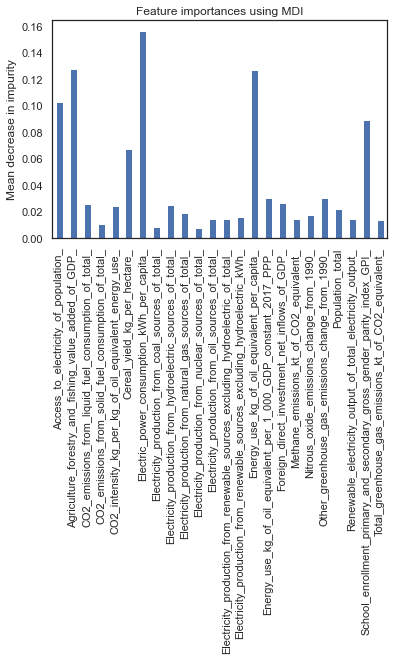

In [ ]:
fig, ax = plt.subplots()
imp.plot.bar(ax=ax)
ax.set_title("Feature importances using MDI")
ax.set_ylabel("Mean decrease in impurity")

In [ ]:
# Let's take the top 6
top_7 = imp.sort_values().head(7).index.to_list()

In [ ]:
X_7 = X[top_7]

In [ ]:
X_7

,Electricity_production_from_nuclear_sources_of_total_,Electricity_production_from_coal_sources_of_total_,CO2_emissions_from_solid_fuel_consumption_of_total_,Total_greenhouse_gas_emissions_kt_of_CO2_equivalent_,Renewable_electricity_output_of_total_electricity_output_,Methane_emissions_kt_of_CO2_equivalent_,Electricity_production_from_renewable_sources_excluding_hydroelectric_of_total_
0,1.141153,0.370699,0.143605,-0.215270,-0.841529,-0.270634,0.806272
1,-0.355563,-0.267507,-0.219752,-0.225792,1.347864,-0.221558,0.352379
2,-0.355563,-0.545583,-0.634300,-0.150164,1.260489,-0.001897,-0.879067
3,-0.355563,-0.545583,-0.394157,-0.237149,2.107901,-0.297056,-0.879067
4,-0.156441,-0.545583,-0.634300,-0.249497,2.122050,-0.331464,1.584072
...,...,...,...,...,...,...,...
211,-0.355563,3.469611,2.613362,-0.233808,-0.794220,-0.306801,-0.831258
212,-0.355563,-0.545583,-0.634300,-0.194443,-0.841529,-0.140837,-0.879067
213,0.095193,3.640074,4.062579,0.460987,-0.817115,0.367655,-0.858462
214,-0.355563,-0.538162,0.070597,-0.206949,2.202388,-0.193579,-0.879067


In [ ]:
X_train_7, X_test_7, Y_train_7, Y_test_7 = train_test_split(X_7, Y, test_size = 0.20, random_state = 50)

In [ ]:
param_grid = {'bootstrap': [True, False],
             'max_depth': [2, 3, 4, 5, 7],
             'min_samples_split': [1, 2, 3, 4, 5, 7, 10], 
             'min_samples_leaf': [1, 2, 3, 4, 5, 7, 10, 15, 20], 
             'max_features': ['sqrt'],
             'n_estimators': [750]}
rf_7 = RandomForestClassifier(random_state = 50)
rf_gs_7 = GridSearchCV(estimator = rf_7,
                     param_grid = param_grid,
                     cv = 3,
                     verbose = 3,
                     scoring = f1_scorer)
search = rf_gs_7.fit(X_train_7, Y_train_7)

Fitting 3 folds for each of 630 candidates, totalling 1890 fits
[CV 1/3] END bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=1, min_samples_split=1, n_estimators=750;, score=nan total time=   0.1s
[CV 2/3] END bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=1, min_samples_split=1, n_estimators=750;, score=nan total time=   0.1s
[CV 3/3] END bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=1, min_samples_split=1, n_estimators=750;, score=nan total time=   0.1s
[CV 1/3] END bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=1, min_samples_split=2, n_estimators=750;, score=0.421 total time=   0.5s
[CV 2/3] END bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=1, min_samples_split=2, n_estimators=750;, score=0.373 total time=   0.5s
[CV 3/3] END bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=1, min_samples_split=2, n_estimators=750;, score=0.414 total time=   0.5s
[CV 1/3] END bootstrap=True, m

[CV 1/3] END bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=3, min_samples_split=5, n_estimators=750;, score=0.421 total time=   0.5s
[CV 2/3] END bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=3, min_samples_split=5, n_estimators=750;, score=0.373 total time=   0.5s
[CV 3/3] END bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=3, min_samples_split=5, n_estimators=750;, score=0.414 total time=   0.5s
[CV 1/3] END bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=3, min_samples_split=7, n_estimators=750;, score=0.421 total time=   0.5s
[CV 2/3] END bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=3, min_samples_split=7, n_estimators=750;, score=0.373 total time=   0.5s
[CV 3/3] END bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=3, min_samples_split=7, n_estimators=750;, score=0.414 total time=   0.5s
[CV 1/3] END bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=3, min_sam

[CV 1/3] END bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=7, min_samples_split=2, n_estimators=750;, score=0.421 total time=   0.5s
[CV 2/3] END bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=7, min_samples_split=2, n_estimators=750;, score=0.353 total time=   0.5s
[CV 3/3] END bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=7, min_samples_split=2, n_estimators=750;, score=0.433 total time=   0.5s
[CV 1/3] END bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=7, min_samples_split=3, n_estimators=750;, score=0.421 total time=   0.5s
[CV 2/3] END bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=7, min_samples_split=3, n_estimators=750;, score=0.353 total time=   0.5s
[CV 3/3] END bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=7, min_samples_split=3, n_estimators=750;, score=0.433 total time=   0.5s
[CV 1/3] END bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=7, min_sam

[CV 1/3] END bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=15, min_samples_split=7, n_estimators=750;, score=0.390 total time=   0.5s
[CV 2/3] END bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=15, min_samples_split=7, n_estimators=750;, score=0.342 total time=   0.5s
[CV 3/3] END bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=15, min_samples_split=7, n_estimators=750;, score=0.389 total time=   0.5s
[CV 1/3] END bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=15, min_samples_split=10, n_estimators=750;, score=0.390 total time=   0.5s
[CV 2/3] END bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=15, min_samples_split=10, n_estimators=750;, score=0.342 total time=   0.5s
[CV 3/3] END bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=15, min_samples_split=10, n_estimators=750;, score=0.389 total time=   0.5s
[CV 1/3] END bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=2

[CV 1/3] END bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=2, min_samples_split=3, n_estimators=750;, score=0.465 total time=   0.5s
[CV 2/3] END bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=2, min_samples_split=3, n_estimators=750;, score=0.404 total time=   0.5s
[CV 3/3] END bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=2, min_samples_split=3, n_estimators=750;, score=0.418 total time=   0.5s
[CV 1/3] END bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=2, min_samples_split=4, n_estimators=750;, score=0.465 total time=   0.5s
[CV 2/3] END bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=2, min_samples_split=4, n_estimators=750;, score=0.404 total time=   0.5s
[CV 3/3] END bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=2, min_samples_split=4, n_estimators=750;, score=0.418 total time=   0.5s
[CV 1/3] END bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=2, min_sam

[CV 1/3] END bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=4, min_samples_split=10, n_estimators=750;, score=0.465 total time=   0.5s
[CV 2/3] END bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=4, min_samples_split=10, n_estimators=750;, score=0.422 total time=   0.5s
[CV 3/3] END bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=4, min_samples_split=10, n_estimators=750;, score=0.408 total time=   0.5s
[CV 1/3] END bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=5, min_samples_split=1, n_estimators=750;, score=nan total time=   0.1s
[CV 2/3] END bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=5, min_samples_split=1, n_estimators=750;, score=nan total time=   0.1s
[CV 3/3] END bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=5, min_samples_split=1, n_estimators=750;, score=nan total time=   0.1s
[CV 1/3] END bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=5, min_sample

[CV 1/3] END bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=10, min_samples_split=4, n_estimators=750;, score=0.421 total time=   0.5s
[CV 2/3] END bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=10, min_samples_split=4, n_estimators=750;, score=0.366 total time=   0.5s
[CV 3/3] END bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=10, min_samples_split=4, n_estimators=750;, score=0.431 total time=   0.5s
[CV 1/3] END bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=10, min_samples_split=5, n_estimators=750;, score=0.421 total time=   0.5s
[CV 2/3] END bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=10, min_samples_split=5, n_estimators=750;, score=0.366 total time=   0.5s
[CV 3/3] END bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=10, min_samples_split=5, n_estimators=750;, score=0.431 total time=   0.5s
[CV 1/3] END bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=10, 

[CV 2/3] END bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=1, min_samples_split=1, n_estimators=750;, score=nan total time=   0.1s
[CV 3/3] END bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=1, min_samples_split=1, n_estimators=750;, score=nan total time=   0.1s
[CV 1/3] END bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=1, min_samples_split=2, n_estimators=750;, score=0.469 total time=   0.5s
[CV 2/3] END bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=1, min_samples_split=2, n_estimators=750;, score=0.422 total time=   0.5s
[CV 3/3] END bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=1, min_samples_split=2, n_estimators=750;, score=0.413 total time=   0.5s
[CV 1/3] END bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=1, min_samples_split=3, n_estimators=750;, score=0.469 total time=   0.5s
[CV 2/3] END bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=1, min_samples

[CV 2/3] END bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=3, min_samples_split=5, n_estimators=750;, score=0.422 total time=   0.5s
[CV 3/3] END bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=3, min_samples_split=5, n_estimators=750;, score=0.408 total time=   0.5s
[CV 1/3] END bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=3, min_samples_split=7, n_estimators=750;, score=0.472 total time=   0.5s
[CV 2/3] END bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=3, min_samples_split=7, n_estimators=750;, score=0.422 total time=   0.5s
[CV 3/3] END bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=3, min_samples_split=7, n_estimators=750;, score=0.424 total time=   0.5s
[CV 1/3] END bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=3, min_samples_split=10, n_estimators=750;, score=0.472 total time=   0.5s
[CV 2/3] END bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=3, min_sa

[CV 2/3] END bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=7, min_samples_split=2, n_estimators=750;, score=0.386 total time=   0.5s
[CV 3/3] END bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=7, min_samples_split=2, n_estimators=750;, score=0.413 total time=   0.5s
[CV 1/3] END bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=7, min_samples_split=3, n_estimators=750;, score=0.425 total time=   0.5s
[CV 2/3] END bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=7, min_samples_split=3, n_estimators=750;, score=0.386 total time=   0.5s
[CV 3/3] END bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=7, min_samples_split=3, n_estimators=750;, score=0.413 total time=   0.5s
[CV 1/3] END bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=7, min_samples_split=4, n_estimators=750;, score=0.425 total time=   0.5s
[CV 2/3] END bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=7, min_sam

[CV 2/3] END bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=15, min_samples_split=7, n_estimators=750;, score=0.342 total time=   0.5s
[CV 3/3] END bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=15, min_samples_split=7, n_estimators=750;, score=0.389 total time=   0.5s
[CV 1/3] END bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=15, min_samples_split=10, n_estimators=750;, score=0.406 total time=   0.5s
[CV 2/3] END bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=15, min_samples_split=10, n_estimators=750;, score=0.342 total time=   0.5s
[CV 3/3] END bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=15, min_samples_split=10, n_estimators=750;, score=0.389 total time=   0.5s
[CV 1/3] END bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=20, min_samples_split=1, n_estimators=750;, score=nan total time=   0.1s
[CV 2/3] END bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=20,

[CV 2/3] END bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=2, min_samples_split=3, n_estimators=750;, score=0.410 total time=   0.5s
[CV 3/3] END bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=2, min_samples_split=3, n_estimators=750;, score=0.488 total time=   0.6s
[CV 1/3] END bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=2, min_samples_split=4, n_estimators=750;, score=0.482 total time=   0.6s
[CV 2/3] END bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=2, min_samples_split=4, n_estimators=750;, score=0.410 total time=   0.6s
[CV 3/3] END bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=2, min_samples_split=4, n_estimators=750;, score=0.488 total time=   0.6s
[CV 1/3] END bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=2, min_samples_split=5, n_estimators=750;, score=0.482 total time=   0.5s
[CV 2/3] END bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=2, min_sam

[CV 2/3] END bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=4, min_samples_split=10, n_estimators=750;, score=0.430 total time=   0.5s
[CV 3/3] END bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=4, min_samples_split=10, n_estimators=750;, score=0.431 total time=   0.5s
[CV 1/3] END bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=5, min_samples_split=1, n_estimators=750;, score=nan total time=   0.1s
[CV 2/3] END bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=5, min_samples_split=1, n_estimators=750;, score=nan total time=   0.1s
[CV 3/3] END bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=5, min_samples_split=1, n_estimators=750;, score=nan total time=   0.1s
[CV 1/3] END bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=5, min_samples_split=2, n_estimators=750;, score=0.437 total time=   0.5s
[CV 2/3] END bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=5, min_samples

[CV 2/3] END bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=10, min_samples_split=4, n_estimators=750;, score=0.366 total time=   0.5s
[CV 3/3] END bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=10, min_samples_split=4, n_estimators=750;, score=0.432 total time=   0.5s
[CV 1/3] END bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=10, min_samples_split=5, n_estimators=750;, score=0.421 total time=   0.5s
[CV 2/3] END bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=10, min_samples_split=5, n_estimators=750;, score=0.366 total time=   0.5s
[CV 3/3] END bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=10, min_samples_split=5, n_estimators=750;, score=0.432 total time=   0.6s
[CV 1/3] END bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=10, min_samples_split=7, n_estimators=750;, score=0.421 total time=   0.5s
[CV 2/3] END bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=10, 

[CV 2/3] END bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=1, min_samples_split=1, n_estimators=750;, score=nan total time=   0.1s
[CV 3/3] END bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=1, min_samples_split=1, n_estimators=750;, score=nan total time=   0.1s
[CV 1/3] END bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=1, min_samples_split=2, n_estimators=750;, score=0.501 total time=   0.5s
[CV 2/3] END bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=1, min_samples_split=2, n_estimators=750;, score=0.360 total time=   0.5s
[CV 3/3] END bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=1, min_samples_split=2, n_estimators=750;, score=0.442 total time=   0.5s
[CV 1/3] END bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=1, min_samples_split=3, n_estimators=750;, score=0.505 total time=   0.5s
[CV 2/3] END bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=1, min_samples

[CV 2/3] END bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=3, min_samples_split=5, n_estimators=750;, score=0.426 total time=   0.5s
[CV 3/3] END bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=3, min_samples_split=5, n_estimators=750;, score=0.488 total time=   0.5s
[CV 1/3] END bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=3, min_samples_split=7, n_estimators=750;, score=0.443 total time=   0.5s
[CV 2/3] END bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=3, min_samples_split=7, n_estimators=750;, score=0.437 total time=   0.5s
[CV 3/3] END bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=3, min_samples_split=7, n_estimators=750;, score=0.476 total time=   0.5s
[CV 1/3] END bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=3, min_samples_split=10, n_estimators=750;, score=0.440 total time=   0.5s
[CV 2/3] END bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=3, min_sa

[CV 2/3] END bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=7, min_samples_split=2, n_estimators=750;, score=0.412 total time=   0.5s
[CV 3/3] END bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=7, min_samples_split=2, n_estimators=750;, score=0.417 total time=   0.5s
[CV 1/3] END bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=7, min_samples_split=3, n_estimators=750;, score=0.425 total time=   0.5s
[CV 2/3] END bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=7, min_samples_split=3, n_estimators=750;, score=0.412 total time=   0.5s
[CV 3/3] END bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=7, min_samples_split=3, n_estimators=750;, score=0.417 total time=   0.5s
[CV 1/3] END bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=7, min_samples_split=4, n_estimators=750;, score=0.425 total time=   0.5s
[CV 2/3] END bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=7, min_sam

[CV 2/3] END bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=15, min_samples_split=7, n_estimators=750;, score=0.342 total time=   0.5s
[CV 3/3] END bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=15, min_samples_split=7, n_estimators=750;, score=0.389 total time=   0.5s
[CV 1/3] END bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=15, min_samples_split=10, n_estimators=750;, score=0.406 total time=   0.5s
[CV 2/3] END bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=15, min_samples_split=10, n_estimators=750;, score=0.342 total time=   0.5s
[CV 3/3] END bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=15, min_samples_split=10, n_estimators=750;, score=0.389 total time=   0.5s
[CV 1/3] END bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=20, min_samples_split=1, n_estimators=750;, score=nan total time=   0.1s
[CV 2/3] END bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=20,

[CV 2/3] END bootstrap=False, max_depth=2, max_features=sqrt, min_samples_leaf=2, min_samples_split=3, n_estimators=750;, score=0.331 total time=   0.4s
[CV 3/3] END bootstrap=False, max_depth=2, max_features=sqrt, min_samples_leaf=2, min_samples_split=3, n_estimators=750;, score=0.386 total time=   0.4s
[CV 1/3] END bootstrap=False, max_depth=2, max_features=sqrt, min_samples_leaf=2, min_samples_split=4, n_estimators=750;, score=0.390 total time=   0.4s
[CV 2/3] END bootstrap=False, max_depth=2, max_features=sqrt, min_samples_leaf=2, min_samples_split=4, n_estimators=750;, score=0.331 total time=   0.4s
[CV 3/3] END bootstrap=False, max_depth=2, max_features=sqrt, min_samples_leaf=2, min_samples_split=4, n_estimators=750;, score=0.386 total time=   0.4s
[CV 1/3] END bootstrap=False, max_depth=2, max_features=sqrt, min_samples_leaf=2, min_samples_split=5, n_estimators=750;, score=0.390 total time=   0.4s
[CV 2/3] END bootstrap=False, max_depth=2, max_features=sqrt, min_samples_leaf=2, 

[CV 2/3] END bootstrap=False, max_depth=2, max_features=sqrt, min_samples_leaf=4, min_samples_split=10, n_estimators=750;, score=0.356 total time=   0.4s
[CV 3/3] END bootstrap=False, max_depth=2, max_features=sqrt, min_samples_leaf=4, min_samples_split=10, n_estimators=750;, score=0.386 total time=   0.4s
[CV 1/3] END bootstrap=False, max_depth=2, max_features=sqrt, min_samples_leaf=5, min_samples_split=1, n_estimators=750;, score=nan total time=   0.1s
[CV 2/3] END bootstrap=False, max_depth=2, max_features=sqrt, min_samples_leaf=5, min_samples_split=1, n_estimators=750;, score=nan total time=   0.1s
[CV 3/3] END bootstrap=False, max_depth=2, max_features=sqrt, min_samples_leaf=5, min_samples_split=1, n_estimators=750;, score=nan total time=   0.1s
[CV 1/3] END bootstrap=False, max_depth=2, max_features=sqrt, min_samples_leaf=5, min_samples_split=2, n_estimators=750;, score=0.390 total time=   0.4s
[CV 2/3] END bootstrap=False, max_depth=2, max_features=sqrt, min_samples_leaf=5, min_

[CV 2/3] END bootstrap=False, max_depth=2, max_features=sqrt, min_samples_leaf=10, min_samples_split=4, n_estimators=750;, score=0.368 total time=   0.4s
[CV 3/3] END bootstrap=False, max_depth=2, max_features=sqrt, min_samples_leaf=10, min_samples_split=4, n_estimators=750;, score=0.377 total time=   0.4s
[CV 1/3] END bootstrap=False, max_depth=2, max_features=sqrt, min_samples_leaf=10, min_samples_split=5, n_estimators=750;, score=0.390 total time=   0.4s
[CV 2/3] END bootstrap=False, max_depth=2, max_features=sqrt, min_samples_leaf=10, min_samples_split=5, n_estimators=750;, score=0.368 total time=   0.4s
[CV 3/3] END bootstrap=False, max_depth=2, max_features=sqrt, min_samples_leaf=10, min_samples_split=5, n_estimators=750;, score=0.377 total time=   0.4s
[CV 1/3] END bootstrap=False, max_depth=2, max_features=sqrt, min_samples_leaf=10, min_samples_split=7, n_estimators=750;, score=0.390 total time=   0.4s
[CV 2/3] END bootstrap=False, max_depth=2, max_features=sqrt, min_samples_le

[CV 2/3] END bootstrap=False, max_depth=3, max_features=sqrt, min_samples_leaf=1, min_samples_split=1, n_estimators=750;, score=nan total time=   0.1s
[CV 3/3] END bootstrap=False, max_depth=3, max_features=sqrt, min_samples_leaf=1, min_samples_split=1, n_estimators=750;, score=nan total time=   0.1s
[CV 1/3] END bootstrap=False, max_depth=3, max_features=sqrt, min_samples_leaf=1, min_samples_split=2, n_estimators=750;, score=0.452 total time=   0.4s
[CV 2/3] END bootstrap=False, max_depth=3, max_features=sqrt, min_samples_leaf=1, min_samples_split=2, n_estimators=750;, score=0.350 total time=   0.4s
[CV 3/3] END bootstrap=False, max_depth=3, max_features=sqrt, min_samples_leaf=1, min_samples_split=2, n_estimators=750;, score=0.429 total time=   0.4s
[CV 1/3] END bootstrap=False, max_depth=3, max_features=sqrt, min_samples_leaf=1, min_samples_split=3, n_estimators=750;, score=0.452 total time=   0.4s
[CV 2/3] END bootstrap=False, max_depth=3, max_features=sqrt, min_samples_leaf=1, min_

[CV 2/3] END bootstrap=False, max_depth=3, max_features=sqrt, min_samples_leaf=3, min_samples_split=5, n_estimators=750;, score=0.406 total time=   0.4s
[CV 3/3] END bootstrap=False, max_depth=3, max_features=sqrt, min_samples_leaf=3, min_samples_split=5, n_estimators=750;, score=0.424 total time=   0.4s
[CV 1/3] END bootstrap=False, max_depth=3, max_features=sqrt, min_samples_leaf=3, min_samples_split=7, n_estimators=750;, score=0.435 total time=   0.4s
[CV 2/3] END bootstrap=False, max_depth=3, max_features=sqrt, min_samples_leaf=3, min_samples_split=7, n_estimators=750;, score=0.406 total time=   0.4s
[CV 3/3] END bootstrap=False, max_depth=3, max_features=sqrt, min_samples_leaf=3, min_samples_split=7, n_estimators=750;, score=0.424 total time=   0.4s
[CV 1/3] END bootstrap=False, max_depth=3, max_features=sqrt, min_samples_leaf=3, min_samples_split=10, n_estimators=750;, score=0.435 total time=   0.4s
[CV 2/3] END bootstrap=False, max_depth=3, max_features=sqrt, min_samples_leaf=3,

[CV 2/3] END bootstrap=False, max_depth=3, max_features=sqrt, min_samples_leaf=7, min_samples_split=2, n_estimators=750;, score=0.390 total time=   0.4s
[CV 3/3] END bootstrap=False, max_depth=3, max_features=sqrt, min_samples_leaf=7, min_samples_split=2, n_estimators=750;, score=0.437 total time=   0.4s
[CV 1/3] END bootstrap=False, max_depth=3, max_features=sqrt, min_samples_leaf=7, min_samples_split=3, n_estimators=750;, score=0.466 total time=   0.4s
[CV 2/3] END bootstrap=False, max_depth=3, max_features=sqrt, min_samples_leaf=7, min_samples_split=3, n_estimators=750;, score=0.390 total time=   0.4s
[CV 3/3] END bootstrap=False, max_depth=3, max_features=sqrt, min_samples_leaf=7, min_samples_split=3, n_estimators=750;, score=0.437 total time=   0.4s
[CV 1/3] END bootstrap=False, max_depth=3, max_features=sqrt, min_samples_leaf=7, min_samples_split=4, n_estimators=750;, score=0.466 total time=   0.4s
[CV 2/3] END bootstrap=False, max_depth=3, max_features=sqrt, min_samples_leaf=7, 

[CV 2/3] END bootstrap=False, max_depth=3, max_features=sqrt, min_samples_leaf=15, min_samples_split=7, n_estimators=750;, score=0.460 total time=   0.4s
[CV 3/3] END bootstrap=False, max_depth=3, max_features=sqrt, min_samples_leaf=15, min_samples_split=7, n_estimators=750;, score=0.376 total time=   0.4s
[CV 1/3] END bootstrap=False, max_depth=3, max_features=sqrt, min_samples_leaf=15, min_samples_split=10, n_estimators=750;, score=0.406 total time=   0.4s
[CV 2/3] END bootstrap=False, max_depth=3, max_features=sqrt, min_samples_leaf=15, min_samples_split=10, n_estimators=750;, score=0.460 total time=   0.4s
[CV 3/3] END bootstrap=False, max_depth=3, max_features=sqrt, min_samples_leaf=15, min_samples_split=10, n_estimators=750;, score=0.376 total time=   0.4s
[CV 1/3] END bootstrap=False, max_depth=3, max_features=sqrt, min_samples_leaf=20, min_samples_split=1, n_estimators=750;, score=nan total time=   0.1s
[CV 2/3] END bootstrap=False, max_depth=3, max_features=sqrt, min_samples_l

[CV 2/3] END bootstrap=False, max_depth=4, max_features=sqrt, min_samples_leaf=2, min_samples_split=3, n_estimators=750;, score=0.380 total time=   0.4s
[CV 3/3] END bootstrap=False, max_depth=4, max_features=sqrt, min_samples_leaf=2, min_samples_split=3, n_estimators=750;, score=0.391 total time=   0.4s
[CV 1/3] END bootstrap=False, max_depth=4, max_features=sqrt, min_samples_leaf=2, min_samples_split=4, n_estimators=750;, score=0.497 total time=   0.4s
[CV 2/3] END bootstrap=False, max_depth=4, max_features=sqrt, min_samples_leaf=2, min_samples_split=4, n_estimators=750;, score=0.380 total time=   0.4s
[CV 3/3] END bootstrap=False, max_depth=4, max_features=sqrt, min_samples_leaf=2, min_samples_split=4, n_estimators=750;, score=0.391 total time=   0.4s
[CV 1/3] END bootstrap=False, max_depth=4, max_features=sqrt, min_samples_leaf=2, min_samples_split=5, n_estimators=750;, score=0.497 total time=   0.4s
[CV 2/3] END bootstrap=False, max_depth=4, max_features=sqrt, min_samples_leaf=2, 

[CV 2/3] END bootstrap=False, max_depth=4, max_features=sqrt, min_samples_leaf=4, min_samples_split=10, n_estimators=750;, score=0.391 total time=   0.4s
[CV 3/3] END bootstrap=False, max_depth=4, max_features=sqrt, min_samples_leaf=4, min_samples_split=10, n_estimators=750;, score=0.391 total time=   0.4s
[CV 1/3] END bootstrap=False, max_depth=4, max_features=sqrt, min_samples_leaf=5, min_samples_split=1, n_estimators=750;, score=nan total time=   0.1s
[CV 2/3] END bootstrap=False, max_depth=4, max_features=sqrt, min_samples_leaf=5, min_samples_split=1, n_estimators=750;, score=nan total time=   0.1s
[CV 3/3] END bootstrap=False, max_depth=4, max_features=sqrt, min_samples_leaf=5, min_samples_split=1, n_estimators=750;, score=nan total time=   0.1s
[CV 1/3] END bootstrap=False, max_depth=4, max_features=sqrt, min_samples_leaf=5, min_samples_split=2, n_estimators=750;, score=0.481 total time=   0.4s
[CV 2/3] END bootstrap=False, max_depth=4, max_features=sqrt, min_samples_leaf=5, min_

[CV 2/3] END bootstrap=False, max_depth=4, max_features=sqrt, min_samples_leaf=10, min_samples_split=4, n_estimators=750;, score=0.446 total time=   0.4s
[CV 3/3] END bootstrap=False, max_depth=4, max_features=sqrt, min_samples_leaf=10, min_samples_split=4, n_estimators=750;, score=0.390 total time=   0.4s
[CV 1/3] END bootstrap=False, max_depth=4, max_features=sqrt, min_samples_leaf=10, min_samples_split=5, n_estimators=750;, score=0.450 total time=   0.4s
[CV 2/3] END bootstrap=False, max_depth=4, max_features=sqrt, min_samples_leaf=10, min_samples_split=5, n_estimators=750;, score=0.446 total time=   0.4s
[CV 3/3] END bootstrap=False, max_depth=4, max_features=sqrt, min_samples_leaf=10, min_samples_split=5, n_estimators=750;, score=0.390 total time=   0.4s
[CV 1/3] END bootstrap=False, max_depth=4, max_features=sqrt, min_samples_leaf=10, min_samples_split=7, n_estimators=750;, score=0.450 total time=   0.4s
[CV 2/3] END bootstrap=False, max_depth=4, max_features=sqrt, min_samples_le

[CV 2/3] END bootstrap=False, max_depth=5, max_features=sqrt, min_samples_leaf=1, min_samples_split=1, n_estimators=750;, score=nan total time=   0.1s
[CV 3/3] END bootstrap=False, max_depth=5, max_features=sqrt, min_samples_leaf=1, min_samples_split=1, n_estimators=750;, score=nan total time=   0.1s
[CV 1/3] END bootstrap=False, max_depth=5, max_features=sqrt, min_samples_leaf=1, min_samples_split=2, n_estimators=750;, score=0.466 total time=   0.4s
[CV 2/3] END bootstrap=False, max_depth=5, max_features=sqrt, min_samples_leaf=1, min_samples_split=2, n_estimators=750;, score=0.375 total time=   0.4s
[CV 3/3] END bootstrap=False, max_depth=5, max_features=sqrt, min_samples_leaf=1, min_samples_split=2, n_estimators=750;, score=0.380 total time=   0.4s
[CV 1/3] END bootstrap=False, max_depth=5, max_features=sqrt, min_samples_leaf=1, min_samples_split=3, n_estimators=750;, score=0.484 total time=   0.4s
[CV 2/3] END bootstrap=False, max_depth=5, max_features=sqrt, min_samples_leaf=1, min_

[CV 2/3] END bootstrap=False, max_depth=5, max_features=sqrt, min_samples_leaf=3, min_samples_split=5, n_estimators=750;, score=0.404 total time=   0.4s
[CV 3/3] END bootstrap=False, max_depth=5, max_features=sqrt, min_samples_leaf=3, min_samples_split=5, n_estimators=750;, score=0.381 total time=   0.4s
[CV 1/3] END bootstrap=False, max_depth=5, max_features=sqrt, min_samples_leaf=3, min_samples_split=7, n_estimators=750;, score=0.443 total time=   0.4s
[CV 2/3] END bootstrap=False, max_depth=5, max_features=sqrt, min_samples_leaf=3, min_samples_split=7, n_estimators=750;, score=0.404 total time=   0.4s
[CV 3/3] END bootstrap=False, max_depth=5, max_features=sqrt, min_samples_leaf=3, min_samples_split=7, n_estimators=750;, score=0.381 total time=   0.4s
[CV 1/3] END bootstrap=False, max_depth=5, max_features=sqrt, min_samples_leaf=3, min_samples_split=10, n_estimators=750;, score=0.468 total time=   0.4s
[CV 2/3] END bootstrap=False, max_depth=5, max_features=sqrt, min_samples_leaf=3,

[CV 2/3] END bootstrap=False, max_depth=5, max_features=sqrt, min_samples_leaf=7, min_samples_split=2, n_estimators=750;, score=0.436 total time=   0.4s
[CV 3/3] END bootstrap=False, max_depth=5, max_features=sqrt, min_samples_leaf=7, min_samples_split=2, n_estimators=750;, score=0.399 total time=   0.4s
[CV 1/3] END bootstrap=False, max_depth=5, max_features=sqrt, min_samples_leaf=7, min_samples_split=3, n_estimators=750;, score=0.476 total time=   0.4s
[CV 2/3] END bootstrap=False, max_depth=5, max_features=sqrt, min_samples_leaf=7, min_samples_split=3, n_estimators=750;, score=0.436 total time=   0.4s
[CV 3/3] END bootstrap=False, max_depth=5, max_features=sqrt, min_samples_leaf=7, min_samples_split=3, n_estimators=750;, score=0.399 total time=   0.4s
[CV 1/3] END bootstrap=False, max_depth=5, max_features=sqrt, min_samples_leaf=7, min_samples_split=4, n_estimators=750;, score=0.476 total time=   0.4s
[CV 2/3] END bootstrap=False, max_depth=5, max_features=sqrt, min_samples_leaf=7, 

[CV 2/3] END bootstrap=False, max_depth=5, max_features=sqrt, min_samples_leaf=15, min_samples_split=7, n_estimators=750;, score=0.449 total time=   0.4s
[CV 3/3] END bootstrap=False, max_depth=5, max_features=sqrt, min_samples_leaf=15, min_samples_split=7, n_estimators=750;, score=0.376 total time=   0.4s
[CV 1/3] END bootstrap=False, max_depth=5, max_features=sqrt, min_samples_leaf=15, min_samples_split=10, n_estimators=750;, score=0.406 total time=   0.4s
[CV 2/3] END bootstrap=False, max_depth=5, max_features=sqrt, min_samples_leaf=15, min_samples_split=10, n_estimators=750;, score=0.449 total time=   0.4s
[CV 3/3] END bootstrap=False, max_depth=5, max_features=sqrt, min_samples_leaf=15, min_samples_split=10, n_estimators=750;, score=0.376 total time=   0.4s
[CV 1/3] END bootstrap=False, max_depth=5, max_features=sqrt, min_samples_leaf=20, min_samples_split=1, n_estimators=750;, score=nan total time=   0.1s
[CV 2/3] END bootstrap=False, max_depth=5, max_features=sqrt, min_samples_l

[CV 2/3] END bootstrap=False, max_depth=7, max_features=sqrt, min_samples_leaf=2, min_samples_split=3, n_estimators=750;, score=0.406 total time=   0.4s
[CV 3/3] END bootstrap=False, max_depth=7, max_features=sqrt, min_samples_leaf=2, min_samples_split=3, n_estimators=750;, score=0.408 total time=   0.4s
[CV 1/3] END bootstrap=False, max_depth=7, max_features=sqrt, min_samples_leaf=2, min_samples_split=4, n_estimators=750;, score=0.491 total time=   0.4s
[CV 2/3] END bootstrap=False, max_depth=7, max_features=sqrt, min_samples_leaf=2, min_samples_split=4, n_estimators=750;, score=0.406 total time=   0.4s
[CV 3/3] END bootstrap=False, max_depth=7, max_features=sqrt, min_samples_leaf=2, min_samples_split=4, n_estimators=750;, score=0.408 total time=   0.4s
[CV 1/3] END bootstrap=False, max_depth=7, max_features=sqrt, min_samples_leaf=2, min_samples_split=5, n_estimators=750;, score=0.491 total time=   0.4s
[CV 2/3] END bootstrap=False, max_depth=7, max_features=sqrt, min_samples_leaf=2, 

[CV 2/3] END bootstrap=False, max_depth=7, max_features=sqrt, min_samples_leaf=4, min_samples_split=10, n_estimators=750;, score=0.394 total time=   0.4s
[CV 3/3] END bootstrap=False, max_depth=7, max_features=sqrt, min_samples_leaf=4, min_samples_split=10, n_estimators=750;, score=0.399 total time=   0.4s
[CV 1/3] END bootstrap=False, max_depth=7, max_features=sqrt, min_samples_leaf=5, min_samples_split=1, n_estimators=750;, score=nan total time=   0.1s
[CV 2/3] END bootstrap=False, max_depth=7, max_features=sqrt, min_samples_leaf=5, min_samples_split=1, n_estimators=750;, score=nan total time=   0.1s
[CV 3/3] END bootstrap=False, max_depth=7, max_features=sqrt, min_samples_leaf=5, min_samples_split=1, n_estimators=750;, score=nan total time=   0.1s
[CV 1/3] END bootstrap=False, max_depth=7, max_features=sqrt, min_samples_leaf=5, min_samples_split=2, n_estimators=750;, score=0.447 total time=   0.4s
[CV 2/3] END bootstrap=False, max_depth=7, max_features=sqrt, min_samples_leaf=5, min_

[CV 2/3] END bootstrap=False, max_depth=7, max_features=sqrt, min_samples_leaf=10, min_samples_split=4, n_estimators=750;, score=0.446 total time=   0.4s
[CV 3/3] END bootstrap=False, max_depth=7, max_features=sqrt, min_samples_leaf=10, min_samples_split=4, n_estimators=750;, score=0.426 total time=   0.4s
[CV 1/3] END bootstrap=False, max_depth=7, max_features=sqrt, min_samples_leaf=10, min_samples_split=5, n_estimators=750;, score=0.454 total time=   0.4s
[CV 2/3] END bootstrap=False, max_depth=7, max_features=sqrt, min_samples_leaf=10, min_samples_split=5, n_estimators=750;, score=0.446 total time=   0.4s
[CV 3/3] END bootstrap=False, max_depth=7, max_features=sqrt, min_samples_leaf=10, min_samples_split=5, n_estimators=750;, score=0.426 total time=   0.4s
[CV 1/3] END bootstrap=False, max_depth=7, max_features=sqrt, min_samples_leaf=10, min_samples_split=7, n_estimators=750;, score=0.454 total time=   0.4s
[CV 2/3] END bootstrap=False, max_depth=7, max_features=sqrt, min_samples_le

/Users/jaskainth/opt/anaconda3/lib/python3.9/site-packages/sklearn/model_selection/_validation.py:372: FitFailedWarning: 
270 fits failed out of a total of 1890.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
135 fits failed with the following error:
Traceback (most recent call last):
  File "/Users/jaskainth/opt/anaconda3/lib/python3.9/site-packages/sklearn/model_selection/_validation.py", line 680, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/jaskainth/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py", line 450, in fit
    trees = Parallel(
  File "/Users/jaskainth/opt/anaconda3/lib/python3.9/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_ba

In [ ]:
pd.DataFrame(search.cv_results_) # The results of the cv

,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_bootstrap,param_max_depth,param_max_features,param_min_samples_leaf,param_min_samples_split,param_n_estimators,params,split0_test_score,split1_test_score,split2_test_score,mean_test_score,std_test_score,rank_test_score
0,0.137902,0.006955,0.000000,0.000000,True,2,sqrt,1,1,750,"{'bootstrap': True, 'max_depth': 2, 'max_featu...",NaN,NaN,NaN,NaN,NaN,630
1,0.448135,0.004659,0.032124,0.000076,True,2,sqrt,1,2,750,"{'bootstrap': True, 'max_depth': 2, 'max_featu...",0.420819,0.373491,0.414280,0.402863,0.020940,361
2,0.452068,0.010238,0.032546,0.000535,True,2,sqrt,1,3,750,"{'bootstrap': True, 'max_depth': 2, 'max_featu...",0.420819,0.373491,0.414280,0.402863,0.020940,361
3,0.445540,0.000935,0.032181,0.000145,True,2,sqrt,1,4,750,"{'bootstrap': True, 'max_depth': 2, 'max_featu...",0.420819,0.373491,0.414280,0.402863,0.020940,361
4,0.454349,0.006116,0.032702,0.000454,True,2,sqrt,1,5,750,"{'bootstrap': True, 'max_depth': 2, 'max_featu...",0.420819,0.373491,0.414280,0.402863,0.020940,361
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
625,0.326272,0.003030,0.033515,0.001229,False,7,sqrt,20,3,750,"{'bootstrap': False, 'max_depth': 7, 'max_feat...",0.406041,0.355611,0.423177,0.394943,0.028678,397
626,0.327279,0.003174,0.032715,0.000355,False,7,sqrt,20,4,750,"{'bootstrap': False, 'max_depth': 7, 'max_feat...",0.406041,0.355611,0.423177,0.394943,0.028678,397
627,0.324063,0.000563,0.032542,0.000299,False,7,sqrt,20,5,750,"{'bootstrap': False, 'max_depth': 7, 'max_feat...",0.406041,0.355611,0.423177,0.394943,0.028678,397
628,0.330244,0.008470,0.033573,0.000645,False,7,sqrt,20,7,750,"{'bootstrap': False, 'max_depth': 7, 'max_feat...",0.406041,0.355611,0.423177,0.394943,0.028678,397


In [ ]:
search.best_params_

{'bootstrap': True,
 'max_depth': 7,
 'max_features': 'sqrt',
 'min_samples_leaf': 2,
 'min_samples_split': 2,
 'n_estimators': 750}

In [ ]:
rf_final_7 = RandomForestClassifier(bootstrap = True,
                                  max_depth = 7,
                                  max_features = 'sqrt',
                                  min_samples_leaf = 2,
                                  min_samples_split = 2,
                                  n_estimators = 750,
                                  random_state = 50)
rf_final_7.fit(X_train_7, Y_train_7)

RandomForestClassifier(max_depth=7, max_features='sqrt', min_samples_leaf=2,
                       n_estimators=750, random_state=50)

In [ ]:
Y_pred_7 = rf_final_7.predict(X_test_7)

In [ ]:
print(classification_report(Y_test_7, Y_pred_7))

                     precision    recall  f1-score   support

        High income       0.57      1.00      0.72        13
         Low income       0.50      0.12      0.20         8
Lower middle income       0.31      0.62      0.42         8
Upper middle income       0.67      0.13      0.22        15

           accuracy                           0.48        44
          macro avg       0.51      0.47      0.39        44
       weighted avg       0.54      0.48      0.40        44



This did a lot worse that before

We don't have a lot of instances either and we are predicting 4 different classes which is also one of the reason our model isn't performing well - what if we reduce this to 2 (group high income and middle upper income together and group lower income and middle lower income together)

### Random Forest with Grouped Response

In [ ]:
Y_2 = Y.map(income_group_map)

In [ ]:
X_train_2, X_test_2, Y_train_2, Y_test_2 = train_test_split(X, Y_2, test_size = 0.20, random_state = 50)

In [ ]:
param_grid = {'bootstrap': [True, False],
             'max_depth': [2, 3, 4, 5, 7],
             'min_samples_split': [1, 2, 3, 4, 5, 7, 10], 
             'min_samples_leaf': [1, 2, 3, 4, 5, 7, 10, 15, 20], 
             'max_features': ['sqrt'],
             'n_estimators': [750]}
rf_2 = RandomForestClassifier(random_state = 50)
rf_gs_2 = GridSearchCV(estimator = rf_2,
                     param_grid = param_grid,
                     cv = 3,
                     verbose = 3,
                     scoring = f1_scorer)
search = rf_gs_2.fit(X_train_2, Y_train_2)

Fitting 3 folds for each of 630 candidates, totalling 1890 fits
[CV 1/3] END bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=1, min_samples_split=1, n_estimators=750;, score=nan total time=   0.2s
[CV 2/3] END bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=1, min_samples_split=1, n_estimators=750;, score=nan total time=   0.1s
[CV 3/3] END bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=1, min_samples_split=1, n_estimators=750;, score=nan total time=   0.1s
[CV 1/3] END bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=1, min_samples_split=2, n_estimators=750;, score=0.745 total time=   0.5s
[CV 2/3] END bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=1, min_samples_split=2, n_estimators=750;, score=0.847 total time=   0.5s
[CV 3/3] END bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=1, min_samples_split=2, n_estimators=750;, score=0.843 total time=   0.5s
[CV 1/3] END bootstrap=True, m

[CV 1/3] END bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=3, min_samples_split=5, n_estimators=750;, score=0.745 total time=   0.5s
[CV 2/3] END bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=3, min_samples_split=5, n_estimators=750;, score=0.847 total time=   0.5s
[CV 3/3] END bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=3, min_samples_split=5, n_estimators=750;, score=0.892 total time=   0.5s
[CV 1/3] END bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=3, min_samples_split=7, n_estimators=750;, score=0.745 total time=   0.5s
[CV 2/3] END bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=3, min_samples_split=7, n_estimators=750;, score=0.847 total time=   0.5s
[CV 3/3] END bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=3, min_samples_split=7, n_estimators=750;, score=0.892 total time=   0.5s
[CV 1/3] END bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=3, min_sam

[CV 1/3] END bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=7, min_samples_split=2, n_estimators=750;, score=0.745 total time=   0.5s
[CV 2/3] END bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=7, min_samples_split=2, n_estimators=750;, score=0.847 total time=   0.5s
[CV 3/3] END bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=7, min_samples_split=2, n_estimators=750;, score=0.823 total time=   0.5s
[CV 1/3] END bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=7, min_samples_split=3, n_estimators=750;, score=0.745 total time=   0.5s
[CV 2/3] END bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=7, min_samples_split=3, n_estimators=750;, score=0.847 total time=   0.5s
[CV 3/3] END bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=7, min_samples_split=3, n_estimators=750;, score=0.823 total time=   0.5s
[CV 1/3] END bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=7, min_sam

[CV 1/3] END bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=15, min_samples_split=7, n_estimators=750;, score=0.745 total time=   0.5s
[CV 2/3] END bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=15, min_samples_split=7, n_estimators=750;, score=0.798 total time=   0.5s
[CV 3/3] END bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=15, min_samples_split=7, n_estimators=750;, score=0.788 total time=   0.5s
[CV 1/3] END bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=15, min_samples_split=10, n_estimators=750;, score=0.745 total time=   0.5s
[CV 2/3] END bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=15, min_samples_split=10, n_estimators=750;, score=0.798 total time=   0.5s
[CV 3/3] END bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=15, min_samples_split=10, n_estimators=750;, score=0.788 total time=   0.5s
[CV 1/3] END bootstrap=True, max_depth=2, max_features=sqrt, min_samples_leaf=2

[CV 1/3] END bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=2, min_samples_split=3, n_estimators=750;, score=0.781 total time=   0.5s
[CV 2/3] END bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=2, min_samples_split=3, n_estimators=750;, score=0.858 total time=   0.6s
[CV 3/3] END bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=2, min_samples_split=3, n_estimators=750;, score=0.942 total time=   0.5s
[CV 1/3] END bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=2, min_samples_split=4, n_estimators=750;, score=0.781 total time=   0.5s
[CV 2/3] END bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=2, min_samples_split=4, n_estimators=750;, score=0.858 total time=   0.5s
[CV 3/3] END bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=2, min_samples_split=4, n_estimators=750;, score=0.942 total time=   0.5s
[CV 1/3] END bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=2, min_sam

[CV 1/3] END bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=4, min_samples_split=10, n_estimators=750;, score=0.781 total time=   0.5s
[CV 2/3] END bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=4, min_samples_split=10, n_estimators=750;, score=0.856 total time=   0.5s
[CV 3/3] END bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=4, min_samples_split=10, n_estimators=750;, score=0.942 total time=   0.5s
[CV 1/3] END bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=5, min_samples_split=1, n_estimators=750;, score=nan total time=   0.1s
[CV 2/3] END bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=5, min_samples_split=1, n_estimators=750;, score=nan total time=   0.1s
[CV 3/3] END bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=5, min_samples_split=1, n_estimators=750;, score=nan total time=   0.1s
[CV 1/3] END bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=5, min_sample

[CV 1/3] END bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=10, min_samples_split=4, n_estimators=750;, score=0.781 total time=   0.5s
[CV 2/3] END bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=10, min_samples_split=4, n_estimators=750;, score=0.872 total time=   0.5s
[CV 3/3] END bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=10, min_samples_split=4, n_estimators=750;, score=0.843 total time=   0.5s
[CV 1/3] END bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=10, min_samples_split=5, n_estimators=750;, score=0.781 total time=   0.5s
[CV 2/3] END bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=10, min_samples_split=5, n_estimators=750;, score=0.872 total time=   0.5s
[CV 3/3] END bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=10, min_samples_split=5, n_estimators=750;, score=0.843 total time=   0.5s
[CV 1/3] END bootstrap=True, max_depth=3, max_features=sqrt, min_samples_leaf=10, 

[CV 2/3] END bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=1, min_samples_split=1, n_estimators=750;, score=nan total time=   0.1s
[CV 3/3] END bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=1, min_samples_split=1, n_estimators=750;, score=nan total time=   0.1s
[CV 1/3] END bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=1, min_samples_split=2, n_estimators=750;, score=0.862 total time=   0.5s
[CV 2/3] END bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=1, min_samples_split=2, n_estimators=750;, score=0.858 total time=   0.5s
[CV 3/3] END bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=1, min_samples_split=2, n_estimators=750;, score=0.925 total time=   0.5s
[CV 1/3] END bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=1, min_samples_split=3, n_estimators=750;, score=0.862 total time=   0.5s
[CV 2/3] END bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=1, min_samples

[CV 2/3] END bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=3, min_samples_split=5, n_estimators=750;, score=0.858 total time=   0.5s
[CV 3/3] END bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=3, min_samples_split=5, n_estimators=750;, score=0.925 total time=   0.5s
[CV 1/3] END bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=3, min_samples_split=7, n_estimators=750;, score=0.859 total time=   0.5s
[CV 2/3] END bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=3, min_samples_split=7, n_estimators=750;, score=0.858 total time=   0.5s
[CV 3/3] END bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=3, min_samples_split=7, n_estimators=750;, score=0.925 total time=   0.5s
[CV 1/3] END bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=3, min_samples_split=10, n_estimators=750;, score=0.859 total time=   0.5s
[CV 2/3] END bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=3, min_sa

[CV 2/3] END bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=7, min_samples_split=2, n_estimators=750;, score=0.873 total time=   0.5s
[CV 3/3] END bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=7, min_samples_split=2, n_estimators=750;, score=0.942 total time=   0.5s
[CV 1/3] END bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=7, min_samples_split=3, n_estimators=750;, score=0.811 total time=   0.5s
[CV 2/3] END bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=7, min_samples_split=3, n_estimators=750;, score=0.873 total time=   0.5s
[CV 3/3] END bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=7, min_samples_split=3, n_estimators=750;, score=0.942 total time=   0.5s
[CV 1/3] END bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=7, min_samples_split=4, n_estimators=750;, score=0.811 total time=   0.5s
[CV 2/3] END bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=7, min_sam

[CV 2/3] END bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=15, min_samples_split=7, n_estimators=750;, score=0.798 total time=   0.5s
[CV 3/3] END bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=15, min_samples_split=7, n_estimators=750;, score=0.788 total time=   0.5s
[CV 1/3] END bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=15, min_samples_split=10, n_estimators=750;, score=0.745 total time=   0.5s
[CV 2/3] END bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=15, min_samples_split=10, n_estimators=750;, score=0.798 total time=   0.5s
[CV 3/3] END bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=15, min_samples_split=10, n_estimators=750;, score=0.788 total time=   0.5s
[CV 1/3] END bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=20, min_samples_split=1, n_estimators=750;, score=nan total time=   0.1s
[CV 2/3] END bootstrap=True, max_depth=4, max_features=sqrt, min_samples_leaf=20,

[CV 2/3] END bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=2, min_samples_split=3, n_estimators=750;, score=0.875 total time=   0.5s
[CV 3/3] END bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=2, min_samples_split=3, n_estimators=750;, score=0.925 total time=   0.5s
[CV 1/3] END bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=2, min_samples_split=4, n_estimators=750;, score=0.879 total time=   0.5s
[CV 2/3] END bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=2, min_samples_split=4, n_estimators=750;, score=0.875 total time=   0.5s
[CV 3/3] END bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=2, min_samples_split=4, n_estimators=750;, score=0.925 total time=   0.5s
[CV 1/3] END bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=2, min_samples_split=5, n_estimators=750;, score=0.879 total time=   0.5s
[CV 2/3] END bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=2, min_sam

[CV 2/3] END bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=4, min_samples_split=10, n_estimators=750;, score=0.841 total time=   0.5s
[CV 3/3] END bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=4, min_samples_split=10, n_estimators=750;, score=0.925 total time=   0.5s
[CV 1/3] END bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=5, min_samples_split=1, n_estimators=750;, score=nan total time=   0.1s
[CV 2/3] END bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=5, min_samples_split=1, n_estimators=750;, score=nan total time=   0.1s
[CV 3/3] END bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=5, min_samples_split=1, n_estimators=750;, score=nan total time=   0.1s
[CV 1/3] END bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=5, min_samples_split=2, n_estimators=750;, score=0.859 total time=   0.5s
[CV 2/3] END bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=5, min_samples

[CV 2/3] END bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=10, min_samples_split=4, n_estimators=750;, score=0.872 total time=   0.5s
[CV 3/3] END bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=10, min_samples_split=4, n_estimators=750;, score=0.874 total time=   0.5s
[CV 1/3] END bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=10, min_samples_split=5, n_estimators=750;, score=0.781 total time=   0.5s
[CV 2/3] END bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=10, min_samples_split=5, n_estimators=750;, score=0.872 total time=   0.5s
[CV 3/3] END bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=10, min_samples_split=5, n_estimators=750;, score=0.874 total time=   0.5s
[CV 1/3] END bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=10, min_samples_split=7, n_estimators=750;, score=0.781 total time=   0.5s
[CV 2/3] END bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=10, 

[CV 2/3] END bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=1, min_samples_split=1, n_estimators=750;, score=nan total time=   0.1s
[CV 3/3] END bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=1, min_samples_split=1, n_estimators=750;, score=nan total time=   0.1s
[CV 1/3] END bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=1, min_samples_split=2, n_estimators=750;, score=0.862 total time=   0.5s
[CV 2/3] END bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=1, min_samples_split=2, n_estimators=750;, score=0.892 total time=   0.5s
[CV 3/3] END bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=1, min_samples_split=2, n_estimators=750;, score=0.907 total time=   0.5s
[CV 1/3] END bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=1, min_samples_split=3, n_estimators=750;, score=0.862 total time=   0.5s
[CV 2/3] END bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=1, min_samples

[CV 2/3] END bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=3, min_samples_split=5, n_estimators=750;, score=0.875 total time=   0.5s
[CV 3/3] END bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=3, min_samples_split=5, n_estimators=750;, score=0.925 total time=   0.5s
[CV 1/3] END bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=3, min_samples_split=7, n_estimators=750;, score=0.879 total time=   0.5s
[CV 2/3] END bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=3, min_samples_split=7, n_estimators=750;, score=0.858 total time=   0.5s
[CV 3/3] END bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=3, min_samples_split=7, n_estimators=750;, score=0.925 total time=   0.5s
[CV 1/3] END bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=3, min_samples_split=10, n_estimators=750;, score=0.879 total time=   0.5s
[CV 2/3] END bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=3, min_sa

[CV 2/3] END bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=7, min_samples_split=2, n_estimators=750;, score=0.873 total time=   0.5s
[CV 3/3] END bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=7, min_samples_split=2, n_estimators=750;, score=0.942 total time=   0.5s
[CV 1/3] END bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=7, min_samples_split=3, n_estimators=750;, score=0.811 total time=   0.5s
[CV 2/3] END bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=7, min_samples_split=3, n_estimators=750;, score=0.873 total time=   0.5s
[CV 3/3] END bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=7, min_samples_split=3, n_estimators=750;, score=0.942 total time=   0.5s
[CV 1/3] END bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=7, min_samples_split=4, n_estimators=750;, score=0.811 total time=   0.5s
[CV 2/3] END bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=7, min_sam

[CV 2/3] END bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=15, min_samples_split=7, n_estimators=750;, score=0.798 total time=   0.5s
[CV 3/3] END bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=15, min_samples_split=7, n_estimators=750;, score=0.788 total time=   0.5s
[CV 1/3] END bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=15, min_samples_split=10, n_estimators=750;, score=0.745 total time=   0.5s
[CV 2/3] END bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=15, min_samples_split=10, n_estimators=750;, score=0.798 total time=   0.5s
[CV 3/3] END bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=15, min_samples_split=10, n_estimators=750;, score=0.788 total time=   0.5s
[CV 1/3] END bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=20, min_samples_split=1, n_estimators=750;, score=nan total time=   0.1s
[CV 2/3] END bootstrap=True, max_depth=7, max_features=sqrt, min_samples_leaf=20,

[CV 2/3] END bootstrap=False, max_depth=2, max_features=sqrt, min_samples_leaf=2, min_samples_split=3, n_estimators=750;, score=0.847 total time=   0.4s
[CV 3/3] END bootstrap=False, max_depth=2, max_features=sqrt, min_samples_leaf=2, min_samples_split=3, n_estimators=750;, score=0.874 total time=   0.4s
[CV 1/3] END bootstrap=False, max_depth=2, max_features=sqrt, min_samples_leaf=2, min_samples_split=4, n_estimators=750;, score=0.761 total time=   0.4s
[CV 2/3] END bootstrap=False, max_depth=2, max_features=sqrt, min_samples_leaf=2, min_samples_split=4, n_estimators=750;, score=0.847 total time=   0.4s
[CV 3/3] END bootstrap=False, max_depth=2, max_features=sqrt, min_samples_leaf=2, min_samples_split=4, n_estimators=750;, score=0.874 total time=   0.4s
[CV 1/3] END bootstrap=False, max_depth=2, max_features=sqrt, min_samples_leaf=2, min_samples_split=5, n_estimators=750;, score=0.761 total time=   0.4s
[CV 2/3] END bootstrap=False, max_depth=2, max_features=sqrt, min_samples_leaf=2, 

[CV 2/3] END bootstrap=False, max_depth=2, max_features=sqrt, min_samples_leaf=4, min_samples_split=10, n_estimators=750;, score=0.847 total time=   0.4s
[CV 3/3] END bootstrap=False, max_depth=2, max_features=sqrt, min_samples_leaf=4, min_samples_split=10, n_estimators=750;, score=0.874 total time=   0.4s
[CV 1/3] END bootstrap=False, max_depth=2, max_features=sqrt, min_samples_leaf=5, min_samples_split=1, n_estimators=750;, score=nan total time=   0.1s
[CV 2/3] END bootstrap=False, max_depth=2, max_features=sqrt, min_samples_leaf=5, min_samples_split=1, n_estimators=750;, score=nan total time=   0.1s
[CV 3/3] END bootstrap=False, max_depth=2, max_features=sqrt, min_samples_leaf=5, min_samples_split=1, n_estimators=750;, score=nan total time=   0.1s
[CV 1/3] END bootstrap=False, max_depth=2, max_features=sqrt, min_samples_leaf=5, min_samples_split=2, n_estimators=750;, score=0.745 total time=   0.4s
[CV 2/3] END bootstrap=False, max_depth=2, max_features=sqrt, min_samples_leaf=5, min_

[CV 2/3] END bootstrap=False, max_depth=2, max_features=sqrt, min_samples_leaf=10, min_samples_split=4, n_estimators=750;, score=0.847 total time=   0.4s
[CV 3/3] END bootstrap=False, max_depth=2, max_features=sqrt, min_samples_leaf=10, min_samples_split=4, n_estimators=750;, score=0.826 total time=   0.4s
[CV 1/3] END bootstrap=False, max_depth=2, max_features=sqrt, min_samples_leaf=10, min_samples_split=5, n_estimators=750;, score=0.761 total time=   0.4s
[CV 2/3] END bootstrap=False, max_depth=2, max_features=sqrt, min_samples_leaf=10, min_samples_split=5, n_estimators=750;, score=0.847 total time=   0.4s
[CV 3/3] END bootstrap=False, max_depth=2, max_features=sqrt, min_samples_leaf=10, min_samples_split=5, n_estimators=750;, score=0.826 total time=   0.4s
[CV 1/3] END bootstrap=False, max_depth=2, max_features=sqrt, min_samples_leaf=10, min_samples_split=7, n_estimators=750;, score=0.761 total time=   0.4s
[CV 2/3] END bootstrap=False, max_depth=2, max_features=sqrt, min_samples_le

[CV 2/3] END bootstrap=False, max_depth=3, max_features=sqrt, min_samples_leaf=1, min_samples_split=1, n_estimators=750;, score=nan total time=   0.1s
[CV 3/3] END bootstrap=False, max_depth=3, max_features=sqrt, min_samples_leaf=1, min_samples_split=1, n_estimators=750;, score=nan total time=   0.1s
[CV 1/3] END bootstrap=False, max_depth=3, max_features=sqrt, min_samples_leaf=1, min_samples_split=2, n_estimators=750;, score=0.810 total time=   0.4s
[CV 2/3] END bootstrap=False, max_depth=3, max_features=sqrt, min_samples_leaf=1, min_samples_split=2, n_estimators=750;, score=0.841 total time=   0.4s
[CV 3/3] END bootstrap=False, max_depth=3, max_features=sqrt, min_samples_leaf=1, min_samples_split=2, n_estimators=750;, score=0.924 total time=   0.4s
[CV 1/3] END bootstrap=False, max_depth=3, max_features=sqrt, min_samples_leaf=1, min_samples_split=3, n_estimators=750;, score=0.810 total time=   0.4s
[CV 2/3] END bootstrap=False, max_depth=3, max_features=sqrt, min_samples_leaf=1, min_

[CV 2/3] END bootstrap=False, max_depth=3, max_features=sqrt, min_samples_leaf=3, min_samples_split=5, n_estimators=750;, score=0.841 total time=   0.4s
[CV 3/3] END bootstrap=False, max_depth=3, max_features=sqrt, min_samples_leaf=3, min_samples_split=5, n_estimators=750;, score=0.942 total time=   0.4s
[CV 1/3] END bootstrap=False, max_depth=3, max_features=sqrt, min_samples_leaf=3, min_samples_split=7, n_estimators=750;, score=0.811 total time=   0.4s
[CV 2/3] END bootstrap=False, max_depth=3, max_features=sqrt, min_samples_leaf=3, min_samples_split=7, n_estimators=750;, score=0.841 total time=   0.4s
[CV 3/3] END bootstrap=False, max_depth=3, max_features=sqrt, min_samples_leaf=3, min_samples_split=7, n_estimators=750;, score=0.942 total time=   0.4s
[CV 1/3] END bootstrap=False, max_depth=3, max_features=sqrt, min_samples_leaf=3, min_samples_split=10, n_estimators=750;, score=0.811 total time=   0.4s
[CV 2/3] END bootstrap=False, max_depth=3, max_features=sqrt, min_samples_leaf=3,

[CV 2/3] END bootstrap=False, max_depth=3, max_features=sqrt, min_samples_leaf=7, min_samples_split=2, n_estimators=750;, score=0.841 total time=   0.4s
[CV 3/3] END bootstrap=False, max_depth=3, max_features=sqrt, min_samples_leaf=7, min_samples_split=2, n_estimators=750;, score=0.907 total time=   0.4s
[CV 1/3] END bootstrap=False, max_depth=3, max_features=sqrt, min_samples_leaf=7, min_samples_split=3, n_estimators=750;, score=0.781 total time=   0.4s
[CV 2/3] END bootstrap=False, max_depth=3, max_features=sqrt, min_samples_leaf=7, min_samples_split=3, n_estimators=750;, score=0.841 total time=   0.4s
[CV 3/3] END bootstrap=False, max_depth=3, max_features=sqrt, min_samples_leaf=7, min_samples_split=3, n_estimators=750;, score=0.907 total time=   0.4s
[CV 1/3] END bootstrap=False, max_depth=3, max_features=sqrt, min_samples_leaf=7, min_samples_split=4, n_estimators=750;, score=0.781 total time=   0.5s
[CV 2/3] END bootstrap=False, max_depth=3, max_features=sqrt, min_samples_leaf=7, 

[CV 2/3] END bootstrap=False, max_depth=3, max_features=sqrt, min_samples_leaf=15, min_samples_split=7, n_estimators=750;, score=0.856 total time=   0.4s
[CV 3/3] END bootstrap=False, max_depth=3, max_features=sqrt, min_samples_leaf=15, min_samples_split=7, n_estimators=750;, score=0.883 total time=   0.4s
[CV 1/3] END bootstrap=False, max_depth=3, max_features=sqrt, min_samples_leaf=15, min_samples_split=10, n_estimators=750;, score=0.797 total time=   0.4s
[CV 2/3] END bootstrap=False, max_depth=3, max_features=sqrt, min_samples_leaf=15, min_samples_split=10, n_estimators=750;, score=0.856 total time=   0.4s
[CV 3/3] END bootstrap=False, max_depth=3, max_features=sqrt, min_samples_leaf=15, min_samples_split=10, n_estimators=750;, score=0.883 total time=   0.4s
[CV 1/3] END bootstrap=False, max_depth=3, max_features=sqrt, min_samples_leaf=20, min_samples_split=1, n_estimators=750;, score=nan total time=   0.1s
[CV 2/3] END bootstrap=False, max_depth=3, max_features=sqrt, min_samples_l

[CV 2/3] END bootstrap=False, max_depth=4, max_features=sqrt, min_samples_leaf=2, min_samples_split=3, n_estimators=750;, score=0.841 total time=   0.4s
[CV 3/3] END bootstrap=False, max_depth=4, max_features=sqrt, min_samples_leaf=2, min_samples_split=3, n_estimators=750;, score=0.925 total time=   0.4s
[CV 1/3] END bootstrap=False, max_depth=4, max_features=sqrt, min_samples_leaf=2, min_samples_split=4, n_estimators=750;, score=0.878 total time=   0.4s
[CV 2/3] END bootstrap=False, max_depth=4, max_features=sqrt, min_samples_leaf=2, min_samples_split=4, n_estimators=750;, score=0.841 total time=   0.4s
[CV 3/3] END bootstrap=False, max_depth=4, max_features=sqrt, min_samples_leaf=2, min_samples_split=4, n_estimators=750;, score=0.925 total time=   0.4s
[CV 1/3] END bootstrap=False, max_depth=4, max_features=sqrt, min_samples_leaf=2, min_samples_split=5, n_estimators=750;, score=0.878 total time=   0.4s
[CV 2/3] END bootstrap=False, max_depth=4, max_features=sqrt, min_samples_leaf=2, 

[CV 2/3] END bootstrap=False, max_depth=4, max_features=sqrt, min_samples_leaf=4, min_samples_split=10, n_estimators=750;, score=0.841 total time=   0.4s
[CV 3/3] END bootstrap=False, max_depth=4, max_features=sqrt, min_samples_leaf=4, min_samples_split=10, n_estimators=750;, score=0.925 total time=   0.4s
[CV 1/3] END bootstrap=False, max_depth=4, max_features=sqrt, min_samples_leaf=5, min_samples_split=1, n_estimators=750;, score=nan total time=   0.1s
[CV 2/3] END bootstrap=False, max_depth=4, max_features=sqrt, min_samples_leaf=5, min_samples_split=1, n_estimators=750;, score=nan total time=   0.1s
[CV 3/3] END bootstrap=False, max_depth=4, max_features=sqrt, min_samples_leaf=5, min_samples_split=1, n_estimators=750;, score=nan total time=   0.1s
[CV 1/3] END bootstrap=False, max_depth=4, max_features=sqrt, min_samples_leaf=5, min_samples_split=2, n_estimators=750;, score=0.875 total time=   0.4s
[CV 2/3] END bootstrap=False, max_depth=4, max_features=sqrt, min_samples_leaf=5, min_

[CV 2/3] END bootstrap=False, max_depth=4, max_features=sqrt, min_samples_leaf=10, min_samples_split=4, n_estimators=750;, score=0.841 total time=   0.4s
[CV 3/3] END bootstrap=False, max_depth=4, max_features=sqrt, min_samples_leaf=10, min_samples_split=4, n_estimators=750;, score=0.892 total time=   0.4s
[CV 1/3] END bootstrap=False, max_depth=4, max_features=sqrt, min_samples_leaf=10, min_samples_split=5, n_estimators=750;, score=0.836 total time=   0.4s
[CV 2/3] END bootstrap=False, max_depth=4, max_features=sqrt, min_samples_leaf=10, min_samples_split=5, n_estimators=750;, score=0.841 total time=   0.4s
[CV 3/3] END bootstrap=False, max_depth=4, max_features=sqrt, min_samples_leaf=10, min_samples_split=5, n_estimators=750;, score=0.892 total time=   0.4s
[CV 1/3] END bootstrap=False, max_depth=4, max_features=sqrt, min_samples_leaf=10, min_samples_split=7, n_estimators=750;, score=0.836 total time=   0.4s
[CV 2/3] END bootstrap=False, max_depth=4, max_features=sqrt, min_samples_le

[CV 2/3] END bootstrap=False, max_depth=5, max_features=sqrt, min_samples_leaf=1, min_samples_split=1, n_estimators=750;, score=nan total time=   0.1s
[CV 3/3] END bootstrap=False, max_depth=5, max_features=sqrt, min_samples_leaf=1, min_samples_split=1, n_estimators=750;, score=nan total time=   0.1s
[CV 1/3] END bootstrap=False, max_depth=5, max_features=sqrt, min_samples_leaf=1, min_samples_split=2, n_estimators=750;, score=0.878 total time=   0.4s
[CV 2/3] END bootstrap=False, max_depth=5, max_features=sqrt, min_samples_leaf=1, min_samples_split=2, n_estimators=750;, score=0.878 total time=   0.4s
[CV 3/3] END bootstrap=False, max_depth=5, max_features=sqrt, min_samples_leaf=1, min_samples_split=2, n_estimators=750;, score=0.925 total time=   0.4s
[CV 1/3] END bootstrap=False, max_depth=5, max_features=sqrt, min_samples_leaf=1, min_samples_split=3, n_estimators=750;, score=0.878 total time=   0.4s
[CV 2/3] END bootstrap=False, max_depth=5, max_features=sqrt, min_samples_leaf=1, min_

[CV 2/3] END bootstrap=False, max_depth=5, max_features=sqrt, min_samples_leaf=3, min_samples_split=5, n_estimators=750;, score=0.878 total time=   0.4s
[CV 3/3] END bootstrap=False, max_depth=5, max_features=sqrt, min_samples_leaf=3, min_samples_split=5, n_estimators=750;, score=0.925 total time=   0.4s
[CV 1/3] END bootstrap=False, max_depth=5, max_features=sqrt, min_samples_leaf=3, min_samples_split=7, n_estimators=750;, score=0.895 total time=   0.4s
[CV 2/3] END bootstrap=False, max_depth=5, max_features=sqrt, min_samples_leaf=3, min_samples_split=7, n_estimators=750;, score=0.878 total time=   0.4s
[CV 3/3] END bootstrap=False, max_depth=5, max_features=sqrt, min_samples_leaf=3, min_samples_split=7, n_estimators=750;, score=0.925 total time=   0.4s
[CV 1/3] END bootstrap=False, max_depth=5, max_features=sqrt, min_samples_leaf=3, min_samples_split=10, n_estimators=750;, score=0.878 total time=   0.4s
[CV 2/3] END bootstrap=False, max_depth=5, max_features=sqrt, min_samples_leaf=3,

[CV 2/3] END bootstrap=False, max_depth=5, max_features=sqrt, min_samples_leaf=7, min_samples_split=2, n_estimators=750;, score=0.841 total time=   0.4s
[CV 3/3] END bootstrap=False, max_depth=5, max_features=sqrt, min_samples_leaf=7, min_samples_split=2, n_estimators=750;, score=0.912 total time=   0.4s
[CV 1/3] END bootstrap=False, max_depth=5, max_features=sqrt, min_samples_leaf=7, min_samples_split=3, n_estimators=750;, score=0.895 total time=   0.4s
[CV 2/3] END bootstrap=False, max_depth=5, max_features=sqrt, min_samples_leaf=7, min_samples_split=3, n_estimators=750;, score=0.841 total time=   0.4s
[CV 3/3] END bootstrap=False, max_depth=5, max_features=sqrt, min_samples_leaf=7, min_samples_split=3, n_estimators=750;, score=0.912 total time=   0.4s
[CV 1/3] END bootstrap=False, max_depth=5, max_features=sqrt, min_samples_leaf=7, min_samples_split=4, n_estimators=750;, score=0.895 total time=   0.4s
[CV 2/3] END bootstrap=False, max_depth=5, max_features=sqrt, min_samples_leaf=7, 

[CV 2/3] END bootstrap=False, max_depth=5, max_features=sqrt, min_samples_leaf=15, min_samples_split=7, n_estimators=750;, score=0.856 total time=   0.4s
[CV 3/3] END bootstrap=False, max_depth=5, max_features=sqrt, min_samples_leaf=15, min_samples_split=7, n_estimators=750;, score=0.883 total time=   0.4s
[CV 1/3] END bootstrap=False, max_depth=5, max_features=sqrt, min_samples_leaf=15, min_samples_split=10, n_estimators=750;, score=0.797 total time=   0.4s
[CV 2/3] END bootstrap=False, max_depth=5, max_features=sqrt, min_samples_leaf=15, min_samples_split=10, n_estimators=750;, score=0.856 total time=   0.4s
[CV 3/3] END bootstrap=False, max_depth=5, max_features=sqrt, min_samples_leaf=15, min_samples_split=10, n_estimators=750;, score=0.883 total time=   0.4s
[CV 1/3] END bootstrap=False, max_depth=5, max_features=sqrt, min_samples_leaf=20, min_samples_split=1, n_estimators=750;, score=nan total time=   0.1s
[CV 2/3] END bootstrap=False, max_depth=5, max_features=sqrt, min_samples_l

[CV 2/3] END bootstrap=False, max_depth=7, max_features=sqrt, min_samples_leaf=2, min_samples_split=3, n_estimators=750;, score=0.858 total time=   0.4s
[CV 3/3] END bootstrap=False, max_depth=7, max_features=sqrt, min_samples_leaf=2, min_samples_split=3, n_estimators=750;, score=0.925 total time=   0.4s
[CV 1/3] END bootstrap=False, max_depth=7, max_features=sqrt, min_samples_leaf=2, min_samples_split=4, n_estimators=750;, score=0.878 total time=   0.4s
[CV 2/3] END bootstrap=False, max_depth=7, max_features=sqrt, min_samples_leaf=2, min_samples_split=4, n_estimators=750;, score=0.858 total time=   0.4s
[CV 3/3] END bootstrap=False, max_depth=7, max_features=sqrt, min_samples_leaf=2, min_samples_split=4, n_estimators=750;, score=0.925 total time=   0.4s
[CV 1/3] END bootstrap=False, max_depth=7, max_features=sqrt, min_samples_leaf=2, min_samples_split=5, n_estimators=750;, score=0.878 total time=   0.4s
[CV 2/3] END bootstrap=False, max_depth=7, max_features=sqrt, min_samples_leaf=2, 

[CV 2/3] END bootstrap=False, max_depth=7, max_features=sqrt, min_samples_leaf=4, min_samples_split=10, n_estimators=750;, score=0.861 total time=   0.4s
[CV 3/3] END bootstrap=False, max_depth=7, max_features=sqrt, min_samples_leaf=4, min_samples_split=10, n_estimators=750;, score=0.946 total time=   0.4s
[CV 1/3] END bootstrap=False, max_depth=7, max_features=sqrt, min_samples_leaf=5, min_samples_split=1, n_estimators=750;, score=nan total time=   0.1s
[CV 2/3] END bootstrap=False, max_depth=7, max_features=sqrt, min_samples_leaf=5, min_samples_split=1, n_estimators=750;, score=nan total time=   0.1s
[CV 3/3] END bootstrap=False, max_depth=7, max_features=sqrt, min_samples_leaf=5, min_samples_split=1, n_estimators=750;, score=nan total time=   0.1s
[CV 1/3] END bootstrap=False, max_depth=7, max_features=sqrt, min_samples_leaf=5, min_samples_split=2, n_estimators=750;, score=0.895 total time=   0.4s
[CV 2/3] END bootstrap=False, max_depth=7, max_features=sqrt, min_samples_leaf=5, min_

[CV 2/3] END bootstrap=False, max_depth=7, max_features=sqrt, min_samples_leaf=10, min_samples_split=4, n_estimators=750;, score=0.841 total time=   0.4s
[CV 3/3] END bootstrap=False, max_depth=7, max_features=sqrt, min_samples_leaf=10, min_samples_split=4, n_estimators=750;, score=0.912 total time=   0.4s
[CV 1/3] END bootstrap=False, max_depth=7, max_features=sqrt, min_samples_leaf=10, min_samples_split=5, n_estimators=750;, score=0.836 total time=   0.4s
[CV 2/3] END bootstrap=False, max_depth=7, max_features=sqrt, min_samples_leaf=10, min_samples_split=5, n_estimators=750;, score=0.841 total time=   0.4s
[CV 3/3] END bootstrap=False, max_depth=7, max_features=sqrt, min_samples_leaf=10, min_samples_split=5, n_estimators=750;, score=0.912 total time=   0.4s
[CV 1/3] END bootstrap=False, max_depth=7, max_features=sqrt, min_samples_leaf=10, min_samples_split=7, n_estimators=750;, score=0.836 total time=   0.4s
[CV 2/3] END bootstrap=False, max_depth=7, max_features=sqrt, min_samples_le

/Users/jaskainth/opt/anaconda3/lib/python3.9/site-packages/sklearn/model_selection/_validation.py:372: FitFailedWarning: 
270 fits failed out of a total of 1890.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
135 fits failed with the following error:
Traceback (most recent call last):
  File "/Users/jaskainth/opt/anaconda3/lib/python3.9/site-packages/sklearn/model_selection/_validation.py", line 680, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/jaskainth/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py", line 450, in fit
    trees = Parallel(
  File "/Users/jaskainth/opt/anaconda3/lib/python3.9/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_ba

In [ ]:
pd.DataFrame(search.cv_results_) # The results of the cv

,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_bootstrap,param_max_depth,param_max_features,param_min_samples_leaf,param_min_samples_split,param_n_estimators,params,split0_test_score,split1_test_score,split2_test_score,mean_test_score,std_test_score,rank_test_score
0,0.141639,0.007894,0.000000,0.000000,True,2,sqrt,1,1,750,"{'bootstrap': True, 'max_depth': 2, 'max_featu...",NaN,NaN,NaN,NaN,NaN,630
1,0.474129,0.012983,0.032838,0.000668,True,2,sqrt,1,2,750,"{'bootstrap': True, 'max_depth': 2, 'max_featu...",0.744732,0.847103,0.842947,0.811594,0.047309,421
2,0.463201,0.000068,0.032889,0.001014,True,2,sqrt,1,3,750,"{'bootstrap': True, 'max_depth': 2, 'max_featu...",0.744732,0.847103,0.842947,0.811594,0.047309,421
3,0.457432,0.003634,0.032215,0.000131,True,2,sqrt,1,4,750,"{'bootstrap': True, 'max_depth': 2, 'max_featu...",0.744732,0.847103,0.842947,0.811594,0.047309,421
4,0.456304,0.003007,0.033023,0.001429,True,2,sqrt,1,5,750,"{'bootstrap': True, 'max_depth': 2, 'max_featu...",0.744732,0.847103,0.842947,0.811594,0.047309,421
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
625,0.349044,0.003241,0.032913,0.000373,False,7,sqrt,20,3,750,"{'bootstrap': False, 'max_depth': 7, 'max_feat...",0.760536,0.781321,0.770686,0.770848,0.008486,511
626,0.350964,0.005465,0.033258,0.000227,False,7,sqrt,20,4,750,"{'bootstrap': False, 'max_depth': 7, 'max_feat...",0.760536,0.781321,0.770686,0.770848,0.008486,511
627,0.351184,0.001286,0.033770,0.001333,False,7,sqrt,20,5,750,"{'bootstrap': False, 'max_depth': 7, 'max_feat...",0.760536,0.781321,0.770686,0.770848,0.008486,511
628,0.348559,0.002659,0.032764,0.000447,False,7,sqrt,20,7,750,"{'bootstrap': False, 'max_depth': 7, 'max_feat...",0.760536,0.781321,0.770686,0.770848,0.008486,511


In [ ]:
search.best_params_

{'bootstrap': False,
 'max_depth': 7,
 'max_features': 'sqrt',
 'min_samples_leaf': 4,
 'min_samples_split': 2,
 'n_estimators': 750}

In [ ]:
rf_final_2 = RandomForestClassifier(bootstrap = False,
                                  max_depth = 7,
                                  max_features = 'sqrt',
                                  min_samples_leaf = 4,
                                  min_samples_split = 2,
                                  n_estimators = 750,
                                  random_state = 50)
rf_final_2.fit(X_train_2, Y_train_2)

RandomForestClassifier(bootstrap=False, max_depth=7, max_features='sqrt',
                       min_samples_leaf=4, n_estimators=750, random_state=50)

In [ ]:
Y_pred_2 = rf_final_2.predict(X_test_2)

In [ ]:
print(classification_report(Y_test_2, Y_pred_2))

               precision    recall  f1-score   support

  High income       1.00      0.92      0.96        13
   Low income       1.00      0.88      0.93         8
Middle income       0.92      1.00      0.96        23

     accuracy                           0.95        44
    macro avg       0.97      0.93      0.95        44
 weighted avg       0.96      0.95      0.95        44



In [ ]:
imp_v2 = pd.DataFrame(rf_final_2.feature_importances_, 
             index = X_train.columns,
            columns = ['Importance Factor'])\
    .reset_index()

In [ ]:
imp_v2['index'] = [(i.replace('_', ' ').strip().title()[:30] + '...' + i.replace('_', ' ').strip().title()[-20:])\
  if len(i) >= 55 else i.replace('_', ' ').strip().title() for i in imp_v2['index']]

In [ ]:
vip = imp_v2.sort_values('Importance Factor', ascending = False)

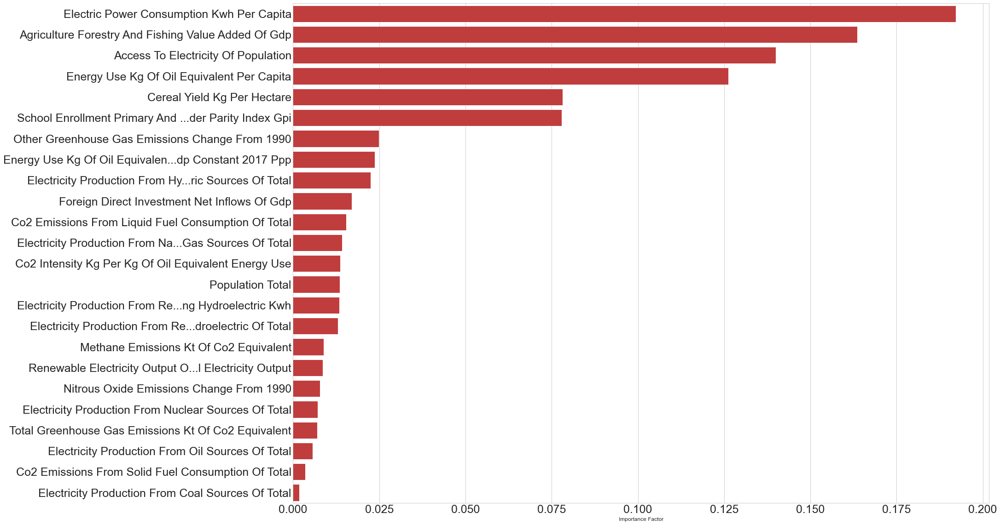

In [ ]:
plt.style.use("seaborn-whitegrid")
f, ax = plt.subplots(figsize=(35, 20))
sns.barplot(x = 'Importance Factor', y = 'index', data = vip, color = 'tab:red')
f.subplots_adjust(left=0.3)
ax.set(ylabel = None, xlabel = None)
ax.tick_params(axis = 'both', labelsize=25)
# plt.savefig("random_forest_vip.eps")

### AdaBoost


In [ ]:
param_grid = {'n_estimators': [10, 30, 50, 100, 250],
             'learning_rate': [1e-7, 1e-5, 1e-3, 1e-1, 1],
             'base_estimator__max_depth': [2, 4, 6, 8, 10],
             'base_estimator__min_samples_leaf':[5, 7, 10]}
ada = AdaBoostClassifier(random_state = 50,
                        base_estimator = DecisionTreeClassifier())
ada_gs = GridSearchCV(estimator = ada,
                     param_grid = param_grid,
                     cv = 3,
                     verbose = 3,
                     scoring = f1_scorer)
search = ada_gs.fit(X_train_2, Y_train_2)

Fitting 3 folds for each of 375 candidates, totalling 1125 fits
[CV 1/3] END base_estimator__max_depth=2, base_estimator__min_samples_leaf=5, learning_rate=1e-07, n_estimators=10;, score=0.813 total time=   0.0s
[CV 2/3] END base_estimator__max_depth=2, base_estimator__min_samples_leaf=5, learning_rate=1e-07, n_estimators=10;, score=0.803 total time=   0.0s
[CV 3/3] END base_estimator__max_depth=2, base_estimator__min_samples_leaf=5, learning_rate=1e-07, n_estimators=10;, score=0.845 total time=   0.0s
[CV 1/3] END base_estimator__max_depth=2, base_estimator__min_samples_leaf=5, learning_rate=1e-07, n_estimators=30;, score=0.813 total time=   0.0s
[CV 2/3] END base_estimator__max_depth=2, base_estimator__min_samples_leaf=5, learning_rate=1e-07, n_estimators=30;, score=0.803 total time=   0.0s
[CV 3/3] END base_estimator__max_depth=2, base_estimator__min_samples_leaf=5, learning_rate=1e-07, n_estimators=30;, score=0.845 total time=   0.0s
[CV 1/3] END base_estimator__max_depth=2, base_e

[CV 2/3] END base_estimator__max_depth=2, base_estimator__min_samples_leaf=5, learning_rate=0.1, n_estimators=100;, score=0.807 total time=   0.1s
[CV 3/3] END base_estimator__max_depth=2, base_estimator__min_samples_leaf=5, learning_rate=0.1, n_estimators=100;, score=0.835 total time=   0.1s
[CV 1/3] END base_estimator__max_depth=2, base_estimator__min_samples_leaf=5, learning_rate=0.1, n_estimators=250;, score=0.844 total time=   0.2s
[CV 2/3] END base_estimator__max_depth=2, base_estimator__min_samples_leaf=5, learning_rate=0.1, n_estimators=250;, score=0.807 total time=   0.2s
[CV 3/3] END base_estimator__max_depth=2, base_estimator__min_samples_leaf=5, learning_rate=0.1, n_estimators=250;, score=0.835 total time=   0.2s
[CV 1/3] END base_estimator__max_depth=2, base_estimator__min_samples_leaf=5, learning_rate=1, n_estimators=10;, score=0.879 total time=   0.0s
[CV 2/3] END base_estimator__max_depth=2, base_estimator__min_samples_leaf=5, learning_rate=1, n_estimators=10;, score=0.

[CV 2/3] END base_estimator__max_depth=2, base_estimator__min_samples_leaf=7, learning_rate=0.001, n_estimators=50;, score=0.855 total time=   0.1s
[CV 3/3] END base_estimator__max_depth=2, base_estimator__min_samples_leaf=7, learning_rate=0.001, n_estimators=50;, score=0.877 total time=   0.1s
[CV 1/3] END base_estimator__max_depth=2, base_estimator__min_samples_leaf=7, learning_rate=0.001, n_estimators=100;, score=0.813 total time=   0.1s
[CV 2/3] END base_estimator__max_depth=2, base_estimator__min_samples_leaf=7, learning_rate=0.001, n_estimators=100;, score=0.855 total time=   0.1s
[CV 3/3] END base_estimator__max_depth=2, base_estimator__min_samples_leaf=7, learning_rate=0.001, n_estimators=100;, score=0.875 total time=   0.1s
[CV 1/3] END base_estimator__max_depth=2, base_estimator__min_samples_leaf=7, learning_rate=0.001, n_estimators=250;, score=0.813 total time=   0.2s
[CV 2/3] END base_estimator__max_depth=2, base_estimator__min_samples_leaf=7, learning_rate=0.001, n_estimat

[CV 2/3] END base_estimator__max_depth=2, base_estimator__min_samples_leaf=10, learning_rate=1e-05, n_estimators=50;, score=0.803 total time=   0.0s
[CV 3/3] END base_estimator__max_depth=2, base_estimator__min_samples_leaf=10, learning_rate=1e-05, n_estimators=50;, score=0.877 total time=   0.0s
[CV 1/3] END base_estimator__max_depth=2, base_estimator__min_samples_leaf=10, learning_rate=1e-05, n_estimators=100;, score=0.813 total time=   0.1s
[CV 2/3] END base_estimator__max_depth=2, base_estimator__min_samples_leaf=10, learning_rate=1e-05, n_estimators=100;, score=0.803 total time=   0.1s
[CV 3/3] END base_estimator__max_depth=2, base_estimator__min_samples_leaf=10, learning_rate=1e-05, n_estimators=100;, score=0.877 total time=   0.1s
[CV 1/3] END base_estimator__max_depth=2, base_estimator__min_samples_leaf=10, learning_rate=1e-05, n_estimators=250;, score=0.813 total time=   0.2s
[CV 2/3] END base_estimator__max_depth=2, base_estimator__min_samples_leaf=10, learning_rate=1e-05, n_

[CV 1/3] END base_estimator__max_depth=4, base_estimator__min_samples_leaf=5, learning_rate=1e-07, n_estimators=50;, score=0.825 total time=   0.1s
[CV 2/3] END base_estimator__max_depth=4, base_estimator__min_samples_leaf=5, learning_rate=1e-07, n_estimators=50;, score=0.809 total time=   0.1s
[CV 3/3] END base_estimator__max_depth=4, base_estimator__min_samples_leaf=5, learning_rate=1e-07, n_estimators=50;, score=0.814 total time=   0.1s
[CV 1/3] END base_estimator__max_depth=4, base_estimator__min_samples_leaf=5, learning_rate=1e-07, n_estimators=100;, score=0.825 total time=   0.1s
[CV 2/3] END base_estimator__max_depth=4, base_estimator__min_samples_leaf=5, learning_rate=1e-07, n_estimators=100;, score=0.809 total time=   0.1s
[CV 3/3] END base_estimator__max_depth=4, base_estimator__min_samples_leaf=5, learning_rate=1e-07, n_estimators=100;, score=0.814 total time=   0.1s
[CV 1/3] END base_estimator__max_depth=4, base_estimator__min_samples_leaf=5, learning_rate=1e-07, n_estimato

[CV 1/3] END base_estimator__max_depth=4, base_estimator__min_samples_leaf=5, learning_rate=1, n_estimators=50;, score=0.878 total time=   0.1s
[CV 2/3] END base_estimator__max_depth=4, base_estimator__min_samples_leaf=5, learning_rate=1, n_estimators=50;, score=0.841 total time=   0.1s
[CV 3/3] END base_estimator__max_depth=4, base_estimator__min_samples_leaf=5, learning_rate=1, n_estimators=50;, score=0.907 total time=   0.1s
[CV 1/3] END base_estimator__max_depth=4, base_estimator__min_samples_leaf=5, learning_rate=1, n_estimators=100;, score=0.878 total time=   0.1s
[CV 2/3] END base_estimator__max_depth=4, base_estimator__min_samples_leaf=5, learning_rate=1, n_estimators=100;, score=0.841 total time=   0.1s
[CV 3/3] END base_estimator__max_depth=4, base_estimator__min_samples_leaf=5, learning_rate=1, n_estimators=100;, score=0.907 total time=   0.1s
[CV 1/3] END base_estimator__max_depth=4, base_estimator__min_samples_leaf=5, learning_rate=1, n_estimators=250;, score=0.858 total t

[CV 1/3] END base_estimator__max_depth=4, base_estimator__min_samples_leaf=7, learning_rate=0.1, n_estimators=50;, score=0.859 total time=   0.1s
[CV 2/3] END base_estimator__max_depth=4, base_estimator__min_samples_leaf=7, learning_rate=0.1, n_estimators=50;, score=0.855 total time=   0.1s
[CV 3/3] END base_estimator__max_depth=4, base_estimator__min_samples_leaf=7, learning_rate=0.1, n_estimators=50;, score=0.803 total time=   0.1s
[CV 1/3] END base_estimator__max_depth=4, base_estimator__min_samples_leaf=7, learning_rate=0.1, n_estimators=100;, score=0.859 total time=   0.1s
[CV 2/3] END base_estimator__max_depth=4, base_estimator__min_samples_leaf=7, learning_rate=0.1, n_estimators=100;, score=0.888 total time=   0.1s
[CV 3/3] END base_estimator__max_depth=4, base_estimator__min_samples_leaf=7, learning_rate=0.1, n_estimators=100;, score=0.832 total time=   0.1s
[CV 1/3] END base_estimator__max_depth=4, base_estimator__min_samples_leaf=7, learning_rate=0.1, n_estimators=250;, score

[CV 1/3] END base_estimator__max_depth=4, base_estimator__min_samples_leaf=10, learning_rate=0.001, n_estimators=50;, score=0.880 total time=   0.1s
[CV 2/3] END base_estimator__max_depth=4, base_estimator__min_samples_leaf=10, learning_rate=0.001, n_estimators=50;, score=0.821 total time=   0.1s
[CV 3/3] END base_estimator__max_depth=4, base_estimator__min_samples_leaf=10, learning_rate=0.001, n_estimators=50;, score=0.914 total time=   0.1s
[CV 1/3] END base_estimator__max_depth=4, base_estimator__min_samples_leaf=10, learning_rate=0.001, n_estimators=100;, score=0.862 total time=   0.1s
[CV 2/3] END base_estimator__max_depth=4, base_estimator__min_samples_leaf=10, learning_rate=0.001, n_estimators=100;, score=0.855 total time=   0.1s
[CV 3/3] END base_estimator__max_depth=4, base_estimator__min_samples_leaf=10, learning_rate=0.001, n_estimators=100;, score=0.912 total time=   0.1s
[CV 1/3] END base_estimator__max_depth=4, base_estimator__min_samples_leaf=10, learning_rate=0.001, n_e

[CV 1/3] END base_estimator__max_depth=6, base_estimator__min_samples_leaf=5, learning_rate=1e-05, n_estimators=50;, score=0.825 total time=   0.1s
[CV 2/3] END base_estimator__max_depth=6, base_estimator__min_samples_leaf=5, learning_rate=1e-05, n_estimators=50;, score=0.809 total time=   0.1s
[CV 3/3] END base_estimator__max_depth=6, base_estimator__min_samples_leaf=5, learning_rate=1e-05, n_estimators=50;, score=0.814 total time=   0.1s
[CV 1/3] END base_estimator__max_depth=6, base_estimator__min_samples_leaf=5, learning_rate=1e-05, n_estimators=100;, score=0.825 total time=   0.1s
[CV 2/3] END base_estimator__max_depth=6, base_estimator__min_samples_leaf=5, learning_rate=1e-05, n_estimators=100;, score=0.809 total time=   0.1s
[CV 3/3] END base_estimator__max_depth=6, base_estimator__min_samples_leaf=5, learning_rate=1e-05, n_estimators=100;, score=0.814 total time=   0.1s
[CV 1/3] END base_estimator__max_depth=6, base_estimator__min_samples_leaf=5, learning_rate=1e-05, n_estimato

[CV 1/3] END base_estimator__max_depth=6, base_estimator__min_samples_leaf=7, learning_rate=1e-07, n_estimators=50;, score=0.709 total time=   0.1s
[CV 2/3] END base_estimator__max_depth=6, base_estimator__min_samples_leaf=7, learning_rate=1e-07, n_estimators=50;, score=0.803 total time=   0.1s
[CV 3/3] END base_estimator__max_depth=6, base_estimator__min_samples_leaf=7, learning_rate=1e-07, n_estimators=50;, score=0.877 total time=   0.1s
[CV 1/3] END base_estimator__max_depth=6, base_estimator__min_samples_leaf=7, learning_rate=1e-07, n_estimators=100;, score=0.709 total time=   0.1s
[CV 2/3] END base_estimator__max_depth=6, base_estimator__min_samples_leaf=7, learning_rate=1e-07, n_estimators=100;, score=0.803 total time=   0.1s
[CV 3/3] END base_estimator__max_depth=6, base_estimator__min_samples_leaf=7, learning_rate=1e-07, n_estimators=100;, score=0.877 total time=   0.1s
[CV 1/3] END base_estimator__max_depth=6, base_estimator__min_samples_leaf=7, learning_rate=1e-07, n_estimato

[CV 1/3] END base_estimator__max_depth=6, base_estimator__min_samples_leaf=7, learning_rate=1, n_estimators=50;, score=0.842 total time=   0.1s
[CV 2/3] END base_estimator__max_depth=6, base_estimator__min_samples_leaf=7, learning_rate=1, n_estimators=50;, score=0.875 total time=   0.1s
[CV 3/3] END base_estimator__max_depth=6, base_estimator__min_samples_leaf=7, learning_rate=1, n_estimators=50;, score=0.907 total time=   0.1s
[CV 1/3] END base_estimator__max_depth=6, base_estimator__min_samples_leaf=7, learning_rate=1, n_estimators=100;, score=0.842 total time=   0.1s
[CV 2/3] END base_estimator__max_depth=6, base_estimator__min_samples_leaf=7, learning_rate=1, n_estimators=100;, score=0.890 total time=   0.1s
[CV 3/3] END base_estimator__max_depth=6, base_estimator__min_samples_leaf=7, learning_rate=1, n_estimators=100;, score=0.890 total time=   0.1s
[CV 1/3] END base_estimator__max_depth=6, base_estimator__min_samples_leaf=7, learning_rate=1, n_estimators=250;, score=0.842 total t

[CV 1/3] END base_estimator__max_depth=6, base_estimator__min_samples_leaf=10, learning_rate=0.1, n_estimators=50;, score=0.842 total time=   0.1s
[CV 2/3] END base_estimator__max_depth=6, base_estimator__min_samples_leaf=10, learning_rate=0.1, n_estimators=50;, score=0.822 total time=   0.1s
[CV 3/3] END base_estimator__max_depth=6, base_estimator__min_samples_leaf=10, learning_rate=0.1, n_estimators=50;, score=0.857 total time=   0.1s
[CV 1/3] END base_estimator__max_depth=6, base_estimator__min_samples_leaf=10, learning_rate=0.1, n_estimators=100;, score=0.825 total time=   0.1s
[CV 2/3] END base_estimator__max_depth=6, base_estimator__min_samples_leaf=10, learning_rate=0.1, n_estimators=100;, score=0.832 total time=   0.1s
[CV 3/3] END base_estimator__max_depth=6, base_estimator__min_samples_leaf=10, learning_rate=0.1, n_estimators=100;, score=0.857 total time=   0.1s
[CV 1/3] END base_estimator__max_depth=6, base_estimator__min_samples_leaf=10, learning_rate=0.1, n_estimators=250;

[CV 1/3] END base_estimator__max_depth=8, base_estimator__min_samples_leaf=5, learning_rate=0.001, n_estimators=50;, score=0.829 total time=   0.1s
[CV 2/3] END base_estimator__max_depth=8, base_estimator__min_samples_leaf=5, learning_rate=0.001, n_estimators=50;, score=0.825 total time=   0.1s
[CV 3/3] END base_estimator__max_depth=8, base_estimator__min_samples_leaf=5, learning_rate=0.001, n_estimators=50;, score=0.895 total time=   0.1s
[CV 1/3] END base_estimator__max_depth=8, base_estimator__min_samples_leaf=5, learning_rate=0.001, n_estimators=100;, score=0.844 total time=   0.1s
[CV 2/3] END base_estimator__max_depth=8, base_estimator__min_samples_leaf=5, learning_rate=0.001, n_estimators=100;, score=0.825 total time=   0.1s
[CV 3/3] END base_estimator__max_depth=8, base_estimator__min_samples_leaf=5, learning_rate=0.001, n_estimators=100;, score=0.895 total time=   0.1s
[CV 1/3] END base_estimator__max_depth=8, base_estimator__min_samples_leaf=5, learning_rate=0.001, n_estimato

[CV 1/3] END base_estimator__max_depth=8, base_estimator__min_samples_leaf=7, learning_rate=1e-05, n_estimators=50;, score=0.709 total time=   0.1s
[CV 2/3] END base_estimator__max_depth=8, base_estimator__min_samples_leaf=7, learning_rate=1e-05, n_estimators=50;, score=0.803 total time=   0.1s
[CV 3/3] END base_estimator__max_depth=8, base_estimator__min_samples_leaf=7, learning_rate=1e-05, n_estimators=50;, score=0.877 total time=   0.1s
[CV 1/3] END base_estimator__max_depth=8, base_estimator__min_samples_leaf=7, learning_rate=1e-05, n_estimators=100;, score=0.709 total time=   0.1s
[CV 2/3] END base_estimator__max_depth=8, base_estimator__min_samples_leaf=7, learning_rate=1e-05, n_estimators=100;, score=0.803 total time=   0.1s
[CV 3/3] END base_estimator__max_depth=8, base_estimator__min_samples_leaf=7, learning_rate=1e-05, n_estimators=100;, score=0.877 total time=   0.1s
[CV 1/3] END base_estimator__max_depth=8, base_estimator__min_samples_leaf=7, learning_rate=1e-05, n_estimato

[CV 1/3] END base_estimator__max_depth=8, base_estimator__min_samples_leaf=10, learning_rate=1e-07, n_estimators=50;, score=0.813 total time=   0.1s
[CV 2/3] END base_estimator__max_depth=8, base_estimator__min_samples_leaf=10, learning_rate=1e-07, n_estimators=50;, score=0.769 total time=   0.1s
[CV 3/3] END base_estimator__max_depth=8, base_estimator__min_samples_leaf=10, learning_rate=1e-07, n_estimators=50;, score=0.877 total time=   0.1s
[CV 1/3] END base_estimator__max_depth=8, base_estimator__min_samples_leaf=10, learning_rate=1e-07, n_estimators=100;, score=0.813 total time=   0.1s
[CV 2/3] END base_estimator__max_depth=8, base_estimator__min_samples_leaf=10, learning_rate=1e-07, n_estimators=100;, score=0.769 total time=   0.1s
[CV 3/3] END base_estimator__max_depth=8, base_estimator__min_samples_leaf=10, learning_rate=1e-07, n_estimators=100;, score=0.877 total time=   0.1s
[CV 1/3] END base_estimator__max_depth=8, base_estimator__min_samples_leaf=10, learning_rate=1e-07, n_e

[CV 1/3] END base_estimator__max_depth=8, base_estimator__min_samples_leaf=10, learning_rate=1, n_estimators=50;, score=0.842 total time=   0.1s
[CV 2/3] END base_estimator__max_depth=8, base_estimator__min_samples_leaf=10, learning_rate=1, n_estimators=50;, score=0.838 total time=   0.1s
[CV 3/3] END base_estimator__max_depth=8, base_estimator__min_samples_leaf=10, learning_rate=1, n_estimators=50;, score=0.894 total time=   0.1s
[CV 1/3] END base_estimator__max_depth=8, base_estimator__min_samples_leaf=10, learning_rate=1, n_estimators=100;, score=0.842 total time=   0.1s
[CV 2/3] END base_estimator__max_depth=8, base_estimator__min_samples_leaf=10, learning_rate=1, n_estimators=100;, score=0.858 total time=   0.1s
[CV 3/3] END base_estimator__max_depth=8, base_estimator__min_samples_leaf=10, learning_rate=1, n_estimators=100;, score=0.929 total time=   0.1s
[CV 1/3] END base_estimator__max_depth=8, base_estimator__min_samples_leaf=10, learning_rate=1, n_estimators=250;, score=0.842 

[CV 1/3] END base_estimator__max_depth=10, base_estimator__min_samples_leaf=5, learning_rate=0.1, n_estimators=50;, score=0.841 total time=   0.1s
[CV 2/3] END base_estimator__max_depth=10, base_estimator__min_samples_leaf=5, learning_rate=0.1, n_estimators=50;, score=0.838 total time=   0.1s
[CV 3/3] END base_estimator__max_depth=10, base_estimator__min_samples_leaf=5, learning_rate=0.1, n_estimators=50;, score=0.864 total time=   0.1s
[CV 1/3] END base_estimator__max_depth=10, base_estimator__min_samples_leaf=5, learning_rate=0.1, n_estimators=100;, score=0.820 total time=   0.1s
[CV 2/3] END base_estimator__max_depth=10, base_estimator__min_samples_leaf=5, learning_rate=0.1, n_estimators=100;, score=0.858 total time=   0.1s
[CV 3/3] END base_estimator__max_depth=10, base_estimator__min_samples_leaf=5, learning_rate=0.1, n_estimators=100;, score=0.880 total time=   0.1s
[CV 1/3] END base_estimator__max_depth=10, base_estimator__min_samples_leaf=5, learning_rate=0.1, n_estimators=250;

[CV 1/3] END base_estimator__max_depth=10, base_estimator__min_samples_leaf=7, learning_rate=0.001, n_estimators=50;, score=0.820 total time=   0.1s
[CV 2/3] END base_estimator__max_depth=10, base_estimator__min_samples_leaf=7, learning_rate=0.001, n_estimators=50;, score=0.821 total time=   0.1s
[CV 3/3] END base_estimator__max_depth=10, base_estimator__min_samples_leaf=7, learning_rate=0.001, n_estimators=50;, score=0.877 total time=   0.1s
[CV 1/3] END base_estimator__max_depth=10, base_estimator__min_samples_leaf=7, learning_rate=0.001, n_estimators=100;, score=0.842 total time=   0.1s
[CV 2/3] END base_estimator__max_depth=10, base_estimator__min_samples_leaf=7, learning_rate=0.001, n_estimators=100;, score=0.873 total time=   0.1s
[CV 3/3] END base_estimator__max_depth=10, base_estimator__min_samples_leaf=7, learning_rate=0.001, n_estimators=100;, score=0.946 total time=   0.1s
[CV 1/3] END base_estimator__max_depth=10, base_estimator__min_samples_leaf=7, learning_rate=0.001, n_e

[CV 1/3] END base_estimator__max_depth=10, base_estimator__min_samples_leaf=10, learning_rate=1e-05, n_estimators=50;, score=0.813 total time=   0.1s
[CV 2/3] END base_estimator__max_depth=10, base_estimator__min_samples_leaf=10, learning_rate=1e-05, n_estimators=50;, score=0.769 total time=   0.1s
[CV 3/3] END base_estimator__max_depth=10, base_estimator__min_samples_leaf=10, learning_rate=1e-05, n_estimators=50;, score=0.877 total time=   0.1s
[CV 1/3] END base_estimator__max_depth=10, base_estimator__min_samples_leaf=10, learning_rate=1e-05, n_estimators=100;, score=0.813 total time=   0.1s
[CV 2/3] END base_estimator__max_depth=10, base_estimator__min_samples_leaf=10, learning_rate=1e-05, n_estimators=100;, score=0.769 total time=   0.1s
[CV 3/3] END base_estimator__max_depth=10, base_estimator__min_samples_leaf=10, learning_rate=1e-05, n_estimators=100;, score=0.877 total time=   0.1s
[CV 1/3] END base_estimator__max_depth=10, base_estimator__min_samples_leaf=10, learning_rate=1e-

In [ ]:
pd.DataFrame(search.cv_results_) # The results of the cv

,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_base_estimator__max_depth,param_base_estimator__min_samples_leaf,param_learning_rate,param_n_estimators,params,split0_test_score,split1_test_score,split2_test_score,mean_test_score,std_test_score,rank_test_score
0,0.013742,0.001704,0.002112,0.000234,2,5,0.0,10,"{'base_estimator__max_depth': 2, 'base_estimat...",0.812584,0.802519,0.844667,0.819923,0.017972,235
1,0.029553,0.000257,0.003307,0.000298,2,5,0.0,30,"{'base_estimator__max_depth': 2, 'base_estimat...",0.812584,0.802519,0.844667,0.819923,0.017972,235
2,0.046438,0.001832,0.004250,0.000139,2,5,0.0,50,"{'base_estimator__max_depth': 2, 'base_estimat...",0.812584,0.802519,0.844667,0.819923,0.017972,235
3,0.089916,0.002049,0.007269,0.000143,2,5,0.0,100,"{'base_estimator__max_depth': 2, 'base_estimat...",0.812584,0.802519,0.844667,0.819923,0.017972,235
4,0.220558,0.001575,0.017042,0.000357,2,5,0.0,250,"{'base_estimator__max_depth': 2, 'base_estimat...",0.812584,0.802519,0.844667,0.819923,0.017972,235
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
370,0.011720,0.000292,0.001765,0.000078,10,10,1,10,"{'base_estimator__max_depth': 10, 'base_estima...",0.794171,0.826712,0.842910,0.821264,0.020267,232
371,0.031926,0.000224,0.002932,0.000021,10,10,1,30,"{'base_estimator__max_depth': 10, 'base_estima...",0.819540,0.819866,0.894296,0.844567,0.035164,132
372,0.053479,0.001594,0.004469,0.000290,10,10,1,50,"{'base_estimator__max_depth': 10, 'base_estima...",0.841719,0.837967,0.893915,0.857867,0.025536,88
373,0.106338,0.002560,0.008031,0.000237,10,10,1,100,"{'base_estimator__max_depth': 10, 'base_estima...",0.841719,0.858213,0.928806,0.876246,0.037771,27


In [ ]:
search.best_params_

{'base_estimator__max_depth': 8,
 'base_estimator__min_samples_leaf': 5,
 'learning_rate': 1,
 'n_estimators': 30}

In [ ]:
ada_final = AdaBoostClassifier(random_state = 50,
                              base_estimator = DecisionTreeClassifier(max_depth = 8,
                                                                     min_samples_leaf = 5),
                              n_estimators = 30,
                              learning_rate = 1)
ada_final.fit(X_train_2, Y_train_2)

AdaBoostClassifier(base_estimator=DecisionTreeClassifier(max_depth=8,
                                                         min_samples_leaf=5),
                   learning_rate=1, n_estimators=30, random_state=50)

In [ ]:
Y_pred_2 = ada_final.predict(X_test_2)

In [ ]:
print(classification_report(Y_test_2, Y_pred_2))

               precision    recall  f1-score   support

  High income       1.00      0.92      0.96        13
   Low income       1.00      0.75      0.86         8
Middle income       0.88      1.00      0.94        23

     accuracy                           0.93        44
    macro avg       0.96      0.89      0.92        44
 weighted avg       0.94      0.93      0.93        44

